# Regression Predict - Team EG3: Intelli Data

© Explore Data Science Academy

---
### Honour Code

I {**Christelle Coetzee, Destiny Owobu, Anthonia Omonayin, Edidiong Michael Udofia, Mashako Justice Manyelo, Pricilla Vhafuniwa Ndou**}, confirm - by submitting this document - that the solutions in this notebook are a result of my own work and that I abide by the [EDSA honour code](https://drive.google.com/file/d/1QDCjGZJ8-FmJE3bZdIQNwnJyQKPhHZBn/view?usp=sharing).

Non-compliance with the honour code constitutes a material breach of contract.

### Predict Overview: Spain Electricity Shortfall Challenge

The government of Spain is considering an expansion of it's renewable energy resource infrastructure investments. As such, they require information on the trends and patterns of the countries renewable sources and fossil fuel energy generation. Your company has been awarded the contract to:

- 1. analyse the supplied data;
- 2. identify potential errors in the data and clean the existing data set;
- 3. determine if additional features can be added to enrich the data set;
- 4. build a model that is capable of forecasting the three hourly demand shortfalls;
- 5. evaluate the accuracy of the best machine learning model;
- 6. determine what features were most important in the model’s prediction decision, and
- 7. explain the inner working of the model to a non-technical audience.

Formally the problem statement was given to you, the senior data scientist, by your manager via email reads as follow:

> In this project you are tasked to model the shortfall between the energy generated by means of fossil fuels and various renewable sources - for the country of Spain. The daily shortfall, which will be referred to as the target variable, will be modelled as a function of various city-specific weather features such as `pressure`, `wind speed`, `humidity`, etc. As with all data science projects, the provided features are rarely adequate predictors of the target variable. As such, you are required to perform feature engineering to ensure that you will be able to accurately model Spain's three hourly shortfalls.
 
On top of this, she has provided you with a starter notebook containing vague explanations of what the main outcomes are. 

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

 <a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section you are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

In [1400]:
# Libraries for data loading, data manipulation and data visulisation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from datetime import datetime

# Libraries that helps with statistical methods and visualizations
from  scipy import stats
from scipy.stats import norm
from scipy.stats import pearsonr
from statsmodels.formula.api import ols
import statsmodels.formula.api as sm
from statsmodels.stats.outliers_influence import OLSInfluence as influence
from sklearn.tree import plot_tree

# Libraries for data preparation and model building
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from mpl_toolkits.mplot3d import Axes3D
import math
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Lasso
from sklearn.ensemble import VotingRegressor
from sklearn.svm import SVR
import catboost as cb 
from sklearn.metrics import accuracy_score
import xgboost as xgb
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import StackingRegressor

# Setting global constants to ensure notebook results are reproducible
TRAIN_TEST_VAR = 0.2 #Variable indicating the ratio of Training to Testing data when splitting datasets for validation
K_FOLD = 10 #Variable used during k-fold validation processes
RAND_STATE = 42 #Variable used to determine random state of methods in order to replicate model training results

<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section you are required to load the data from the `df_train` file, as well as the `df_test` file, into a DataFrame. |

---

In [1401]:
df = pd.read_csv('df_train.csv')
df_test = pd.read_csv('df_test.csv')

<a id="four"></a>
## 3. Data Overview
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Data overview ⚡ |
| :--------------------------- |
| In this section we will look at the data and determine if there are any missing values, redundant columns, or object data that need to be converted into numerical data. |

---

#### **3.1. Data Overview**:

We employ the `head()` function to examine the initial two rows of our dataset. This preliminary inspection enables us to discern the nature of our data effectively. Through this examination, we classify columns into distinct categories: categorical and numerical. Presently, our dataset comprises a specific number of columns in each category, providing valuable insights into the composition of our data. This meticulous categorization forms the foundation for our subsequent data preprocessing and modeling endeavors.

In [1402]:
df.head(2)

,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
0,0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.0,...,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.0,...,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667


In reviewing the provided dataframe, several key observations come to light:

- There is an `Unnamed: 0 column`, which appears to duplicate the dataframe's index.
- The time column captures the date and time corresponding to the data collection instances.
- The dataset contains multiple weather-related variables from various cities across Spain.
- Notably, the predictor variables are followed by our target variable, `load_shortfall_3h`, which occupies the final column in our dataframe. This structured arrangement facilitates a clear distinction between predictor and target variables, crucial for subsequent analysis and modeling endeavors.

The `shape()` function is employed to ascertain the dimensions of our data. Specifically, this method provides us with the count of rows and columns present in the dataset. Understanding the size of our dataset is fundamental to structuring our analysis and implementing appropriate data processing techniques.

In [1403]:
df.shape 

(8763, 49)

In [1404]:
df_test.shape 

(2920, 48)

Upon applying the `shape()` function, it is revealed that our dataset comprises 8763 rows and 49 columns. It is important to note that the test train dataset only has 2920 rows and 48 colums, since it doen't include our y-variable, `load_shortfall_3h`. This comprehensive understanding of the dataset's dimensions serves as a cornerstone for our subsequent data analysis, feature engineering, and model development processes.

Given the expansive nature of our dataset with 49 columns, it is impractical to visualize all the columns simultaneously. To gain insight into the available features, we employ the `df_train.columns` attribute. This allows us to view the names of all the columns, providing a concise overview of the variables at our disposal.

In [1405]:
df.columns

Index(['Unnamed: 0', 'time', 'Madrid_wind_speed', 'Valencia_wind_deg',
       'Bilbao_rain_1h', 'Valencia_wind_speed', 'Seville_humidity',
       'Madrid_humidity', 'Bilbao_clouds_all', 'Bilbao_wind_speed',
       'Seville_clouds_all', 'Bilbao_wind_deg', 'Barcelona_wind_speed',
       'Barcelona_wind_deg', 'Madrid_clouds_all', 'Seville_wind_speed',
       'Barcelona_rain_1h', 'Seville_pressure', 'Seville_rain_1h',
       'Bilbao_snow_3h', 'Barcelona_pressure', 'Seville_rain_3h',
       'Madrid_rain_1h', 'Barcelona_rain_3h', 'Valencia_snow_3h',
       'Madrid_weather_id', 'Barcelona_weather_id', 'Bilbao_pressure',
       'Seville_weather_id', 'Valencia_pressure', 'Seville_temp_max',
       'Madrid_pressure', 'Valencia_temp_max', 'Valencia_temp',
       'Bilbao_weather_id', 'Seville_temp', 'Valencia_humidity',
       'Valencia_temp_min', 'Barcelona_temp_max', 'Madrid_temp_max',
       'Barcelona_temp', 'Bilbao_temp_min', 'Bilbao_temp',
       'Barcelona_temp_min', 'Bilbao_temp_max', 'Sev

We utilize the `info()` function. This method offers a comprehensive summary of our dataset, providing crucial information such as the presence of categorical and numerical features, as well as detecting any null or missing values. By leveraging this function, we ensure a thorough understanding of our data's structure, enabling us to address potential data inconsistencies and prepare a clean, reliable dataset for our analytical and modeling endeavors.

In [1406]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 49 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            8763 non-null   int64  
 1   time                  8763 non-null   object 
 2   Madrid_wind_speed     8763 non-null   float64
 3   Valencia_wind_deg     8763 non-null   object 
 4   Bilbao_rain_1h        8763 non-null   float64
 5   Valencia_wind_speed   8763 non-null   float64
 6   Seville_humidity      8763 non-null   float64
 7   Madrid_humidity       8763 non-null   float64
 8   Bilbao_clouds_all     8763 non-null   float64
 9   Bilbao_wind_speed     8763 non-null   float64
 10  Seville_clouds_all    8763 non-null   float64
 11  Bilbao_wind_deg       8763 non-null   float64
 12  Barcelona_wind_speed  8763 non-null   float64
 13  Barcelona_wind_deg    8763 non-null   float64
 14  Madrid_clouds_all     8763 non-null   float64
 15  Seville_wind_speed   

In our comprehensive data summary, several key insights emerge:

- The majority of our data is numeric, although exceptions include the time, `Valencia_wind_deg`, and `Seville_pressure` columns.
- Our dataset comprises 8763 entries and encompasses 49 columns, with `load_shortfall_3h` serving as the target variable.
- Notably, upon closer inspection, it becomes apparent that the `Valencia_pressure` column contains fewer non-null values, suggesting the presence of missing data for this particular variable.

To facilitate a robust Exploratory Data Analysis (EDA), it is imperative to conduct preliminary data cleaning and organization within our dataframe. 

<a id="four"></a>
## 4. Data Cleaning
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Data cleaning ⚡ |
| :--------------------------- |
| Now that we have determined the missing values, redundant columns, and incorrect data types, we need to clean the data in order for it to be workable and reliable. |

---

#### **4.1. Remove Missing and Redundant Features in Both The `Train` and `Test` Datasets**:

To maintain a clear demarcation between the cleaned and original datasets, we will create a new dataset named `df_clean`. This separation ensures that our cleaned data remains distinct and preserved, allowing us to conduct analysis and modeling on a curated dataset while retaining the integrity of the original data for reference and comparative purposes.

In [1407]:
df_clean = df

Our initial cleaning step involves the removal of the `Unnamed: 0` column, which is redundant given the presence of an existing indexing column. This elimination optimizes the structure of our dataset, enhancing clarity and simplifying subsequent data analysis and modeling processes.

In [1408]:
df_clean.drop(columns=['Unnamed: 0'], inplace=True)

In [1409]:
df_test.drop(columns=['Unnamed: 0'], inplace=True)

As a part of our data cleansing process, we will address the null values in the `Valencia_pressure` column. To do so, we will replace these missing values with the mode of the column. Utilizing the mode as the replacement strategy is appropriate for 'pressure' variables, as it signifies the most frequently occurring value and aligns with the nature of the data. This approach ensures the integrity of our dataset by imputing missing values with the most representative and common pressure reading.

In [1410]:
print('Mode:') 
print(df['Valencia_pressure'].mode())

Mode:
0    1018.0
Name: Valencia_pressure, dtype: float64


In [1411]:
df_clean['Valencia_pressure'] = df_clean['Valencia_pressure'].fillna(df_clean['Valencia_pressure'].mode()[0])

In [1412]:
df_test['Valencia_pressure'] = df_test['Valencia_pressure'].fillna(df_clean['Valencia_pressure'].mode()[0])

"To validate the success of our data cleaning procedure, we can use the `df_clean['Valencia_pressure'].isnull().sum()` function. This expression allows us to check if there are any remaining null values specifically within the 'Valencia_pressure' column of the cleaned dataset (df_clean). 

In [1413]:
vptr = df_clean.Valencia_pressure.isnull().sum()

print('Valencia_pressure in the train dataset now has ' + str(vptr) + ' missing values.')

Valencia_pressure in the train dataset now has 0 missing values.


In [1414]:
vpts = df_test.Valencia_pressure.isnull().sum()

print('Valencia_pressure in the test dataset now has ' + str(vpts) + ' missing values.')

Valencia_pressure in the test dataset now has 0 missing values.


A zero count of null values in this column confirms the effectiveness of our imputation method, ensuring the absence of missing data in the specified column after our cleaning process.

#### **4.2. Create New Features**:

##### 4.2.1. Covert 'time' into datetime:

As part of feature engineering, we will transform the 'time' column into a datetime format. This conversion is essential for working with temporal data, allowing us to perform time-based analysis and modeling. By converting the 'time' column to datetime format, we enhance the usability of this information, enabling more sophisticated insights into our dataset.

In [1415]:
df_clean['time'] = pd.to_datetime(df_clean['time'])

In [1416]:
df_test['time'] = pd.to_datetime(df_test['time'])

As an additional feature, we will create a new variable that represents the hour of the day based on the 'time' column. Extracting the hour information is valuable for time-based analysis, allowing us to discern patterns and trends related to specific hours. This new variable will provide a granular perspective on our data, enhancing our ability to explore time-sensitive relationships within the dataset.

In [1417]:
df_clean['hourofday'] = df_clean['time'].dt.hour

In [1418]:
df_test['hourofday'] = df_test['time'].dt.hour

To ensure the successful transformation, we can use the `df_clean['hourofday']` function and confirm that the data is now represented as integers. This verification step ensures that the 'hourofday' variable has been correctly processed and is in the desired integer data type, enabling seamless integration into our analysis and modeling workflows.

In [1419]:
df_clean['hourofday']

0        3
1        6
2        9
3       12
4       15
        ..
8758     9
8759    12
8760    15
8761    18
8762    21
Name: hourofday, Length: 8763, dtype: int64

In [1420]:
df_test['hourofday']

0        0
1        3
2        6
3        9
4       12
        ..
2915     9
2916    12
2917    15
2918    18
2919    21
Name: hourofday, Length: 2920, dtype: int64

##### 4.2.2. Seperate the 'time' and 'date':

As part of data preprocessing, we will split the 'time' column into separate 'date' and 'time' columns. This separation allows us to independently analyze date-related patterns. By organizing the data in this manner, we enhance the granularity of our analysis, enabling more focused exploration of temporal aspects in our dataset.

In [1421]:
df_clean['date'] = df_clean['time'].dt.date
df_clean['time'] = df_clean['time'].dt.time

In [1422]:
df_test['date'] = df_test['time'].dt.date
df_test['time'] = df_test['time'].dt.time

##### 4.2.3. Covert the 'date' into datetime:

To facilitate proper handling and analysis of the 'date' column, we will convert it into datetime format. This conversion ensures that date-related operations can be performed accurately, allowing for meaningful temporal analysis and modeling.

In [1423]:
df_clean['date'] = pd.to_datetime(df_clean['date'])

In [1424]:
df_test['date'] = pd.to_datetime(df_test['date'])

##### 4.2.4. Seperate the 'date' into 'year', 'month', 'day', and 'season':

As part of our data processing, we will extract the year, month, and day information from the 'date' column. This extraction process will yield separate variables representing the year, month, and day, allowing for detailed temporal analysis at different levels of granularity. By extracting these components, we enhance our ability to explore and understand date-related patterns within the dataset.

In [1425]:
df_clean['year'] = df_clean['date'].dt.year
df_clean['month'] = df_clean['date'].dt.month
df_clean['day'] = df_clean['date'].dt.day

In [1426]:
df_test['year'] = df_test['date'].dt.year
df_test['month'] = df_test['date'].dt.month
df_test['day'] = df_test['date'].dt.day

In the process of data preparation, a function has been defined to rigorously classify months into distinct seasonal categories. This meticulous categorization is essential for precise temporal analysis, allowing for in-depth exploration of seasonal patterns within the dataset.

In [1427]:
def get_season(month):
    if month in [3, 4, 5]:  # Spring: March (3) to May (5)
        return 2 # 2 = spring, coverted to an int for workability
    elif month in [6, 7, 8]:  # Summer: June (6) to August (8)
        return 3 # 3 = summer, coverted to an int for workability
    elif month in [9, 10, 11]:  # Autumn: September (9) to November (11)
        return 4 # 4 = autumn, coverted to an int for workability
    else:  # Winter: December (12), January (1), February (2)
        return 1 # 1 = winter, coverted to an int for workability

As a strategic step in our data transformation process, we have applied the meticulously crafted function to create a new column named 'season.' 

In [1428]:
df_clean['season'] = df_clean['month'].apply(get_season)

In [1429]:
df_test['season'] = df_test['month'].apply(get_season)

We have created a new DataFrame featuring key temporal attributes. This includes the 'year', 'month', 'day', and 'season' columns, meticulously extracted and classified from the original dataset. This refined DataFrame serves as a comprehensive temporal representation of our data, providing essential granularity for our analytical pursuits. The inclusion of these structured features enhances our dataset's depth, ensuring it is poised for rigorous exploration and advanced modeling methodologies.

##### 4.2.5. Remove the 'time' and 'date' column:

In our meticulous data preparation, we have identified both the 'time' and 'date' columns as redundant following the creation of more granular temporal features such as 'hourofday', 'year', 'month', 'day', and 'season'. Consequently, we have prudently removed these redundant columns. This strategic decision streamlines our dataset, eliminating unnecessary information and promoting a streamlined, efficient structure. By eliminating these superfluous columns, we enhance the precision and focus of our data, reinforcing its readiness for advanced analytical methodologies and modeling processes.

In [1430]:
df_clean.drop(columns=['time'], inplace=True)

In [1431]:
df_test.drop(columns=['time'], inplace=True)

In [1432]:
df_clean.drop(columns=['date'], inplace=True)

In [1433]:
df_test.drop(columns=['date'], inplace=True)

In order to validate the applied enhancements, we will meticulously examine the initial two rows of the refined DataFrame. This critical step ensures the accuracy and integrity of our data processing procedures, setting the stage for a robust and reliable modeling process.

In [1434]:
df_clean.head(2)

,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,...,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h,hourofday,year,month,day,season
0,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.0,0.0,223.333333,...,269.338615,274.254667,265.938000,265.938000,6715.666667,3,2015,1,1,1
1,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.0,0.0,221.000000,...,270.376000,274.945000,266.386667,266.386667,4171.666667,6,2015,1,1,1


In [1435]:
df_test.head(2)

,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,...,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,hourofday,year,month,day,season
0,5.000000,level_8,0.0,5.000000,87.0,71.333333,20.0,3.000000,0.0,193.333333,...,286.816667,285.15,283.15,279.866667,279.15,0,2018,1,1,1
1,4.666667,level_8,0.0,5.333333,89.0,78.000000,0.0,3.666667,0.0,143.333333,...,283.483333,284.15,281.15,279.193333,278.15,3,2018,1,1,1


When scrolling to the conclusion of the dataset, one can observe the integration of the newly created columns.

##### 4.2.6. Convert 'Valencia_wind_deg' into an int:

To refine the 'Valencia_wind_deg' column further, we will extract only the numerical values.

In [1436]:
df_clean['Valencia_wind_deg'] = df_clean['Valencia_wind_deg'].str.extract('(\d+)')

In [1437]:
df_test['Valencia_wind_deg'] = df_test['Valencia_wind_deg'].str.extract('(\d+)')

Next, we will transform the 'Valencia_wind_deg' column to a numeric data type. his conversion ensures uniform numerical representation, aligning with the datatype requirements for precise analysis and modeling.

In [1438]:
df_clean['Valencia_wind_deg'] = pd.to_numeric(df_clean['Valencia_wind_deg'])

In [1439]:
df_test['Valencia_wind_deg'] = pd.to_numeric(df_test['Valencia_wind_deg'])

To validate the successful transformation, we will conduct a verification check to confirm the 'Valencia_wind_deg' column has been converted to the numeric data type.

In [1440]:
df_clean.Valencia_wind_deg

0        5
1       10
2        9
3        8
4        7
        ..
8758     6
8759     6
8760     9
8761     8
8762     9
Name: Valencia_wind_deg, Length: 8763, dtype: int64

In [1441]:
df_test.Valencia_wind_deg

0        8
1        8
2        7
3        7
4        7
        ..
2915     9
2916     8
2917     6
2918     6
2919    10
Name: Valencia_wind_deg, Length: 2920, dtype: int64

As evident from the current data representation, the 'Valencia_wind_deg' column has been successfully transformed into an integer data type. This confirmation reaffirms the accuracy of our data processing steps, ensuring a seamless transition to a numeric format.

##### 4.2.7. Convert 'Seville_pressure' into an int:

To refine the 'Seville_pressure' column further, we will extract only the numerical values.

In [1442]:
df_clean['Seville_pressure'] = df_clean['Seville_pressure'].str.extract('(\d+)')

In [1443]:
df_test['Seville_pressure'] = df_test['Seville_pressure'].str.extract('(\d+)')

Next, we will transform the 'Seville_pressure' column to a numeric data type. his conversion ensures uniform numerical representation, aligning with the datatype requirements for precise analysis and modeling.

In [1444]:
df_clean['Seville_pressure'] = pd.to_numeric(df_clean['Seville_pressure'])

In [1445]:
df_test['Seville_pressure'] = pd.to_numeric(df_test['Seville_pressure'])

To validate the successful transformation, we will conduct a verification check to confirm the 'Seville_pressure' column has been converted to the numeric data type.

In [1446]:
df_clean.Seville_pressure

0       25
1       25
2       25
3       25
4       25
        ..
8758    23
8759    23
8760    22
8761    23
8762    25
Name: Seville_pressure, Length: 8763, dtype: int64

In [1447]:
df_test.Seville_pressure

0       25
1       25
2       25
3       25
4       25
        ..
2915    24
2916    24
2917    23
2918    23
2919    23
Name: Seville_pressure, Length: 2920, dtype: int64

#### **4.3 Engineer Existing Features**:

##### 4.3.1. Change the order of the columns:

As a part of our data organization strategy, we will rearrange the columns based on the cities for enhanced convenience and readability. This restructuring will optimize the presentation of our data, ensuring a logical and intuitive arrangement. Crucially, we will preserve the y-value, 'load_shortfall_3h', at the very end of the dataset. This meticulous ordering not only fosters clarity but also facilitates streamlined data interpretation and analysis, setting the stage for effective modeling and insights extraction.

In [1448]:
desired_column_order = ['season' ,'year', 'month', 'day', 'hourofday', 'Barcelona_weather_id' , 'Barcelona_wind_speed', 
                        'Barcelona_wind_deg' , 'Barcelona_temp', 'Barcelona_temp_min', 'Barcelona_temp_max' , 'Barcelona_rain_1h', 
                        'Barcelona_rain_3h' , 'Barcelona_pressure', 'Bilbao_weather_id' , 'Bilbao_wind_speed' , 'Bilbao_wind_deg' , 
                        'Bilbao_temp' , 'Bilbao_temp_min' , 'Bilbao_temp_max' , 'Bilbao_rain_1h', 'Bilbao_snow_3h', 'Bilbao_pressure',
                        'Bilbao_clouds_all', 'Madrid_weather_id' , 'Madrid_wind_speed', 'Madrid_temp' , 'Madrid_temp_min' , 'Madrid_temp_max' ,
                        'Madrid_rain_1h' , 'Madrid_pressure' , 'Madrid_clouds_all' , 'Madrid_humidity', 'Seville_weather_id' , 'Seville_wind_speed' , 
                        'Seville_temp' , 'Seville_temp_min' , 'Seville_temp_max' , 'Seville_rain_1h' , 'Seville_rain_3h' , 'Seville_pressure' , 
                        'Seville_clouds_all' , 'Seville_humidity', 'Valencia_wind_speed' , 'Valencia_wind_deg', 'Valencia_temp' , 'Valencia_temp_max' , 
                        'Valencia_temp_min' , 'Valencia_snow_3h' , 'Valencia_pressure', 'Valencia_humidity', 'load_shortfall_3h']
df_clean = df_clean[desired_column_order]

In [1449]:
desired_column_order_test = ['season' ,'year', 'month', 'day', 'hourofday', 'Barcelona_weather_id' , 'Barcelona_wind_speed', 
                        'Barcelona_wind_deg' , 'Barcelona_temp', 'Barcelona_temp_min', 'Barcelona_temp_max' , 'Barcelona_rain_1h', 
                        'Barcelona_rain_3h' , 'Barcelona_pressure', 'Bilbao_weather_id' , 'Bilbao_wind_speed' , 'Bilbao_wind_deg' , 
                        'Bilbao_temp' , 'Bilbao_temp_min' , 'Bilbao_temp_max' , 'Bilbao_rain_1h', 'Bilbao_snow_3h', 'Bilbao_pressure',
                        'Bilbao_clouds_all', 'Madrid_weather_id' , 'Madrid_wind_speed', 'Madrid_temp' , 'Madrid_temp_min' , 'Madrid_temp_max' ,
                        'Madrid_rain_1h' , 'Madrid_pressure' , 'Madrid_clouds_all' , 'Madrid_humidity', 'Seville_weather_id' , 'Seville_wind_speed' , 
                        'Seville_temp' , 'Seville_temp_min' , 'Seville_temp_max' , 'Seville_rain_1h' , 'Seville_rain_3h' , 'Seville_pressure' , 
                        'Seville_clouds_all' , 'Seville_humidity', 'Valencia_wind_speed' , 'Valencia_wind_deg', 'Valencia_temp' , 'Valencia_temp_max' , 
                        'Valencia_temp_min' , 'Valencia_snow_3h' , 'Valencia_pressure', 'Valencia_humidity']
df_test = df_test[desired_column_order_test]

In [1450]:
df_clean

,season,year,month,day,hourofday,Barcelona_weather_id,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_temp,Barcelona_temp_min,...,Seville_humidity,Valencia_wind_speed,Valencia_wind_deg,Valencia_temp,Valencia_temp_max,Valencia_temp_min,Valencia_snow_3h,Valencia_pressure,Valencia_humidity,load_shortfall_3h
0,1,2015,1,1,3,800.0,6.333333,42.666667,281.013000,281.013000,...,74.333333,0.666667,5,269.888000,269.888000,269.888000,0.0,1002.666667,75.666667,6715.666667
1,1,2015,1,1,6,800.0,4.000000,139.000000,280.561667,280.561667,...,78.333333,1.666667,10,271.728333,271.728333,271.728333,0.0,1004.333333,71.000000,4171.666667
2,1,2015,1,1,9,800.0,2.000000,326.000000,281.583667,281.583667,...,71.333333,1.000000,9,278.008667,278.008667,278.008667,0.0,1005.333333,65.666667,4274.666667
3,1,2015,1,1,12,800.0,2.333333,273.000000,283.434104,283.434104,...,65.333333,1.000000,8,284.899552,284.899552,284.899552,0.0,1009.000000,54.000000,5075.666667
4,1,2015,1,1,15,800.0,4.333333,260.000000,284.213167,284.213167,...,59.000000,1.000000,7,283.015115,283.015115,283.015115,0.0,1018.000000,58.333333,6620.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8758,1,2017,12,31,9,801.0,1.666667,83.666667,281.276667,280.483333,...,89.000000,2.666667,6,282.483333,282.483333,282.483333,0.0,1018.000000,71.333333,-28.333333
8759,1,2017,12,31,12,801.0,3.000000,213.333333,287.483333,287.150000,...,82.000000,2.000000,6,291.816667,291.816667,291.816667,0.0,1021.000000,40.333333,2266.666667
8760,1,2017,12,31,15,801.0,5.333333,256.666667,289.816667,289.150000,...,67.666667,7.333333,9,290.706333,290.706333,290.706333,0.0,1009.666667,44.666667,822.000000
8761,1,2017,12,31,18,800.0,5.333333,250.000000,287.523333,286.816667,...,67.666667,7.333333,8,290.483333,290.483333,290.483333,0.0,1020.000000,45.000000,-760.000000


In [1451]:
df_test

,season,year,month,day,hourofday,Barcelona_weather_id,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_temp,Barcelona_temp_min,...,Seville_clouds_all,Seville_humidity,Valencia_wind_speed,Valencia_wind_deg,Valencia_temp,Valencia_temp_max,Valencia_temp_min,Valencia_snow_3h,Valencia_pressure,Valencia_humidity
0,1,2018,1,1,0,800.000000,4.000000,176.666667,287.356667,286.816667,...,0.000000,87.000000,5.000000,8,287.483333,287.483333,287.483333,0,1018.0,46.333333
1,1,2018,1,1,3,800.333333,4.666667,266.666667,284.190000,283.483333,...,0.000000,89.000000,5.333333,8,284.150000,284.150000,284.150000,0,1018.0,53.666667
2,1,2018,1,1,6,800.000000,4.000000,263.333333,283.150000,281.816667,...,6.666667,89.000000,5.000000,7,282.816667,282.816667,282.816667,0,1018.0,42.000000
3,1,2018,1,1,9,800.000000,2.333333,86.666667,283.190000,282.150000,...,6.666667,93.333333,5.333333,7,283.483333,283.483333,283.483333,0,1018.0,45.000000
4,1,2018,1,1,12,800.333333,4.666667,283.333333,286.816667,286.150000,...,0.000000,65.333333,8.666667,7,287.150000,287.150000,287.150000,0,1018.0,41.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,1,2018,12,31,9,800.000000,6.333333,320.000000,278.140000,276.483333,...,0.000000,81.666667,2.000000,9,279.323333,279.816667,278.816667,0,1018.0,69.666667
2916,1,2018,12,31,12,800.000000,2.666667,293.333333,286.150000,285.816667,...,0.000000,61.000000,1.333333,8,290.323333,290.816667,289.816667,0,1018.0,32.000000
2917,1,2018,12,31,15,800.000000,2.666667,233.333333,288.820000,288.150000,...,0.000000,47.000000,3.000000,6,293.483333,293.483333,293.483333,0,1018.0,23.666667
2918,1,2018,12,31,18,800.000000,2.333333,253.333333,284.473333,283.150000,...,0.000000,52.666667,2.000000,6,285.976667,286.483333,285.483333,0,1018.0,59.000000


With the completion of our data cleansing process and the meticulous arrangement of columns in a logical order, our dataset now stands as a refined and organized foundation for our analytical endeavors. This structured approach ensures data coherence, enhancing our ability to extract meaningful insights and develop robust models. The methodical organization of the dataset sets the stage for rigorous analysis, reinforcing the reliability and integrity of our research efforts.

<a id="three"></a>
## 5. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, we will perform an in-depth analysis of all the variables in the DataFrame. |

---


#### **5.1. Data breakdown:**

Given the extensive nature of our dataset, to facilitate a more comprehensive understanding, we will partition it into manageable sections. This approach enables us to delve into specific segments of the data systematically, promoting a thorough exploration and insightful analysis. Breaking down the dataset in this manner ensures that each part receives due attention, allowing for a meticulous examination of the underlying patterns and trends, thus enhancing the depth and accuracy of our analysis.

##### 5.1.1. df_time_y:

In the creation of the first section, denoted as 'df_1', we have meticulously curated specific columns essential for our analysis. This refined subset includes 'hourofday', 'year', 'month', 'day', 'season', and 'load_shortfall_3h'. By isolating these key features, 'df_1' encapsulates the temporal, seasonal, and target variables critical for our modeling endeavors. This focused approach allows for a detailed examination of the dataset's temporal and target-related patterns, providing a foundational segment for our in-depth analysis.

In [1452]:
df_time_y = df_clean[['hourofday', 'year', 'month', 'day', 'season', 'load_shortfall_3h']]

Let's examine the initial two rows of the 'df_time_y' DataFrame to gain an initial insight into this specifically curated subset.

In [1453]:
df_time_y.head(2)

,hourofday,year,month,day,season,load_shortfall_3h
0,3,2015,1,1,1,6715.666667
1,6,2015,1,1,1,4171.666667


Let us begin our analysis by directing our attention towards the focal point of our study, the target variable `load_shortfall_3h`. This variable represents a crucial aspect of our dataset, embodying the essence of our predictive modeling endeavor. 

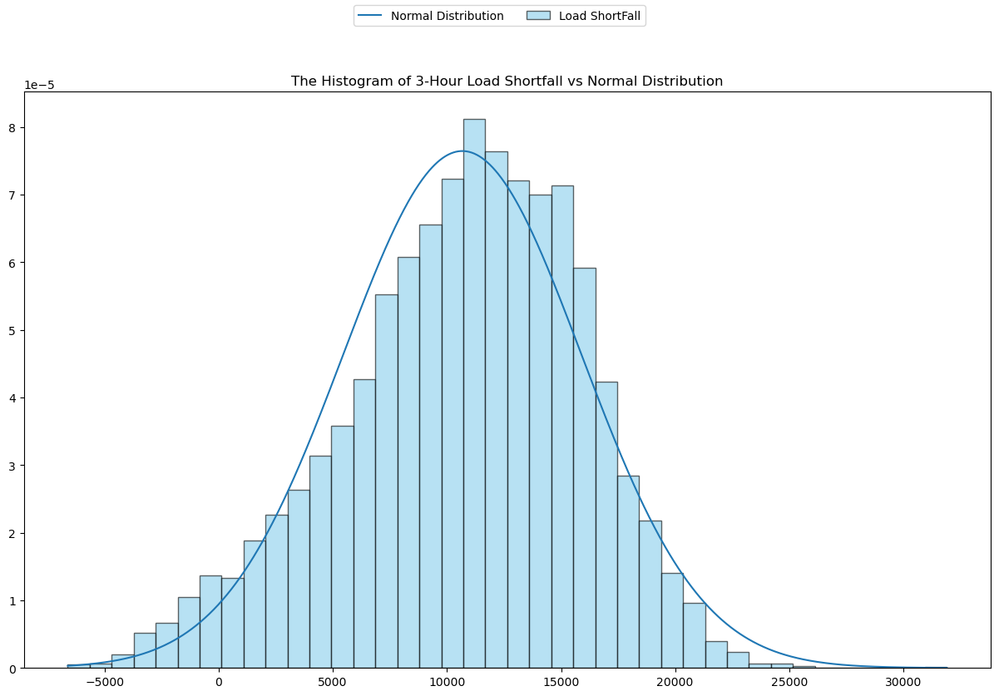

In [1454]:
# Create a new figure object
fig, ax = plt.subplots(figsize=(15,9))

# Calculate important metrics from dataframe
mean_val =  df_time_y['load_shortfall_3h'].mean()
std_dev = df_time_y['load_shortfall_3h'].std()
min_val, max_val = df_clean['load_shortfall_3h'].min(), df_clean['load_shortfall_3h'].max()

# Plot the theoretical normal distribution of target variable
x = np.linspace(min_val, max_val, 1000)
ax.plot(x, norm.pdf(x, mean_val, std_dev), label = "Normal Distribution")

# Plot the normalized histogram of target variable
ax.hist(df_clean['load_shortfall_3h'].values,
        alpha=0.6,
        label='Load ShortFall',
        bins=40,
        density=True,
        color='skyblue', 
        edgecolor='black'
       )

# Set title of figure
ax.set_title("The Histogram of 3-Hour Load Shortfall vs Normal Distribution")

# Create lines and labels for use in legend
lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]

# Insert figure legend and show the final figure
fig.legend(lines, labels, loc='upper center', ncol=2)
plt.show()

We see that our target variable is slightly skewed to the left from an ideal normal distribution. This can also be shown when we investigate the skew and kurtosis of our data explicitly, as done below.

In [1455]:
print(f"The Skew is {df_time_y.load_shortfall_3h.skew()}")
print(f"The Kurtosis is {df_time_y.load_shortfall_3h.kurtosis()}")

The Skew is -0.384847070902431
The Kurtosis is -0.11899877049908492


Upon analyzing our target variable, `load_shortfall_3h`, we observe a negative skewness, suggesting a slightly more pronounced tail on the left side of the distribution. This indicates that there are more values clustered to the right of the mean, indicating a leftward skew. The relatively small skew value signifies a fairly symmetric distribution of our target variable. Furthermore, the low kurtosis value suggests a lack of outliers, indicating a relatively tight distribution. These statistical insights provide valuable context, guiding our understanding of the variable's distribution and aiding in the formulation of our modeling strategies.

Next, let's look at some descriptive statistics for the rest of our variables:

In [1456]:
df_time_y.describe()

,hourofday,year,month,day,season,load_shortfall_3h
count,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000
mean,10.498459,2016.000571,6.524820,15.740157,2.503595,10673.857612
std,6.874031,0.816054,3.447976,8.798664,1.114565,5218.046404
min,0.000000,2015.000000,1.000000,1.000000,1.000000,-6618.000000
25%,4.500000,2015.000000,4.000000,8.000000,2.000000,7390.333333
50%,9.000000,2016.000000,7.000000,16.000000,3.000000,11114.666667
75%,15.000000,2017.000000,10.000000,23.000000,3.000000,14498.166667
max,21.000000,2017.000000,12.000000,31.000000,4.000000,31904.000000


In an effort to enhance the interpretability of our dataset, we acknowledge the challenges posed by the current tabular representation. To address this, we will categorize our variables based on their skewness. Variables demonstrating significant departure from symmetry will be labeled as heavily skewed, those with moderate skewness will be categorized as moderately skewed, and those exhibiting relative symmetry will be identified as relatively symmetrical. This classification will not only streamline our understanding of the dataset but also pave the way for a more intuitive and insightful analysis.

In [1457]:
# Create dataframe containing skewness of all potential predictor variables:
skew_df = df_time_y.drop('load_shortfall_3h', axis=1).skew().to_frame()

# Display variables with high skewness
Highly_Pos_Skew = skew_df[(skew_df[0] >= 1)]
Highly_Neg_Skew = skew_df[(skew_df[0] <= -1)]
print("High positive skew:", Highly_Pos_Skew, "\n \n")
print("High negative skew:", Highly_Neg_Skew, "\n \n")

# Display variables with moderate skewness:
Mod_Pos_Skew = skew_df[(skew_df[0] > 0.5) & (skew_df[0] < 1) ]
Mod_Neg_Skew = skew_df[(skew_df[0] < -0.5) & (skew_df[0] > -1)]
print("Moderate positive skew:", Mod_Pos_Skew, "\n \n")
print("Moderate negative skew:", Mod_Neg_Skew, "\n \n")

# Display relatively symmetrical values:
Sym_skew = skew_df[(skew_df[0] <= 0.5) & (skew_df[0] >= -0.5) ]
print("Relatively Symmetrical:", Sym_skew, "\n \n")

High positive skew: Empty DataFrame
Columns: [0]
Index: [] 
 

High negative skew: Empty DataFrame
Columns: [0]
Index: [] 
 

Moderate positive skew: Empty DataFrame
Columns: [0]
Index: [] 
 

Moderate negative skew: Empty DataFrame
Columns: [0]
Index: [] 
 

Relatively Symmetrical:                   0
hourofday  0.000719
year      -0.001048
month     -0.009544
day        0.005984
season    -0.003834 
 



Upon a careful analysis of the variables in this section, it is evident that all the data exhibits a relatively symmetrical distribution. This symmetry implies a balanced distribution of values, contributing to a stable and predictable pattern within these features. The absence of heavily skewed or excessively skewed variables in this context underscores the dataset's balanced nature, allowing for a more straightforward interpretation and modeling process. This observation provides valuable insights, affirming the stability and uniformity of the data in this specific section.

Let's repeat the same process for calculating the Kurtosis:

In [1458]:
# Create dataframe containing Kurtosis of all potential predictor variables:
kurt_df = df_time_y.drop('load_shortfall_3h', axis=1).kurtosis().to_frame()

# Display variables with high Kurtosis:
high_kurt= kurt_df[(kurt_df[0] >= 3)]
print("High kurtosis (Large amount of outliers):", high_kurt, "\n \n")

# Display variables with low Kurtosis:
low_kurt= kurt_df[(kurt_df[0] < 3)]
print("Low kurtosis (Small amount of outliers):", low_kurt, "\n \n")

High kurtosis (Large amount of outliers): Empty DataFrame
Columns: [0]
Index: [] 
 

Low kurtosis (Small amount of outliers):                   0
hourofday -1.237868
year      -1.498369
month     -1.207760
day       -1.193873
season    -1.351966 
 



Similarly, our analysis indicates a low kurtosis across the dataset, signifying a limited presence of outliers within the variables. The low kurtosis values reinforce the observation of a relatively tight distribution, indicating that the majority of data points are clustered near the mean. This characteristic enhances the dataset's stability and consistency, reinforcing the reliability of our data and bolstering the foundation for our subsequent analytical and modeling efforts.

Taking our analysis a step further, we will employ visualization techniques to gain a deeper understanding of our variables. By generating histograms for each individual variable, we can unravel the inherent structure of our data. These visualizations will not only corroborate the metrics calculated earlier but also offer nuanced insights into the distributional patterns of each variable. This visual exploration is instrumental in unraveling the complexities of our dataset, paving the way for a more comprehensive and informed analysis.

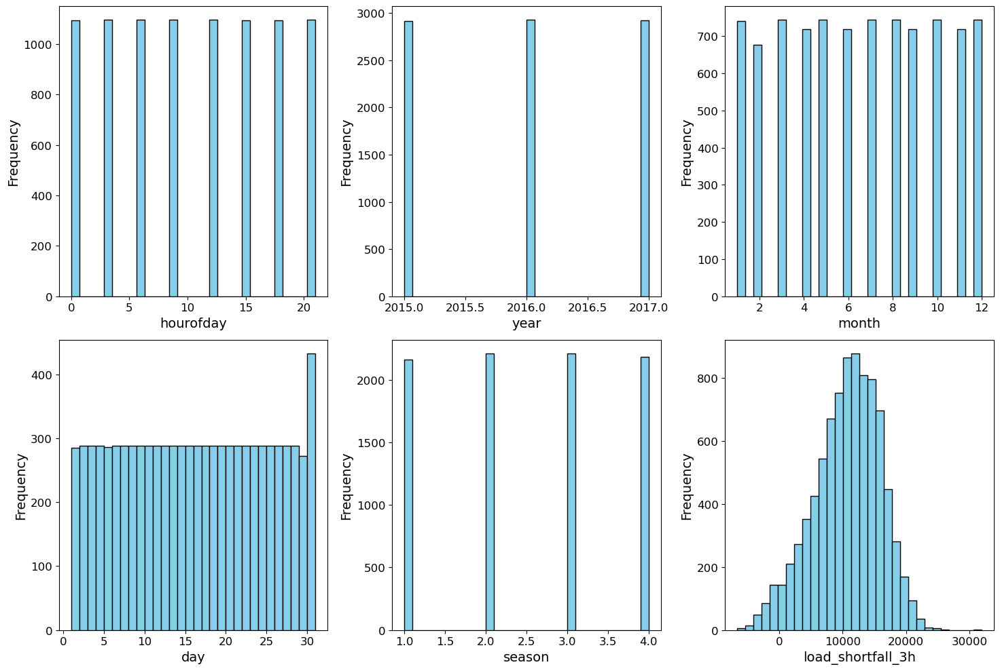

In [1459]:
# Define the number of rows and columns for subplots
number_of_rows = 2  # Number of rows in the subplot grid
number_of_columns = 3  # Number of columns in the subplot grid

# Plots histograms for all features with larger labels
fig, axes = plt.subplots(figsize=(15, 10), nrows=number_of_rows, ncols=number_of_columns)

# Iterate through the columns of the DataFrame and plot histograms
for i, column in enumerate(df_time_y.columns):
    row_index = i // number_of_columns
    col_index = i % number_of_columns
    ax = axes[row_index, col_index]
    
    ax.hist(df_time_y[column], bins=30, color='skyblue', edgecolor='black')
    ax.set_xlabel(column, fontsize=14)  # Set x-axis label with fontsize 14
    ax.set_ylabel('Frequency', fontsize=14)  # Set y-axis label with fontsize 14
    ax.tick_params(axis='both', which='both', labelsize=12)  # Set tick label fontsize

plt.tight_layout()  # Adjust the spacing between subplots
plt.show()

In this section, the data exhibits a generally uniform distribution, with subtle variations. February stands out with a noticeable decrease in frequency, indicating a unique pattern specific to this month. Additionally, there is a discernible increase in frequency on the last day of each month.

To gain a more direct and focused insight into the relationship between 'load_shortfall_3h' and 'month', we will visualize this interaction using a boxplot. This graphical representation will provide a clear and concise depiction of how energy load shortfalls vary across different months, enabling us to discern any prominent patterns, seasonal trends, or outliers in the data.

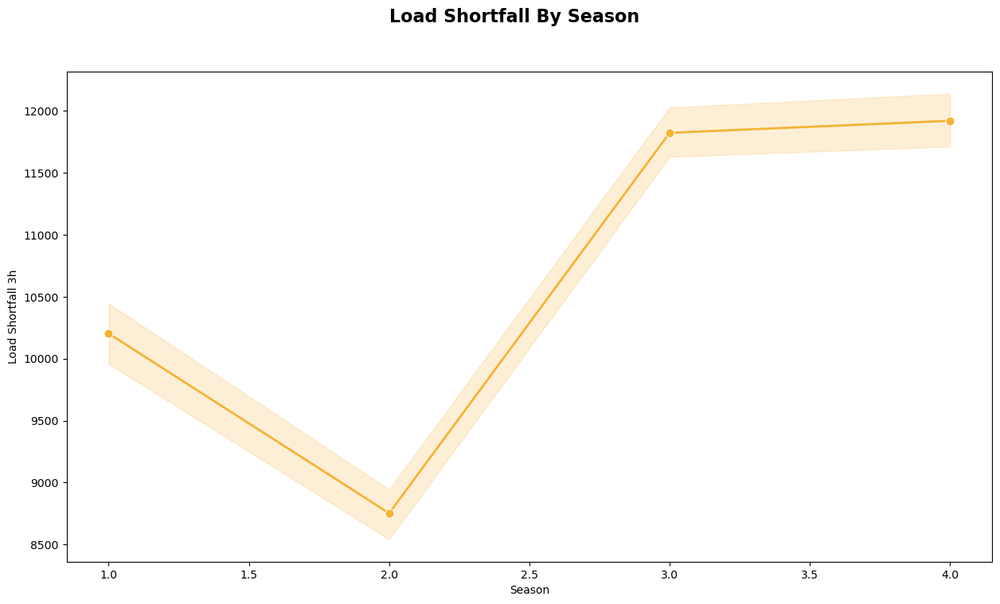

In [1460]:
# Initiate a new figure object
fig, ax = plt.subplots(figsize=(15, 8))

# Specify the color you want to use for the line (for example, 'green' or '#FF5733' - a shade of orange)
line_color = '#F5B334'

# Plot the line graph of load shortfall per year with the specified color
sns.lineplot(data=df_time_y, x="season", y="load_shortfall_3h", marker='o', markersize=8, linewidth=2, color=line_color)

# Set the main title for the graph
plt.suptitle('Load Shortfall By Season', fontsize=16, fontweight='bold')

# Set labels for x and y axes
ax.set_xlabel('Season')
ax.set_ylabel('Load Shortfall 3h')

# Show the line graph
plt.show()

Upon examining the line graph, distinct patterns emerge in the distribution of `load_shortfall_3h` across different seasons. 

**Winter (1):** The average load shortfall during winter months remains relatively stable, indicating a consistent level of energy demand exceeding supply.

**Spring (2):** In spring, there is a significant drop in the load shortfall, suggesting a more balanced energy supply and demand during this season.

**Summer (3):** The load shortfall experiences a sharp increase during summer, indicating a higher demand for energy supply, potentially due to increased cooling needs, longer daylight hours, or other factors.

**Autumn (4):** As autumn arrives, there is a slight rise in the load shortfall. Although there is an increase, it is not as dramatic as during summer, indicating a moderate uptick in energy demand as the weather cools down.

In summary, this analysis reveals fluctuations in energy demand throughout the year, with notable peaks in summer and relatively stable periods in winter and spring.

By observing the load shortfall patterns throughout the year, we can glean valuable insights into the energy demand fluctuations during different seasons. This understanding is crucial for Disaster Resilience Solutions, as accurate predictions empower them to proactively allocate resources, prioritize vulnerable regions, and deploy emergency response teams. 

Let's compare the `load_shortfall_3h` with the `month`.  By exploring this relationship, we aim to identify specific hours during which load shortfalls are more prevalent or exhibit distinct patterns.

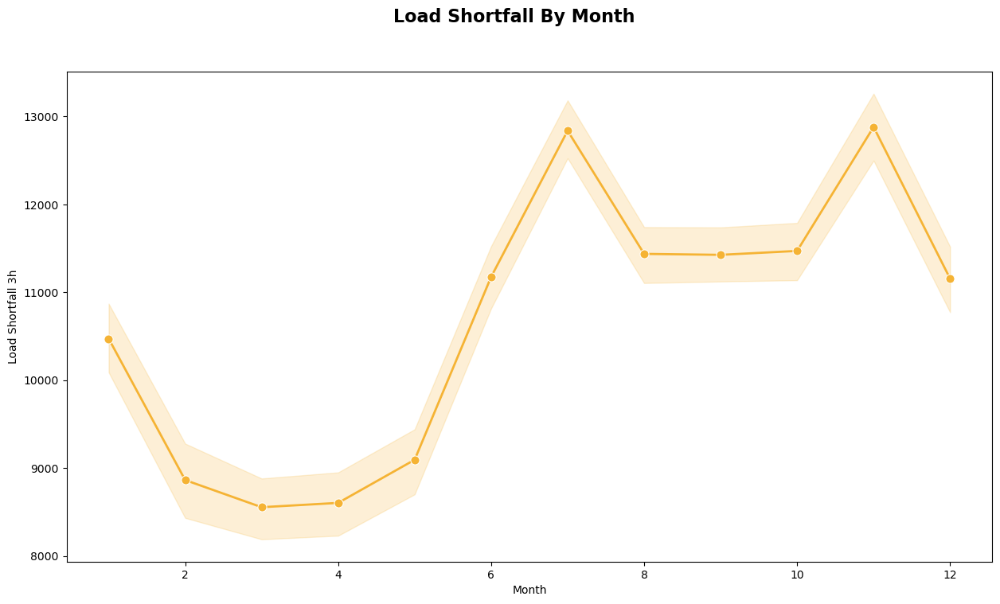

In [1461]:
# Initiate a new figure object
fig, ax = plt.subplots(figsize=(15, 8))

# Specify the color you want to use for the line (for example, 'blue' or '#FF5733' - a shade of orange)
line_color = '#F5B334'

# Plot the line graph of load shortfall per hour of the day with the specified color
sns.lineplot(data=df_time_y, x="month", y="load_shortfall_3h", marker='o', markersize=8, linewidth=2, color=line_color)

# Set the main title for the graph
plt.suptitle('Load Shortfall By Month', fontsize=16, fontweight='bold')

# Set labels for x and y axes
ax.set_xlabel('Month')
ax.set_ylabel('Load Shortfall 3h')

# Show the line graph
plt.show()

**February to March:**
During these months, there is a gradual decline in the load shortfall. This decline could be attributed to milder weather conditions, leading to reduced energy consumption. For Disaster Resilience Solutions, this trend signifies a period of relative stability. It offers an opportunity for preparedness efforts, such as conducting drills, updating emergency response protocols, and ensuring resources are in place for the upcoming challenges.

**March to May:**
A slight incline in load shortfall from March to May suggests a gradual increase in energy demand. This could be due to transitioning weather conditions, such as the arrival of spring and the accompanying rise in temperature. Disaster Resilience Solutions needs to closely monitor this upward trend, preparing for heightened energy requirements and potential strain on the supply system.

**June to July:**
A significant incline in load shortfall during these months points to a substantial surge in energy demand. This period likely corresponds with the onset of summer, leading to increased use of air conditioning and cooling systems. For Disaster Resilience Solutions, this sharp rise underscores the urgency of preparedness measures. Adequate resources, manpower, and strategic planning are essential to manage the escalating energy needs during this critical phase.

**August to October:**
Following the peak in July, there is a drop in load shortfall, stabilizing at an average level from August to October. This period of stability provides a breathing space for Disaster Resilience Solutions. It allows for the review of response strategies, assessment of resource utilization, and readiness for any unexpected spikes in demand. It also enables the agency to focus on long-term resilience-building initiatives.

**November:**
Another upward trend in load shortfall is observed in November, indicating a rise in energy demand as winter approaches. Disaster Resilience Solutions must be prepared for this resurgence, ensuring that the energy supply system can accommodate the growing needs. Timely interventions, such as increasing energy reserves and coordinating with utility providers, become vital during this phase.

**December to February:**
The year concludes with a return to average load shortfall. This relatively stable period offers an opportunity for Disaster Resilience Solutions to conduct a comprehensive year-end review. Lessons learned, challenges faced, and successes achieved can inform future disaster preparedness strategies. It also allows for strategic planning for the upcoming year, incorporating insights from the entire year's data.

For Disaster Resilience Solutions, this detailed analysis of the load shortfall patterns equips them with actionable insights. By aligning their preparedness efforts with these seasonal fluctuations, they can optimize resource allocation, enhance response strategies, and ensure the uninterrupted supply of energy during extreme weather events. This proactive approach ultimately strengthens the agency's disaster resilience planning, minimizing disruptions and safeguarding communities during natural disasters.

Extending our analysis to examine the relationship between `load_shortfall_3h` and `year` provides a broader perspective on the dataset. By conducting similar analyses per year, we aim to uncover potential trends, fluctuations, or patterns in energy load shortfalls over different years. 

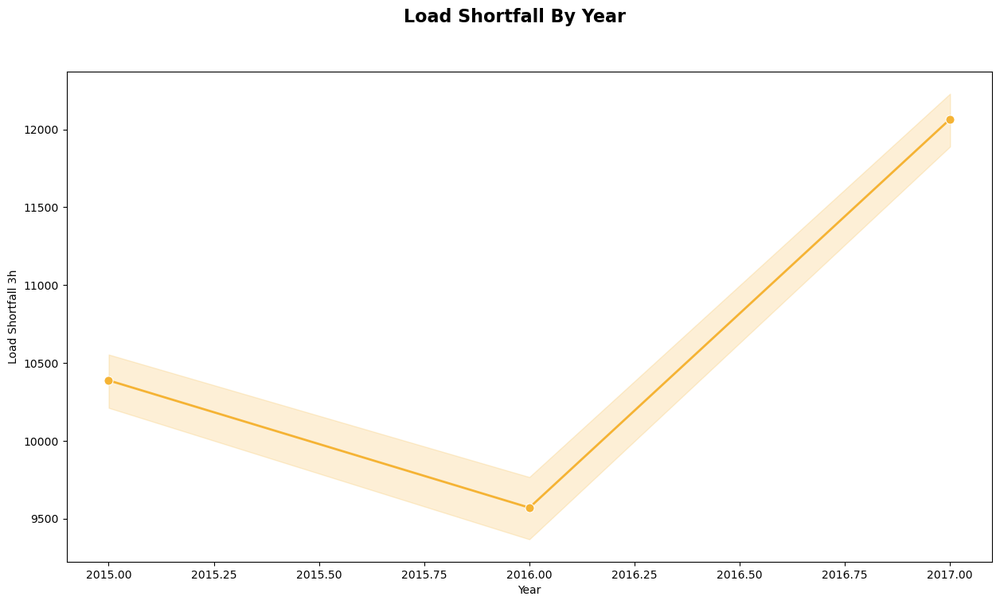

In [1462]:
# Initiate a new figure object
fig, ax = plt.subplots(figsize=(15, 8))

# Specify the color you want to use for the line (for example, 'purple' or '#FF5733' - a shade of orange)
line_color = '#F5B334'

# Plot the line graph of load shortfall per year with the specified color
sns.lineplot(data=df_time_y, x="year", y="load_shortfall_3h", marker='o', markersize=8, linewidth=2, color=line_color)

# Set the main title for the graph
plt.suptitle('Load Shortfall By Year', fontsize=16, fontweight='bold')

# Set labels for x and y axes
ax.set_xlabel('Year')
ax.set_ylabel('Load Shortfall 3h')

# Show the line graph
plt.show()

In 2015, the load shortfall starts at an average level and gradually decreases. However, a significant spike is observed in 2017, making it the year with the highest load shortfall among the three years analyzed. This substantial increase from 2016 to 2017 indicates a noteworthy surge in energy demand or a decrease in energy supply resilience. Understanding these fluctuations is crucial for Disaster Resilience Solutions' planning, as it highlights a period of heightened vulnerability and emphasizes the need for enhanced preparedness strategies to effectively manage energy shortages during adverse weather conditions.

Let's compare the `load_shortfall_3h` with the `houroftheday`.  By exploring this relationship, we aim to identify specific hours during which load shortfalls are more prevalent or exhibit distinct patterns.

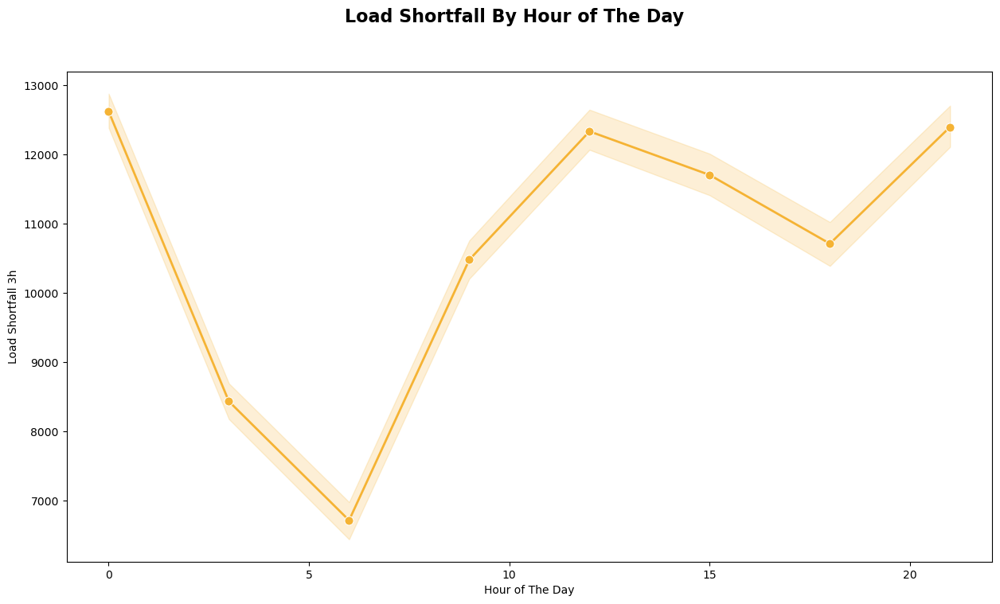

In [1463]:
# Initiate a new figure object
fig, ax = plt.subplots(figsize=(15, 8))

# Specify the color you want to use for the line (for example, 'blue' or '#FF5733' - a shade of orange)
line_color = '#F5B334'

# Plot the line graph of load shortfall per hour of the day with the specified color
sns.lineplot(data=df_time_y, x="hourofday", y="load_shortfall_3h", marker='o', markersize=8, linewidth=2, color=line_color)

# Set the main title for the graph
plt.suptitle('Load Shortfall By Hour of The Day', fontsize=16, fontweight='bold')

# Set labels for x and y axes
ax.set_xlabel('Hour of The Day')
ax.set_ylabel('Load Shortfall 3h')

# Show the line graph
plt.show()

The load shortfall data reveals crucial insights into the energy demand patterns throughout the day. At midnight, when energy usage typically drops as most people are asleep, the load shortfall starts at a high level. As the day progresses, there's a substantial decrease in load shortfall, indicating a relatively stable energy supply during the early morning hours until 6 am.

However, a significant surge in energy demand occurs from 6 am to 12 pm, likely due to the start of the workday and increased industrial activities. This sharp increase suggests a strain on the energy grid during these morning hours. Subsequently, there's a slight drop in load shortfall around 7 pm, possibly due to reduced commercial activities or the transition to evening hours.

Interestingly, energy consumption spikes again from 7 pm to midnight, highlighting another period of heightened demand, likely attributed to domestic usage during peak evening hours. These detailed fluctuations in load shortfall underscore specific time frames when the energy supply system is under increased pressure. For Disaster Resilience Solutions, this detailed breakdown serves as a valuable guide to strategically allocate resources and reinforce the energy infrastructure, ensuring uninterrupted supply, especially during these critical periods of high demand.

Finally, lets consider the impact that the day of the week has on the production of renewable energy:

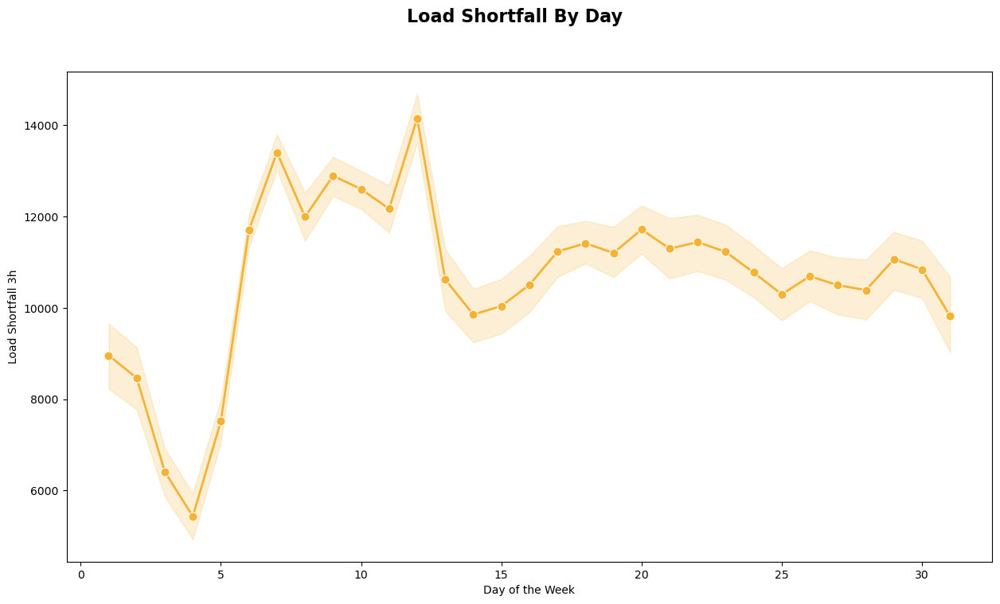

In [1464]:
# Initialize a new figure object
fig, ax = plt.subplots(figsize=(15, 8))

# Specify the color you want to use for the line (for example, 'green' or '#FF5733' - a shade of orange)
line_color = '#F5B334'

# Plot the line graph of load shortfall per day of the week with the specified color
sns.lineplot(data=df_time_y, x="day", y="load_shortfall_3h", marker='o', markersize=8, linewidth=2, color=line_color)

# Set the main title for the graph
plt.suptitle('Load Shortfall By Day', fontsize=16, fontweight='bold')

# Set labels for x and y axes
ax.set_xlabel('Day of the Week')
ax.set_ylabel('Load Shortfall 3h')

# Show the line graph
plt.show()

The load shortfall data across the month provides a detailed picture of energy demand patterns. At the beginning of the month, the load shortfall starts at an average level, indicating a relatively stable energy supply. As the days progress, there is a consistent decrease in load shortfall until the 4th, suggesting a balanced energy demand and supply.

However, a sharp increase in load shortfall occurs from the 4th to the 7th, indicating a sudden surge in energy demand, possibly due to specific events or increased industrial activities. Following this peak, there are minor fluctuations in load shortfall from the 7th to the 11th, with the 11th being the peak day of the month in terms of energy demand challenges.

The load shortfall then decreases again, returning to an average level by the 13th. From this point onward, there are slight fluctuations in load shortfall, indicating relatively stable energy demand for the remainder of the month.

This detailed analysis allows Disaster Resilience Solutions to identify critical periods of heightened energy demand, particularly around the 4th to 7th and the 11th of the month. By understanding these fluctuations, the agency can proactively prepare for increased demand, ensuring a robust energy supply system, even during challenging periods, and enhancing overall disaster preparedness and resilience planning. 

##### 5.1.2. df_Barcelona:

Subsequently, we will conduct a comprehensive examination of all the data related to Barcelona. This detailed scrutiny will encompass various features specific to this city, providing a nuanced understanding of the dataset's Barcelona-centric attributes. By immersing ourselves in this focused exploration, we aim to uncover city-specific patterns and trends, thus enriching our overall insights into the dataset.

In [1465]:
df_Barcelona = df_clean[['Barcelona_weather_id' , 'Barcelona_wind_speed', 'Barcelona_wind_deg' , 'Barcelona_temp', 'Barcelona_temp_min', 
           'Barcelona_temp_max' , 'Barcelona_rain_1h', 'Barcelona_rain_3h' , 'Barcelona_pressure', 'load_shortfall_3h']]

 We will commence our exploration by examining the initial entries of the `df_Barcelona` DataFrame. This pivotal step allows us to glean essential insights from the first two rows of the dataset, laying the foundation for our comprehensive analysis and informed decision-making in the modeling process.

In [1466]:
df_Barcelona.head(2)

,Barcelona_weather_id,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_temp,Barcelona_temp_min,Barcelona_temp_max,Barcelona_rain_1h,Barcelona_rain_3h,Barcelona_pressure,load_shortfall_3h
0,800.0,6.333333,42.666667,281.013000,281.013000,281.013000,0.0,0.0,1036.333333,6715.666667
1,800.0,4.000000,139.000000,280.561667,280.561667,280.561667,0.0,0.0,1037.333333,4171.666667


Next, let's look at some descriptive statistics for the rest of our variables:

In [1467]:
df_Barcelona.describe()

,Barcelona_weather_id,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_temp,Barcelona_temp_min,Barcelona_temp_max,Barcelona_rain_1h,Barcelona_rain_3h,Barcelona_pressure,load_shortfall_3h
count,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8.763000e+03,8763.000000
mean,765.979687,2.870497,190.544848,289.855459,288.447422,291.157644,0.128906,0.000439,1.377965e+03,10673.857612
std,88.142235,1.792197,89.077337,6.528111,6.102593,7.273538,0.634730,0.003994,1.407314e+04,5218.046404
min,200.666667,0.000000,0.000000,270.816667,269.483333,272.150000,0.000000,0.000000,6.706667e+02,-6618.000000
25%,800.000000,1.666667,118.166667,284.973443,284.150000,285.483333,0.000000,0.000000,1.014000e+03,7390.333333
50%,800.333333,2.666667,200.000000,289.416667,288.150000,290.150000,0.000000,0.000000,1.018000e+03,11114.666667
75%,801.000000,4.000000,260.000000,294.909000,292.966667,296.855000,0.000000,0.000000,1.022000e+03,14498.166667
max,804.000000,12.666667,360.000000,307.316667,304.816667,314.076667,12.000000,0.093000,1.001411e+06,31904.000000


To quantify the skewness of the data in the Valencia dataset, we will utilize the `skew()` function. This analytical tool will provide precise numerical values, allowing us to quantitatively assess the distributional characteristics of the variables in the dataset. By leveraging this method, we aim to gain a deeper understanding of the skewness patterns, essential for our meticulous analysis and modeling efforts in the Valencia context.

In [1468]:
# Create dataframe containing skewness of all potential predictor variables:
skew_df = df_Barcelona.skew().to_frame()

# Display variables with high skewness
High_right_Skew = skew_df[(skew_df[0] >= 1)]
High_left_Skew = skew_df[(skew_df[0] <= -1)]
print("Highly right skew:", High_right_Skew, "\n \n")
print("High left skew:", High_left_Skew, "\n \n")

# Display variables with moderate skewness:
Mod_Right_Skew = skew_df[(skew_df[0] > 0.5) & (skew_df[0] < 1) ]
Mod_Left_Skew = skew_df[(skew_df[0] < -0.5) & (skew_df[0] > -1)]
print("Moderate Right skew:", Mod_Right_Skew, "\n \n")
print("Moderate Left skew:", Mod_Left_Skew, "\n \n")

# Display relatively symmetrical values:
Sym_skew = skew_df[(skew_df[0] <= 0.5) & (skew_df[0] >= -0.5) ]
print("Relatively Symmetrical:", Sym_skew, "\n \n")

Highly right skew:                               0
Barcelona_wind_speed   1.057331
Barcelona_rain_1h      8.726988
Barcelona_rain_3h     12.696605
Barcelona_pressure    57.979664 
 

High left skew:                              0
Barcelona_weather_id -2.584011 
 

Moderate Right skew: Empty DataFrame
Columns: [0]
Index: [] 
 

Moderate Left skew: Empty DataFrame
Columns: [0]
Index: [] 
 

Relatively Symmetrical:                            0
Barcelona_wind_deg -0.180001
Barcelona_temp      0.128095
Barcelona_temp_min -0.018057
Barcelona_temp_max  0.276925
load_shortfall_3h  -0.384847 
 



Taking our analysis a step further, we will employ visualization techniques to gain a deeper understanding of our variables. By generating histograms for each individual variable, we can unravel the inherent structure of our data. This visual exploration is instrumental in unraveling the complexities of our dataset, paving the way for a more comprehensive and informed analysis.

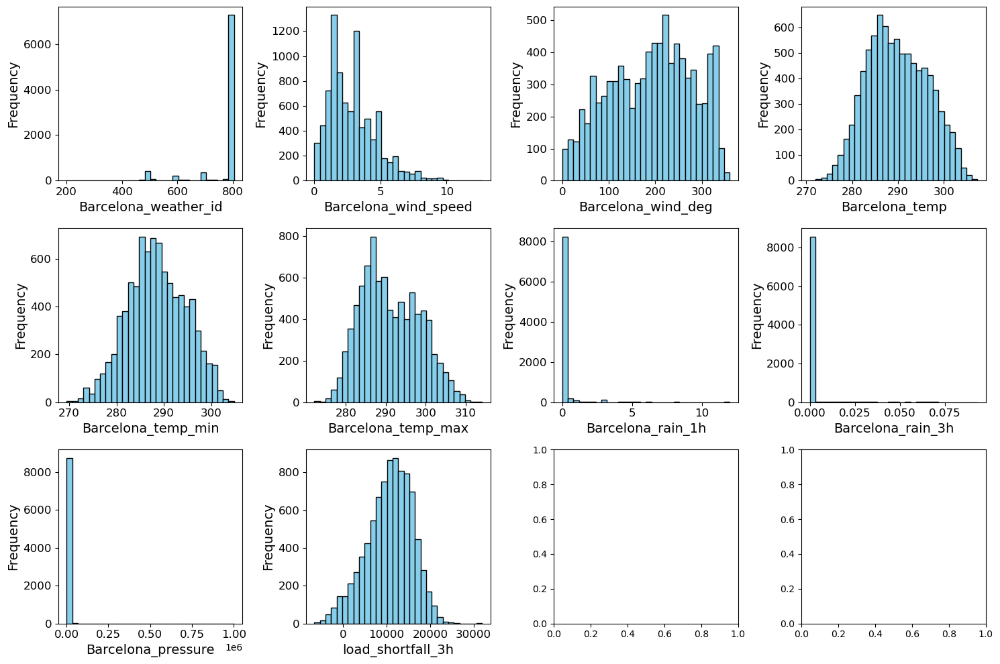

In [1469]:
# Define the number of rows and columns for subplots
number_of_rows = 3  # Number of rows in the subplot grid
number_of_columns = 4  # Number of columns in the subplot grid

# Plots histograms for all features with larger labels
fig, axes = plt.subplots(figsize=(15, 10), nrows=number_of_rows, ncols=number_of_columns)

# Iterate through the columns of the DataFrame and plot histograms
for i, column in enumerate(df_Barcelona.columns):
    row_index = i // number_of_columns
    col_index = i % number_of_columns
    ax = axes[row_index, col_index]
    
    ax.hist(df_Barcelona[column], bins=30, color='skyblue', edgecolor='black')
    ax.set_xlabel(column, fontsize=14)  # Set x-axis label with fontsize 14
    ax.set_ylabel('Frequency', fontsize=14)  # Set y-axis label with fontsize 14
    ax.tick_params(axis='both', which='both', labelsize=12)  # Set tick label fontsize

plt.tight_layout()  # Adjust the spacing between subplots
plt.show()

In our examination of Barcelona's weather data, specific skewness patterns have emerged within various weather variables.

**Highly Right Skew:**
Four variables, including wind speed, rainfall for 1 hour, rainfall for 3 hours, and atmospheric pressure, display a significant rightward or positive skew. This indicates a prevalence of higher values in these categories. Barcelona experiences occasional strong winds, heavy short-term and prolonged rainfall, as well as higher atmospheric pressure values, contributing to these skewed patterns.

**High Left Skew:**
`Barcelona_weather_id` demonstrates a significant leftward or negative skew. This suggests frequent occurrences of specific weather conditions, represented by lower weather IDs. Barcelona tends to experience certain consistent weather states, contributing to this skewed pattern.

**Relatively Symmetrical:**
Several variables, including wind degree and temperature-related metrics, exhibit a more symmetrical distribution around their means. This means that these aspects of weather, such as wind direction and temperature levels, are fairly evenly spread around their average values, indicating a balanced climate in these aspects in Barcelona.

These skewness patterns offer qualitative insights into Barcelona's weather characteristics, vital for our subsequent analyses and modeling efforts, guiding our predictions and interpretations related to Barcelona's weather dynamics.

Finally, we will use the `kurtosis()` function to assess the shape and tail behavior of a probability distribution.

In [1470]:
# Create dataframe containing Kurtosis of all potential predictor variables:
kurt_df = df_Barcelona.kurtosis().to_frame()

# Display variables with high Kurtosis:
high_kurt= kurt_df[(kurt_df[0] >= 3)]
print("High kurtosis (Large amount of outliers):", high_kurt, "\n \n")

# Display variables with low Kurtosis:
low_kurt= kurt_df[(kurt_df[0] < 3)]
print("Low kurtosis (Small amount of outliers):", low_kurt, "\n \n")

High kurtosis (Large amount of outliers):                                 0
Barcelona_weather_id     5.701882
Barcelona_rain_1h      101.578931
Barcelona_rain_3h      187.800460
Barcelona_pressure    3687.564230 
 

Low kurtosis (Small amount of outliers):                              0
Barcelona_wind_speed  1.493635
Barcelona_wind_deg   -0.959160
Barcelona_temp       -0.696555
Barcelona_temp_min   -0.474890
Barcelona_temp_max   -0.728757
load_shortfall_3h    -0.118999 
 



The presented findings reveal the kurtosis values for specific variables in the dataset, indicating the presence of outliers.

**High Kurtosis (Large Amount of Outliers):**
Variables such as `Barcelona_weather_id`, `Barcelona_rain_1h`, `Barcelona_rain_3h`, and `Barcelona_pressure` exhibit high kurtosis, indicating a substantial number of outliers in these data sets. `Barcelona_rain_1h` and `Barcelona_rain_3h` indicate instances of heavy rainfall, with the former potentially signifying intense short-term rainfall events. `Barcelona_pressure` displays extreme outlier values, suggesting irregular atmospheric pressure readings. 

**Low Kurtosis (Small Amount of Outliers):**
Variables like `Barcelona_wind_speed`, `Barcelona_wind_deg`, `Barcelona_temp`, `Barcelona_temp_min`, and `Barcelona_temp_max` demonstrate low kurtosis, indicating a distribution where most values cluster close to the mean. These variables have few outliers, suggesting a stable and predictable range of values. For example, `Barcelona_temp` reflects a consistent temperature range in Barcelona. 

##### 5.1.3. df_Bilbao:

In the refinement of our dataset, a specific subset, denoted as `df_Bilbao`, has been meticulously curated. By isolating these key features, `df_Bilbao` encapsulates the weather-related parameters critical for our analysis and modeling endeavors. This focused approach enables a detailed examination of Bilbao's weather patterns, enriching our understanding of the city-specific climatic dynamics.

In [1471]:
df_Bilbao = df_clean[['Bilbao_temp' , 'Bilbao_temp_min' , 'Bilbao_temp_max' , 'Bilbao_rain_1h', 'Bilbao_snow_3h', 'Bilbao_pressure','Bilbao_clouds_all']]

 We will commence our exploration by examining the initial entries of the `df_Bilbao` DataFrame. This pivotal step allows us to glean essential insights from the first two rows of the dataset, laying the foundation for our comprehensive analysis and informed decision-making in the modeling process.

In [1472]:
df_Bilbao.head(2)

,Bilbao_temp,Bilbao_temp_min,Bilbao_temp_max,Bilbao_rain_1h,Bilbao_snow_3h,Bilbao_pressure,Bilbao_clouds_all
0,269.338615,269.338615,269.338615,0.0,0.0,1035.000000,0.0
1,270.376000,270.376000,270.376000,0.0,0.0,1035.666667,0.0


Next, let's look at some descriptive statistics for the rest of our variables:

In [1473]:
df_Bilbao.describe()

,Bilbao_temp,Bilbao_temp_min,Bilbao_temp_max,Bilbao_rain_1h,Bilbao_snow_3h,Bilbao_pressure,Bilbao_clouds_all
count,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000
mean,286.422929,285.017973,287.966027,0.135753,0.031912,1017.739549,43.469132
std,6.818682,6.705672,7.105590,0.374901,0.557264,10.046124,32.551044
min,267.483333,264.483333,269.063000,0.000000,0.000000,971.333333,0.000000
25%,281.374167,280.085167,282.836776,0.000000,0.000000,1013.000000,10.000000
50%,286.158333,284.816667,287.630000,0.000000,0.000000,1019.000000,45.000000
75%,291.034167,289.816667,292.483333,0.100000,0.000000,1024.000000,75.000000
max,310.710000,309.816667,317.966667,3.000000,21.300000,1042.000000,100.000000


To quantify the skewness of the data in the Valencia dataset, we will utilize the `skew()` function. This analytical tool will provide precise numerical values, allowing us to quantitatively assess the distributional characteristics of the variables in the dataset. By leveraging this method, we aim to gain a deeper understanding of the skewness patterns, essential for our meticulous analysis and modeling efforts in the Valencia context.

In [1474]:
# Create dataframe containing skewness of all potential predictor variables:
skew_df = df_Bilbao.skew().to_frame()

# Display variables with high skewness
High_right_Skew = skew_df[(skew_df[0] >= 1)]
High_left_Skew = skew_df[(skew_df[0] <= -1)]
print("Highly right skew:", High_right_Skew, "\n \n")
print("High left skew:", High_left_Skew, "\n \n")

# Display variables with moderate skewness:
Mod_Right_Skew = skew_df[(skew_df[0] > 0.5) & (skew_df[0] < 1) ]
Mod_Left_Skew = skew_df[(skew_df[0] < -0.5) & (skew_df[0] > -1)]
print("Moderate Right skew:", Mod_Right_Skew, "\n \n")
print("Moderate Left skew:", Mod_Left_Skew, "\n \n")

# Display relatively symmetrical values:
Sym_skew = skew_df[(skew_df[0] <= 0.5) & (skew_df[0] >= -0.5) ]
print("Relatively Symmetrical:", Sym_skew, "\n \n")

Highly right skew:                         0
Bilbao_rain_1h   5.222802
Bilbao_snow_3h  26.177568 
 

High left skew: Empty DataFrame
Columns: [0]
Index: [] 
 

Moderate Right skew: Empty DataFrame
Columns: [0]
Index: [] 
 

Moderate Left skew:                         0
Bilbao_pressure -0.999642 
 

Relatively Symmetrical:                           0
Bilbao_temp        0.293686
Bilbao_temp_min    0.194912
Bilbao_temp_max    0.393932
Bilbao_clouds_all -0.053085 
 



Taking our analysis a step further, we will employ visualization techniques to gain a deeper understanding of our variables. By generating histograms for each individual variable, we can unravel the inherent structure of our data. This visual exploration is instrumental in unraveling the complexities of our dataset, paving the way for a more comprehensive and informed analysis.

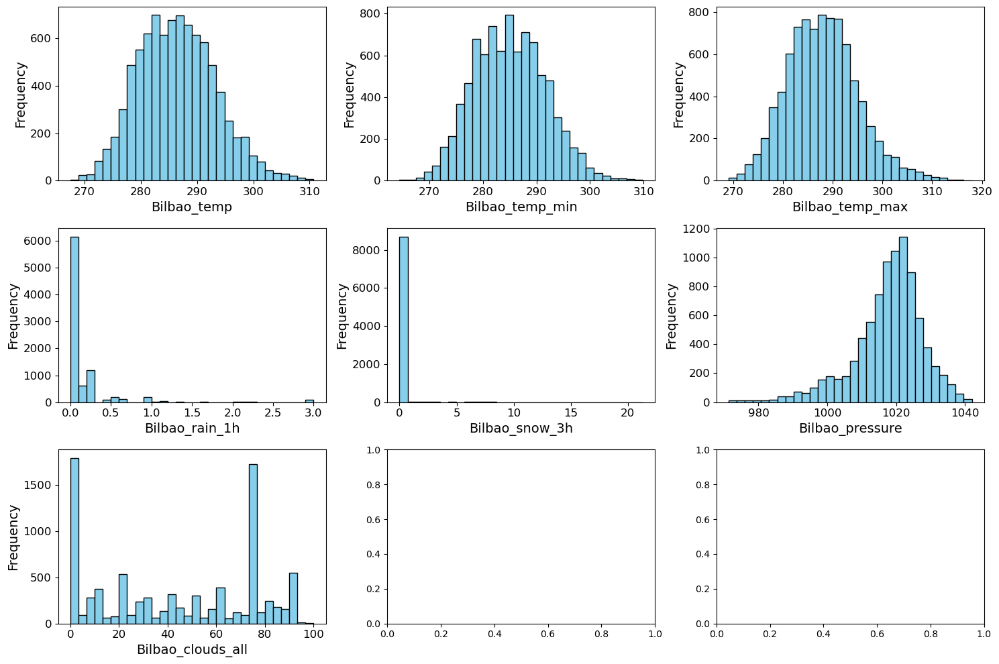

In [1475]:
# Define the number of rows and columns for subplots
number_of_rows = 3  # Number of rows in the subplot grid
number_of_columns = 3  # Number of columns in the subplot grid

# Plots histograms for all features with larger labels
fig, axes = plt.subplots(figsize=(15, 10), nrows=number_of_rows, ncols=number_of_columns)

# Iterate through the columns of the DataFrame and plot histograms
for i, column in enumerate(df_Bilbao.columns):
    row_index = i // number_of_columns
    col_index = i % number_of_columns
    ax = axes[row_index, col_index]
    
    ax.hist(df_Bilbao[column], bins=30, color='skyblue', edgecolor='black')
    ax.set_xlabel(column, fontsize=14)  # Set x-axis label with fontsize 14
    ax.set_ylabel('Frequency', fontsize=14)  # Set y-axis label with fontsize 14
    ax.tick_params(axis='both', which='both', labelsize=12)  # Set tick label fontsize

plt.tight_layout()  # Adjust the spacing between subplots
plt.show()

In our analysis of Bilbao's weather data, we've identified distinct skewness patterns within various weather variables.

**Highly Right Skew:**
Two variables, rain for 1 hour and snowfall for 3 hours, exhibit a significant rightward or positive skew. This suggests a prevalence of higher values in these categories. Bilbao experiences occasional heavy short-term rainfall and rare instances of significant snowfall, contributing to these skewed patterns.

**Relatively Symmetrical:**
Several variables, including temperature, temperature minimum and maximum, and cloud coverage, exhibit a more symmetrical distribution around their means. This means that these aspects of weather, such as temperature levels and cloud coverage, are fairly evenly spread around their average values, indicating a balanced climate in these aspects in Bilbao.

These skewness patterns provide qualitative insights into Bilbao's weather characteristics, essential for our subsequent analyses and modeling efforts, guiding our predictions and interpretations related to Bilbao's weather dynamics.

Finally, we will use the `kurtosis()` function to assess the shape and tail behavior of a probability distribution.

In [1476]:
# Create dataframe containing Kurtosis of all potential predictor variables:
kurt_df = df_Bilbao.kurtosis().to_frame()

# Display variables with high Kurtosis:
high_kurt= kurt_df[(kurt_df[0] >= 3)]
print("High kurtosis (Large amount of outliers):", high_kurt, "\n \n")

# Display variables with low Kurtosis:
low_kurt= kurt_df[(kurt_df[0] < 3)]
print("Low kurtosis (Small amount of outliers):", low_kurt, "\n \n")

High kurtosis (Large amount of outliers):                          0
Bilbao_rain_1h   32.904656
Bilbao_snow_3h  806.128471 
 

Low kurtosis (Small amount of outliers):                           0
Bilbao_temp       -0.086363
Bilbao_temp_min   -0.230342
Bilbao_temp_max    0.283366
Bilbao_pressure    1.825323
Bilbao_clouds_all -1.533417 
 



The presented findings reveal the kurtosis values for specific variables in the dataset, indicating the presence of outliers.

**High Kurtosis (Large Amount of Outliers):**
Variables like `Bilbao_rain_1h` and `Bilbao_snow_3h` display high kurtosis, indicating a significant number of outliers. These variables contain extreme values that deviate significantly from the typical range. For instance, `Bilbao_snow_3h` exhibits high kurtosis, suggesting infrequent but intense snowfall events in Bilbao. 

**Low Kurtosis (Small Amount of Outliers):**
Variables such as `Bilbao_temp`, `Bilbao_temp_min`, `Bilbao_temp_max`, `Bilbao_pressure`, and `Bilbao_clouds_all` demonstrate low kurtosis, indicating a distribution where most values cluster around the mean. These variables have fewer outliers, signifying a more stable and typical range of values. For example, `Bilbao_temp` shows low kurtosis, indicating that temperatures in Bilbao generally fall within a predictable range. 

##### 5.1.4. df_Madrid:

In the upcoming section dedicated to the analysis of Madrid city, a focused dataset, named `df_Madrid`, has been meticulously crafted, encompassing exclusively the variables pertinent to Madrid. 

In [1477]:
df_Madrid = df_clean[['Madrid_weather_id' , 'Madrid_wind_speed', 'Madrid_temp' , 'Madrid_temp_min' , 'Madrid_temp_max' , 'Madrid_rain_1h' , 
           'Madrid_pressure' , 'Madrid_clouds_all' , 'Madrid_humidity']]

 We will commence our exploration by examining the initial entries of the `df_Madrid` DataFrame. This pivotal step allows us to glean essential insights from the first two rows of the dataset, laying the foundation for our comprehensive analysis and informed decision-making in the modeling process.

In [1478]:
df_Madrid.head(2)

,Madrid_weather_id,Madrid_wind_speed,Madrid_temp,Madrid_temp_min,Madrid_temp_max,Madrid_rain_1h,Madrid_pressure,Madrid_clouds_all,Madrid_humidity
0,800.0,0.666667,265.938000,265.938000,265.938000,0.0,971.333333,0.0,64.000000
1,800.0,0.333333,266.386667,266.386667,266.386667,0.0,972.666667,0.0,64.666667


Next, let's look at some descriptive statistics for the rest of our variables:

In [1479]:
df_Madrid.describe()

,Madrid_weather_id,Madrid_wind_speed,Madrid_temp,Madrid_temp_min,Madrid_temp_max,Madrid_rain_1h,Madrid_pressure,Madrid_clouds_all,Madrid_humidity
count,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000
mean,773.527594,2.425729,288.419439,287.202203,289.540309,0.037818,1010.316920,19.473392,57.414717
std,77.313315,1.850371,9.346796,9.206237,9.752047,0.152639,22.198555,28.053660,24.335396
min,211.000000,0.000000,264.983333,264.983333,264.983333,0.000000,927.666667,0.000000,6.333333
25%,800.000000,1.000000,281.404281,280.299167,282.150000,0.000000,1012.333333,0.000000,36.333333
50%,800.000000,2.000000,287.053333,286.083333,288.116177,0.000000,1017.333333,0.000000,58.000000
75%,800.666667,3.333333,295.154667,293.884500,296.816667,0.000000,1022.000000,33.333333,78.666667
max,804.000000,13.000000,313.133333,310.383333,314.483333,3.000000,1038.000000,100.000000,100.000000


To quantify the skewness of the data in the Valencia dataset, we will utilize the `skew()` function. This analytical tool will provide precise numerical values, allowing us to quantitatively assess the distributional characteristics of the variables in the dataset. By leveraging this method, we aim to gain a deeper understanding of the skewness patterns, essential for our meticulous analysis and modeling efforts in the Valencia context.

In [1480]:
# Create dataframe containing skewness of all potential predictor variables:
skew_df = df_Madrid.skew().to_frame()

# Display variables with high skewness
High_right_Skew = skew_df[(skew_df[0] >= 1)]
High_left_Skew = skew_df[(skew_df[0] <= -1)]
print("Highly right skew:", High_right_Skew, "\n \n")
print("High left skew:", High_left_Skew, "\n \n")

# Display variables with moderate skewness:
Mod_Right_Skew = skew_df[(skew_df[0] > 0.5) & (skew_df[0] < 1) ]
Mod_Left_Skew = skew_df[(skew_df[0] < -0.5) & (skew_df[0] > -1)]
print("Moderate Right skew:", Mod_Right_Skew, "\n \n")
print("Moderate Left skew:", Mod_Left_Skew, "\n \n")

# Display relatively symmetrical values:
Sym_skew = skew_df[(skew_df[0] <= 0.5) & (skew_df[0] >= -0.5) ]
print("Relatively Symmetrical:", Sym_skew, "\n \n")

Highly right skew:                           0
Madrid_wind_speed  1.441144
Madrid_rain_1h     7.074308
Madrid_clouds_all  1.246745 
 

High left skew:                           0
Madrid_weather_id -3.107722
Madrid_pressure   -1.850768 
 

Moderate Right skew: Empty DataFrame
Columns: [0]
Index: [] 
 

Moderate Left skew: Empty DataFrame
Columns: [0]
Index: [] 
 

Relatively Symmetrical:                         0
Madrid_temp      0.304123
Madrid_temp_min  0.275083
Madrid_temp_max  0.298707
Madrid_humidity -0.057378 
 



Taking our analysis a step further, we will employ visualization techniques to gain a deeper understanding of our variables. By generating histograms for each individual variable, we can unravel the inherent structure of our data. This visual exploration is instrumental in unraveling the complexities of our dataset, paving the way for a more comprehensive and informed analysis.

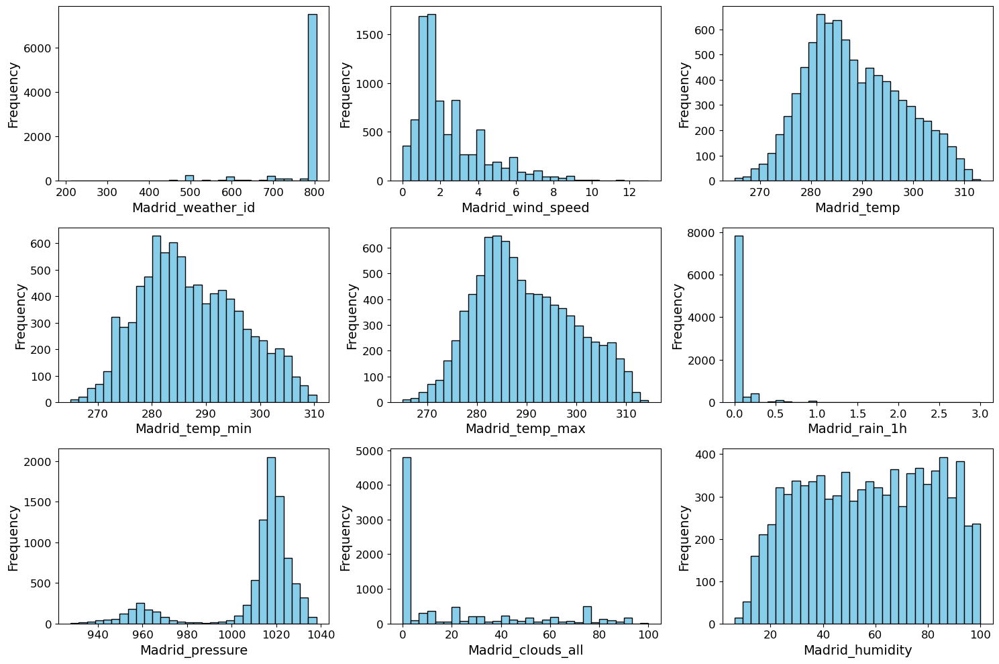

In [1481]:
# Define the number of rows and columns for subplots
number_of_rows = 3  # Number of rows in the subplot grid
number_of_columns = 3  # Number of columns in the subplot grid

# Plots histograms for all features with larger labels
fig, axes = plt.subplots(figsize=(15, 10), nrows=number_of_rows, ncols=number_of_columns)

# Iterate through the columns of the DataFrame and plot histograms
for i, column in enumerate(df_Madrid.columns):
    row_index = i // number_of_columns
    col_index = i % number_of_columns
    ax = axes[row_index, col_index]
    
    ax.hist(df_Madrid[column], bins=30, color='skyblue', edgecolor='black')
    ax.set_xlabel(column, fontsize=14)  # Set x-axis label with fontsize 14
    ax.set_ylabel('Frequency', fontsize=14)  # Set y-axis label with fontsize 14
    ax.tick_params(axis='both', which='both', labelsize=12)  # Set tick label fontsize

plt.tight_layout()  # Adjust the spacing between subplots
plt.show()

In the context of our analysis of Madrid's weather data, we've observed distinct skewness patterns, providing valuable insights into the distributional characteristics of various weather variables.

**Highly Right Skew:**
Certain variables, like wind speed, rainfall, and cloud coverage, exhibit a significant rightward or positive skew. This indicates a prevalence of higher values in these categories, suggesting occasional strong winds, heavy rainfall, and cloudier weather in Madrid.

**High Left Skew:**
Other variables, such as weather ID and atmospheric pressure, display a significant leftward or negative skew. This suggests frequent occurrences of specific weather conditions, represented by lower weather IDs, and lower atmospheric pressure values.

**Relatively Symmetrical:**
Certain variables, including temperature and humidity, showcase a symmetrical distribution around their means. This means that these aspects of weather, such as temperature levels and humidity, are fairly evenly spread around their average values.

These skewness patterns, even without specific numerical values, offer a qualitative understanding of how various weather factors are distributed in Madrid. This understanding is instrumental in our subsequent analyses and modeling efforts, guiding our predictions and interpretations related to Madrid's weather dynamics.

Finally, we will use the `kurtosis()` function to assess the shape and tail behavior of a probability distribution.

In [1482]:
# Create dataframe containing Kurtosis of all potential predictor variables:
kurt_df = df_Madrid.kurtosis().to_frame()

# Display variables with high Kurtosis:
high_kurt= kurt_df[(kurt_df[0] >= 3)]
print("High kurtosis (Large amount of outliers):", high_kurt, "\n \n")

# Display variables with low Kurtosis:
low_kurt= kurt_df[(kurt_df[0] < 3)]
print("Low kurtosis (Small amount of outliers):", low_kurt, "\n \n")

High kurtosis (Large amount of outliers):                            0
Madrid_weather_id   9.259047
Madrid_rain_1h     76.584491 
 

Low kurtosis (Small amount of outliers):                           0
Madrid_wind_speed  2.036462
Madrid_temp       -0.612299
Madrid_temp_min   -0.666646
Madrid_temp_max   -0.662861
Madrid_pressure    2.216199
Madrid_clouds_all  0.142079
Madrid_humidity   -1.167537 
 



The presented findings reveal the kurtosis values for specific variables in the dataset, indicating the presence of outliers.

**High Kurtosis (Large Amount of Outliers):**
Variables like `Madrid_weather_id` and `Madrid_rain_1h` exhibit high kurtosis, indicating a substantial number of outliers. These variables contain extreme values that deviate significantly from the typical range. For instance, `Madrid_rain_1h` has a high kurtosis, suggesting infrequent but intense rainfall events in Madrid. 

**Low Kurtosis (Small Amount of Outliers):**
Variables such as `Madrid_wind_speed`, `Madrid_temp`, `Madrid_temp_min`, `Madrid_temp_max`, `Madrid_pressure`, `Madrid_clouds_all`, and `Madrid_humidity` demonstrate low kurtosis, indicating a distribution where most values cluster around the mean. These variables have fewer outliers, signifying a more stable and typical range of values. For example, Madrid_wind_speed exhibits low kurtosis, indicating that wind speeds in Madrid generally fall within a predictable range. 

##### 5.1.5. df_Seville

In the next section dedicated to the analysis of Seville city, a focused dataset, named `df_Seville`, has been meticulously crafted, encompassing exclusively the variables pertinent to Seville. 

In [1483]:
df_Seville = df_clean[['Seville_weather_id' , 'Seville_wind_speed' , 'Seville_temp' , 'Seville_temp_min' , 'Seville_temp_max' , 'Seville_rain_1h' , 
           'Seville_rain_3h' , 'Seville_pressure' , 'Seville_clouds_all' , 'Seville_humidity']]

 We will commence our exploration by examining the initial entries of the `df_Seville` DataFrame. This pivotal step allows us to glean essential insights from the first two rows of the dataset, laying the foundation for our comprehensive analysis and informed decision-making in the modeling process.

In [1484]:
df_Seville.head(2)

,Seville_weather_id,Seville_wind_speed,Seville_temp,Seville_temp_min,Seville_temp_max,Seville_rain_1h,Seville_rain_3h,Seville_pressure,Seville_clouds_all,Seville_humidity
0,800.0,3.333333,274.254667,274.254667,274.254667,0.0,0.0,25,0.0,74.333333
1,800.0,3.333333,274.945000,274.945000,274.945000,0.0,0.0,25,0.0,78.333333


Next, let's look at some descriptive statistics for the rest of our variables:

In [1485]:
df_Seville.describe()

,Seville_weather_id,Seville_wind_speed,Seville_temp,Seville_temp_min,Seville_temp_max,Seville_rain_1h,Seville_rain_3h,Seville_pressure,Seville_clouds_all,Seville_humidity
count,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000
mean,774.658818,2.425045,293.978903,291.633356,297.479527,0.039439,0.000243,13.507246,13.714748,62.658793
std,71.940009,1.672895,7.920986,8.178220,8.875812,0.175857,0.003660,7.237267,24.272482,22.621226
min,200.000000,0.000000,272.063000,270.150000,272.063000,0.000000,0.000000,1.000000,0.000000,8.333333
25%,800.000000,1.000000,288.282917,285.816667,291.312750,0.000000,0.000000,7.000000,0.000000,44.333333
50%,800.000000,2.000000,293.323333,290.816667,297.101667,0.000000,0.000000,14.000000,0.000000,65.666667
75%,800.000000,3.333333,299.620333,297.150000,304.150000,0.000000,0.000000,20.000000,20.000000,82.000000
max,804.000000,11.666667,314.976667,314.816667,320.483333,3.000000,0.093333,25.000000,97.333333,100.000000


To quantify the skewness of the data in the Valencia dataset, we will utilize the `skew()` function. This analytical tool will provide precise numerical values, allowing us to quantitatively assess the distributional characteristics of the variables in the dataset. By leveraging this method, we aim to gain a deeper understanding of the skewness patterns, essential for our meticulous analysis and modeling efforts in the Valencia context.

In [1486]:
# Create dataframe containing skewness of all potential predictor variables:
skew_df = df_Seville.skew().to_frame()

# Display variables with high skewness
High_right_Skew = skew_df[(skew_df[0] >= 1)]
High_left_Skew = skew_df[(skew_df[0] <= -1)]
print("Highly right skew:", High_right_Skew, "\n \n")
print("High left skew:", High_left_Skew, "\n \n")

# Display variables with moderate skewness:
Mod_Right_Skew = skew_df[(skew_df[0] > 0.5) & (skew_df[0] < 1) ]
Mod_Left_Skew = skew_df[(skew_df[0] < -0.5) & (skew_df[0] > -1)]
print("Moderate Right skew:", Mod_Right_Skew, "\n \n")
print("Moderate Left skew:", Mod_Left_Skew, "\n \n")

# Display relatively symmetrical values:
Sym_skew = skew_df[(skew_df[0] <= 0.5) & (skew_df[0] >= -0.5) ]
print("Relatively Symmetrical:", Sym_skew, "\n \n")

Highly right skew:                             0
Seville_wind_speed   1.151006
Seville_rain_1h      8.067341
Seville_rain_3h     19.342574
Seville_clouds_all   1.814452 
 

High left skew:                            0
Seville_weather_id -3.275574 
 

Moderate Right skew: Empty DataFrame
Columns: [0]
Index: [] 
 

Moderate Left skew: Empty DataFrame
Columns: [0]
Index: [] 
 

Relatively Symmetrical:                          0
Seville_temp      0.157238
Seville_temp_min  0.265482
Seville_temp_max -0.033931
Seville_pressure -0.086022
Seville_humidity -0.310175 
 



Taking our analysis a step further, we will employ visualization techniques to gain a deeper understanding of our variables. By generating histograms for each individual variable, we can unravel the inherent structure of our data. This visual exploration is instrumental in unraveling the complexities of our dataset, paving the way for a more comprehensive and informed analysis.

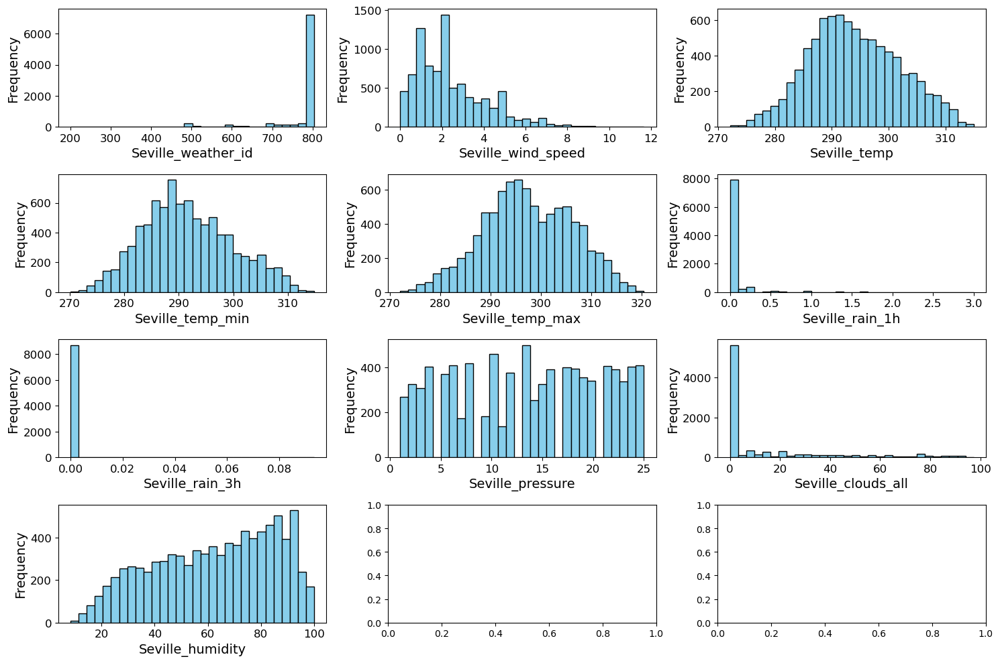

In [1487]:
# Define the number of rows and columns for subplots
number_of_rows = 4  # Number of rows in the subplot grid
number_of_columns = 3  # Number of columns in the subplot grid

# Plots histograms for all features with larger labels
fig, axes = plt.subplots(figsize=(15, 10), nrows=number_of_rows, ncols=number_of_columns)

# Iterate through the columns of the DataFrame and plot histograms
for i, column in enumerate(df_Seville.columns):
    row_index = i // number_of_columns
    col_index = i % number_of_columns
    ax = axes[row_index, col_index]
    
    ax.hist(df_Seville[column], bins=30, color='skyblue', edgecolor='black')
    ax.set_xlabel(column, fontsize=14)  # Set x-axis label with fontsize 14
    ax.set_ylabel('Frequency', fontsize=14)  # Set y-axis label with fontsize 14
    ax.tick_params(axis='both', which='both', labelsize=12)  # Set tick label fontsize

plt.tight_layout()  # Adjust the spacing between subplots
plt.show()

In the examination of Seville's weather data, we've identified distinct skewness patterns within various weather variables.

**Highly Right Skew:**
Certain variables, like wind speed, rainfall for 1 and 3 hours, and cloud coverage, exhibit a significant rightward or positive skew. This implies a prevalence of higher values in these categories. Seville experiences occasional strong winds, heavy short-term and prolonged rainfall, as well as cloudier weather, which aligns with these skewed patterns.

**High Left Skew:**
Other variables such as `Seville_weather_id`, displays a significant leftward or negative skew. This suggests frequent occurrences of specific weather conditions, denoted by lower weather IDs. Seville tends to experience certain consistent weather states, which contribute to this skewed pattern.

**Relatively Symmetrical:**
Certain variables, including temperature, temperature minimum and maximum, pressure, and humidity, exhibit a more symmetrical distribution around their means. This means that these aspects of weather, such as temperature levels and humidity, are fairly evenly spread around their average values, indicating a balanced climate in these aspects.

These skewness patterns offer qualitative insights into Seville's weather characteristics, which are essential for our subsequent analyses and modeling efforts, guiding our predictions and interpretations related to Seville's weather dynamics.

Finally, we will use the `kurtosis()` function to assess the shape and tail behavior of a probability distribution.

In [1488]:
# Create dataframe containing Kurtosis of all potential predictor variables:
kurt_df = df_Seville.kurtosis().to_frame()

# Display variables with high Kurtosis:
high_kurt= kurt_df[(kurt_df[0] >= 3)]
print("High kurtosis (Large amount of outliers):", high_kurt, "\n \n")

# Display variables with low Kurtosis:
low_kurt= kurt_df[(kurt_df[0] < 3)]
print("Low kurtosis (Small amount of outliers):", low_kurt, "\n \n")

High kurtosis (Large amount of outliers):                              0
Seville_weather_id   10.710308
Seville_rain_1h      93.840746
Seville_rain_3h     413.136592 
 

Low kurtosis (Small amount of outliers):                            0
Seville_wind_speed  1.398580
Seville_temp       -0.504132
Seville_temp_min   -0.475564
Seville_temp_max   -0.515989
Seville_pressure   -1.220040
Seville_clouds_all  2.155921
Seville_humidity   -1.017983 
 



The presented findings reveal the kurtosis values for specific variables in the dataset, indicating the presence of outliers.

**High Kurtosis (Large Amount of Outliers):**
Variables like `Seville_weather_id`, `Seville_rain_1h`, and `Seville_rain_3h` demonstrate high kurtosis, indicating a significant number of outliers. These variables contain extreme values that deviate substantially from the typical range. For instance, `Seville_rain_3h` has a very high kurtosis, suggesting rare but impactful events where there is an exceptionally heavy rainfall over a 3-hour period. 

**Low Kurtosis (Small Amount of Outliers):**
Variables such as `Seville_wind_speed`, `Seville_temp`, `Seville_temp_min`, `Seville_temp_max`, `Seville_pressure`, `Seville_clouds_all`, and `Seville_humidity` exhibit low kurtosis, indicating a distribution where most values cluster around the mean. These variables have fewer outliers, suggesting a more stable and typical range of values. For example, Seville_wind_speed has a low kurtosis, indicating that wind speeds in Seville generally fall within a predictable range. 

##### 5.1.6. df_Valencia:

In the final section dedicated to the analysis of Valencia city, a focused dataset, named `df_Valencia`, has been meticulously crafted, encompassing exclusively the variables pertinent to Valencia. 

In [1489]:
df_Valencia = df_clean[['Valencia_wind_speed' , 'Valencia_wind_deg', 'Valencia_temp' , 'Valencia_temp_max' , 'Valencia_temp_min' , 'Valencia_snow_3h' , 
           'Valencia_pressure', 'Valencia_humidity']]

 We will commence our exploration by examining the initial entries of the `df_Valencia` DataFrame. This pivotal step allows us to glean essential insights from the first two rows of the dataset, laying the foundation for our comprehensive analysis and informed decision-making in the modeling process.

In [1490]:
df_Valencia.head(2)

,Valencia_wind_speed,Valencia_wind_deg,Valencia_temp,Valencia_temp_max,Valencia_temp_min,Valencia_snow_3h,Valencia_pressure,Valencia_humidity
0,0.666667,5,269.888000,269.888000,269.888000,0.0,1002.666667,75.666667
1,1.666667,10,271.728333,271.728333,271.728333,0.0,1004.333333,71.000000


Next, let's look at some descriptive statistics for the rest of our variables:

In [1491]:
df_Valencia.describe()

,Valencia_wind_speed,Valencia_wind_deg,Valencia_temp,Valencia_temp_max,Valencia_temp_min,Valencia_snow_3h,Valencia_pressure,Valencia_humidity
count,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000
mean,2.586272,5.276389,290.592152,291.337233,289.867648,0.000205,1013.455228,65.247727
std,2.411190,2.877642,7.162274,7.565692,6.907402,0.011866,8.684485,19.262322
min,0.000000,1.000000,269.888000,269.888000,269.888000,0.000000,972.666667,10.333333
25%,1.000000,3.000000,285.150000,285.550167,284.783333,0.000000,1012.666667,51.333333
50%,1.666667,5.000000,290.176667,291.037000,289.550000,0.000000,1017.000000,67.000000
75%,3.666667,8.000000,296.056667,297.248333,294.820000,0.000000,1018.000000,81.333333
max,52.000000,10.000000,310.426667,314.263333,310.272000,0.791667,1021.666667,100.000000


To quantify the skewness of the data in the Valencia dataset, we will utilize the `skew()` function. This analytical tool will provide precise numerical values, allowing us to quantitatively assess the distributional characteristics of the variables in the dataset. By leveraging this method, we aim to gain a deeper understanding of the skewness patterns, essential for our meticulous analysis and modeling efforts in the Valencia context.

In [1492]:
# Create dataframe containing skewness of all potential predictor variables:
skew_df = df_Valencia.skew().to_frame()

# Display variables with high skewness
High_right_Skew = skew_df[(skew_df[0] >= 1)]
High_left_Skew = skew_df[(skew_df[0] <= -1)]
print("Highly right skew:", High_right_Skew, "\n \n")
print("High left skew:", High_left_Skew, "\n \n")

# Display variables with moderate skewness:
Mod_Right_Skew = skew_df[(skew_df[0] > 0.5) & (skew_df[0] < 1) ]
Mod_Left_Skew = skew_df[(skew_df[0] < -0.5) & (skew_df[0] > -1)]
print("Moderate Right skew:", Mod_Right_Skew, "\n \n")
print("Moderate Left skew:", Mod_Left_Skew, "\n \n")

# Display relatively symmetrical values:
Sym_skew = skew_df[(skew_df[0] <= 0.5) & (skew_df[0] >= -0.5) ]
print("Relatively Symmetrical:", Sym_skew, "\n \n")

Highly right skew:                              0
Valencia_wind_speed   3.499637
Valencia_snow_3h     63.298084 
 

High left skew:                           0
Valencia_pressure -2.121882 
 

Moderate Right skew: Empty DataFrame
Columns: [0]
Index: [] 
 

Moderate Left skew: Empty DataFrame
Columns: [0]
Index: [] 
 

Relatively Symmetrical:                           0
Valencia_wind_deg  0.088354
Valencia_temp      0.057476
Valencia_temp_max  0.082672
Valencia_temp_min  0.081832
Valencia_humidity -0.305757 
 



Taking our analysis a step further, we will employ visualization techniques to gain a deeper understanding of our variables. By generating histograms for each individual variable, we can unravel the inherent structure of our data. This visual exploration is instrumental in unraveling the complexities of our dataset, paving the way for a more comprehensive and informed analysis.

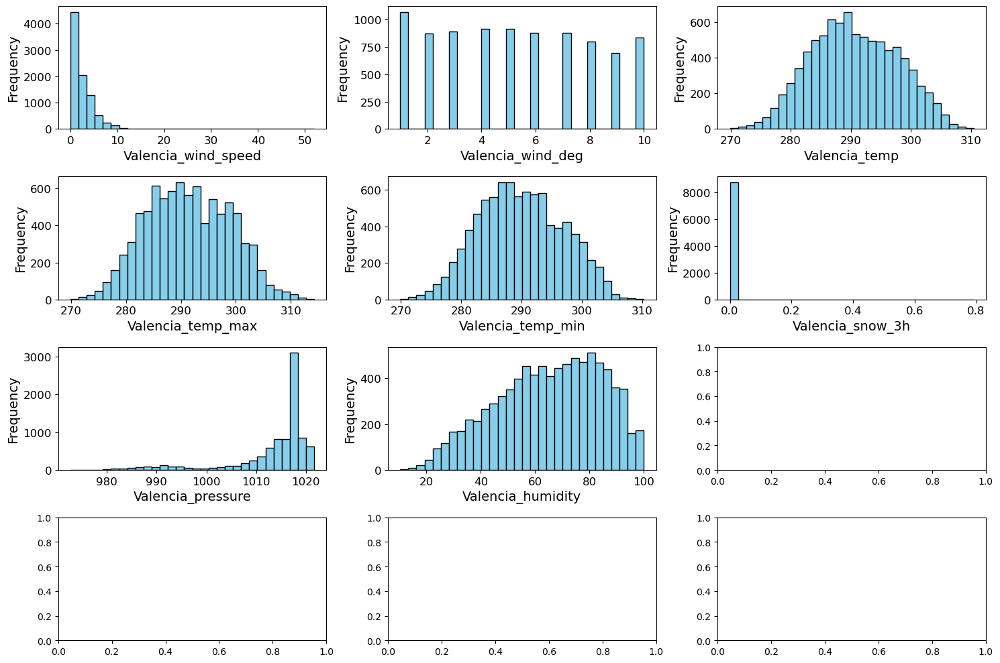

In [1493]:
# Define the number of rows and columns for subplots
number_of_rows = 4  # Number of rows in the subplot grid
number_of_columns = 3  # Number of columns in the subplot grid

# Plots histograms for all features with larger labels
fig, axes = plt.subplots(figsize=(15, 10), nrows=number_of_rows, ncols=number_of_columns)

# Iterate through the columns of the DataFrame and plot histograms
for i, column in enumerate(df_Valencia.columns):
    row_index = i // number_of_columns
    col_index = i % number_of_columns
    ax = axes[row_index, col_index]
    
    ax.hist(df_Valencia[column], bins=30, color='skyblue', edgecolor='black')
    ax.set_xlabel(column, fontsize=14)  # Set x-axis label with fontsize 14
    ax.set_ylabel('Frequency', fontsize=14)  # Set y-axis label with fontsize 14
    ax.tick_params(axis='both', which='both', labelsize=12)  # Set tick label fontsize

plt.tight_layout()  # Adjust the spacing between subplots
plt.show()


In our analysis of Valencia's weather data, we've identified notable skewness patterns within various weather variables.

**Highly Right Skew:**
Two variables, wind speed and snowfall for 3 hours, exhibit a significant rightward or positive skew. This suggests a prevalence of higher values in these categories. Valencia experiences occasional strong winds and rare instances of heavy snowfall, contributing to these skewed patterns.

**High Left Skew:**
Valencia_pressure displays a significant leftward or negative skew. This indicates frequent occurrences of lower pressure values in Valencia, highlighting a consistent atmospheric pressure pattern in the region.

**Relatively Symmetrical:**
Several variables, including wind degree, temperature, temperature minimum and maximum, and humidity, exhibit a more symmetrical distribution around their means. This means that these aspects of weather, such as wind direction, temperature levels, and humidity, are fairly evenly spread around their average values, indicating a balanced climate in these aspects in Valencia.

These skewness patterns provide qualitative insights into Valencia's weather characteristics, essential for our subsequent analyses and modeling efforts, guiding our predictions and interpretations related to Valencia's weather dynamics.

Finally, we will use the `kurtosis()` function to assess the shape and tail behavior of a probability distribution.

In [1494]:
# Create dataframe containing Kurtosis of all potential predictor variables:
kurt_df = df_Valencia.kurtosis().to_frame()

# Display variables with high Kurtosis:
high_kurt= kurt_df[(kurt_df[0] >= 3)]
print("High kurtosis (Large amount of outliers):", high_kurt, "\n \n")

# Display variables with low Kurtosis:
low_kurt= kurt_df[(kurt_df[0] < 3)]
print("Low kurtosis (Small amount of outliers):", low_kurt, "\n \n")

High kurtosis (Large amount of outliers):                                0
Valencia_wind_speed    35.645426
Valencia_snow_3h     4089.323165
Valencia_pressure       3.982718 
 

Low kurtosis (Small amount of outliers):                           0
Valencia_wind_deg -1.186661
Valencia_temp     -0.643793
Valencia_temp_max -0.613755
Valencia_temp_min -0.599551
Valencia_humidity -0.734345 
 



The presented findings reveal the kurtosis values for specific variables in the dataset, indicating the presence of outliers.

**High Kurtosis (Large Amount of Outliers):**
Variables like `Valencia_wind_speed`, `Valencia_snow_3h`, and `Valencia_pressure` exhibit high kurtosis, indicating a significant number of outliers. These variables contain extreme values that deviate substantially from the typical range, denoting rare but impactful events such as extreme wind speeds and unusual atmospheric pressure readings. 

**Low Kurtosis (Small Amount of Outliers):**
Variables including `Valencia_wind_deg`, `Valencia_temp`, `Valencia_temp_max`, `Valencia_temp_min`, and `Valencia_humidity` demonstrate low kurtosis, suggesting a distribution where most values cluster around the mean. These variables have fewer outliers, indicating a more stable and typical range of values. 

##### 5.1.7 Overall Data Analysis:

##### *5.1.7.1. Compare variables with `load_shortfall_3h`:*

Let's convert our data in order to analyze the average values across all cities:

In [1495]:
df_analyst = df_clean

In [1496]:
# Harvesting unique features in the analyst data
cloud =[]
temp= []
speed= []
rain= []
for col in df_analyst.columns:
    if "cloud" in col:
        cloud.append(col)
for col in df_analyst.columns:
    if col[-1]=="p" in col:
        temp.append(col)
for i in cloud:
    temp.append(i)
for col in df_analyst.columns:
    if "speed" in col:
        speed.append(col)
for col in df_analyst.columns:
    if "rain_3h" in col:
        rain.append(col)

df_analyst[temp].head()

,Barcelona_temp,Bilbao_temp,Madrid_temp,Seville_temp,Valencia_temp,Bilbao_clouds_all,Madrid_clouds_all,Seville_clouds_all
0,281.013000,269.338615,265.938000,274.254667,269.888000,0.0,0.0,0.0
1,280.561667,270.376000,266.386667,274.945000,271.728333,0.0,0.0,0.0
2,281.583667,275.027229,272.708667,278.792000,278.008667,0.0,0.0,0.0
3,283.434104,281.135063,281.895219,285.394000,284.899552,0.0,0.0,0.0
4,284.213167,282.252063,280.678437,285.513719,283.015115,2.0,0.0,0.0


In [1497]:
cloud =[]
for col in df_analyst.columns:
    if "cloud" in col:
        cloud.append(col)
df_analyst[cloud].head(1)

,Bilbao_clouds_all,Madrid_clouds_all,Seville_clouds_all
0,0.0,0.0,0.0


In [1498]:
temp= []
for col in df_analyst.columns:
    if col[-1]=="p" in col:
        temp.append(col)
temp.append("year")
temp.append("month")
temp.append("load_shortfall_3h")
for i in cloud:
    temp.append(i)
groupsp= df_analyst[temp].groupby(["year", "month"], as_index= False).mean()
groupsp["total temp"]=( groupsp["Valencia_temp"]+groupsp["Seville_temp"]+groupsp["Barcelona_temp"]+groupsp["Bilbao_temp"]
                     +groupsp["Madrid_temp"])/5
groupsp["total cloud"]= (groupsp["Bilbao_clouds_all"]+groupsp["Seville_clouds_all"]+groupsp["Madrid_clouds_all"])/3
groupsp.tail(1)

,year,month,Barcelona_temp,Bilbao_temp,Madrid_temp,Seville_temp,Valencia_temp,load_shortfall_3h,Bilbao_clouds_all,Madrid_clouds_all,Seville_clouds_all,total temp,total cloud
35,2017,12,281.514933,280.072594,278.887647,283.420023,283.713895,10041.087366,54.913978,24.333333,16.775538,281.521818,32.007616


In [1499]:
group= df_analyst[temp].groupby(["year", "month"], as_index= False).mean()
group["year"]= group["year"].astype("str")
group["month"]=group["month"].astype("str")
group["ym"]= group["year"]+ "/"+ group["month"]
group["ym"].head()

0    2015/1
1    2015/2
2    2015/3
3    2015/4
4    2015/5
Name: ym, dtype: object

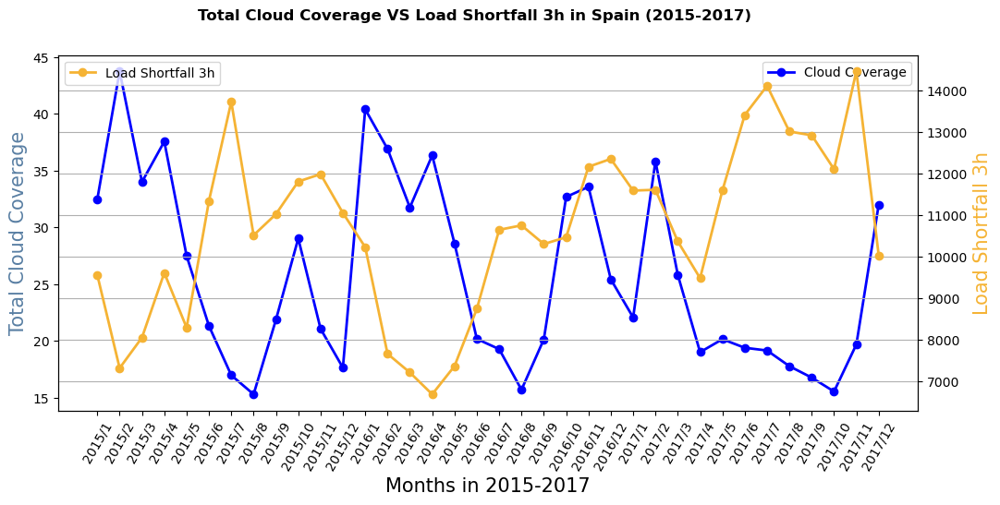

In [1500]:
fig, ax = plt.subplots(figsize=[12, 5])

# Plotting the firts line with ax axes
ax.plot(group["ym"], groupsp['total cloud'] ,
        color='b', linewidth=2, marker='o', label="Cloud Coverage")
plt.xticks(rotation=60)
ax.set_xlabel('Months in 2015-2017', fontsize=15)
ax.set_ylabel('Total Cloud Coverage',  color='#597FA3', fontsize=15)
# Create a twin axes ax2 using twinx() function
ax2 = ax.twinx()
l=groupsp["load_shortfall_3h"].loc[0:37]
# Now, plot the second line with ax2 axes
ax2.plot([col for col in range(len(l))],
         l,
         color='#F5B334', linewidth=2, marker='o', label="Load Shortfall 3h")
ax2.grid()
ax.legend(loc=1)
ax2.legend(loc=9)
fig.suptitle('Total Cloud Coverage VS Load Shortfall 3h in Spain (2015-2017)', fontweight ="bold")
ax2.set_ylabel('Load Shortfall 3h', color="#F5B334",fontsize=15)
plt.legend()
plt.show()

Our analysis of the graph reveals an intriguing inverse relationship between total cloud coverage and load shortfall across the cities during the period from 2015 to 2017. Specifically, when examining the data, it becomes apparent that the peaks in load shortfall align with dips in total cloud coverage, indicating a potential correlation between these two factors.

During the initial period between May 2015 and July 2015, and then again from April 2017 to October 2017, load shortfall reaches its highest points. Interestingly, these periods coincide with lower total cloud coverage. This inverse pattern suggests that there might be a connection between decreased cloud coverage and increased energy demand or potential weather-related challenges leading to higher load shortfalls.

This observation is crucial for Disaster Resilience Solutions' preparedness efforts. By recognizing this inverse relationship, the agency can anticipate potential energy demand spikes during periods of reduced cloud coverage, allowing for strategic resource allocation, targeted response planning, and enhanced disaster resilience measures, ensuring a more proactive and effective approach to managing energy supply challenges during adverse weather conditions.

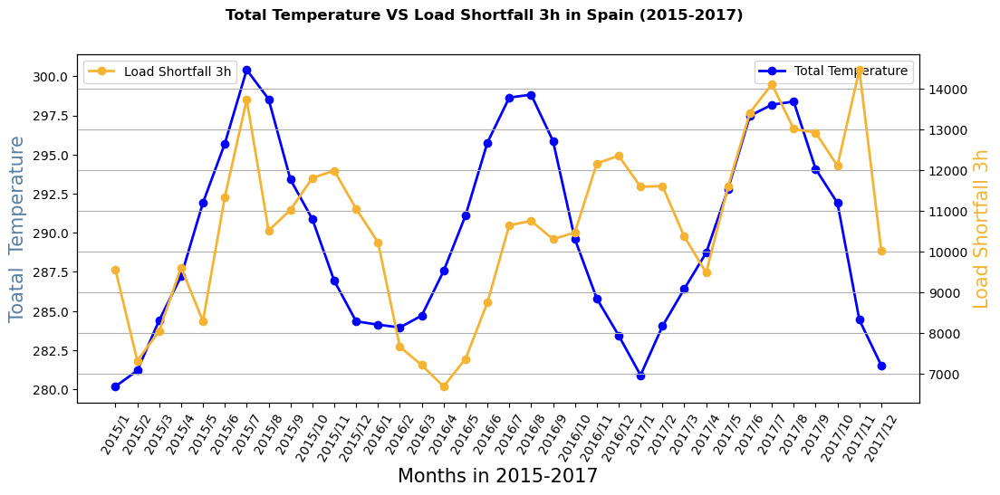

In [1501]:
fig, ax = plt.subplots(figsize=[12, 5])

# Plotting the firts line with ax axes
ax.plot(group['ym'], groupsp["total temp"],
        color='b', linewidth=2, marker='o', label="Total Temperature")
plt.xticks(rotation=60)
ax.set_xlabel('Months in 2015-2017', fontsize=15)
ax.set_ylabel('Toatal  Temperature',  color='#597FA3', fontsize=15)
# Create a twin axes ax2 using twinx() function
ax2 = ax.twinx()

# Now, plot the second line with ax2 axes
ax2.plot(group["ym"],
         group["load_shortfall_3h"].loc[0:37],
         color='#F5B334', linewidth=2, marker='o', label="Load Shortfall 3h")
ax2.grid()
ax.legend(loc=1)
ax2.legend(loc=8)
fig.suptitle('Total Temperature VS Load Shortfall 3h in Spain (2015-2017)', fontweight ="bold")
ax2.set_ylabel('Load Shortfall 3h', color="#F5B334",fontsize=15)
plt.legend()
plt.show()

Upon close examination of the data, a clear direct correlation emerges between the total temperature of all cities and the load shortfall, underscoring the influence of temperature variations on energy demand. Throughout most of the analyzed period, the total temperature trends align with the load shortfall trends, indicating that higher temperatures generally coincide with increased energy demand and load shortfalls.

However, it is noteworthy that between October 2016 and April 2017, this direct correlation appears to deviate. During this period, despite fluctuations in temperature, the load shortfall remains relatively stable. This anomaly suggests that other factors might have mitigated the typical impact of temperature on energy demand during these specific months.

Additionally, two specific instances stand out from the overall pattern: July 2017 and November 2017. During these months, there is a notable mismatch between total temperature and load shortfall. Despite temperatures, the load shortfall is unexpectedly high. This divergence implies that there might be external factors or specific events influencing energy demand during these particular months, warranting further investigation.

Understanding these nuanced correlations and anomalies is pivotal for Disaster Resilience Solutions' resilience planning. By recognizing the typical relationship between temperature and energy demand, the agency can anticipate and prepare for heightened load shortfalls during periods of elevated temperatures. Moreover, the identification of atypical months, such as July 2017 and November 2017, emphasizes the importance of exploring external variables and regional events that might impact energy demand, enabling the agency to refine its predictive models and enhance disaster preparedness strategies effectively.

In [1502]:
group["year"]= group["year"].astype("str")
group["month"]=group["month"].astype("str")
group["ym"]= group["year"]+ "/"+ group["month"]
# group["ym"].head()
speed= []
for col in df_analyst.columns:
    if "speed" in col:
        speed.append(col)
speed
speed.append("year")
speed.append("month")
speed.append("load_shortfall_3h")
groupsp= df_analyst[speed].groupby(["year", "month"], as_index= False).mean()
groupsp["Avg_Wind_speed"]= (groupsp.drop(columns=["year","month", "load_shortfall_3h"])).mean(axis=1)
# group["total temp"]=( group["Valencia_temp"]+group["Seville_temp"]+group["Barcelona_temp"]+group["Bilbao_temp"]+group["madrid_temp"])/5
# group["total cloud"]= (group["Bilbao_clouds_all"]+group["Seville_clouds_all"]+group["madrid_clouds_all"])/3
# group.shape

groupsp["ym"]= group["ym"]
groupsp.head()

,year,month,Barcelona_wind_speed,Bilbao_wind_speed,Madrid_wind_speed,Seville_wind_speed,Valencia_wind_speed,load_shortfall_3h,Avg_Wind_speed,ym
0,2015,1,2.289796,1.651701,2.191837,3.004082,4.776871,9567.351701,2.782857,2015/1
1,2015,2,3.033033,1.827327,3.614114,3.241742,5.929429,7327.774775,3.529129,2015/2
2,2015,3,4.055780,1.090054,2.475806,2.393145,2.579301,8062.243280,2.518817,2015/3
3,2015,4,2.643056,1.162500,2.919444,2.408333,2.290278,9621.084722,2.284722,2015/4
4,2015,5,2.981183,1.295699,3.263441,2.778226,2.067204,8300.656586,2.477151,2015/5


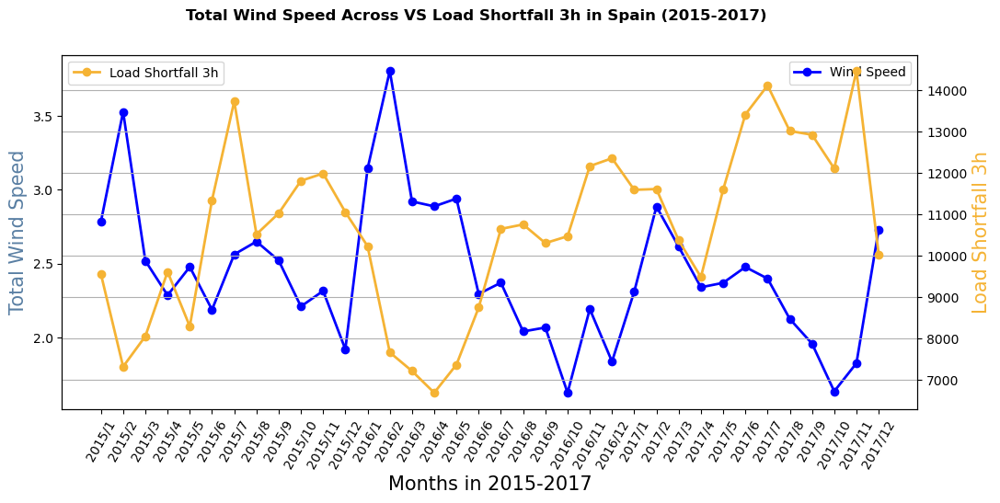

In [1503]:
fig, ax = plt.subplots(figsize=[12, 5])

# Plotting the firts line with ax axes
ax.plot(group['ym'], groupsp["Avg_Wind_speed"].loc[0:37],
        color='b', linewidth=2, marker='o', label="Wind Speed")
plt.xticks(rotation=60)
ax.set_xlabel('Months in 2015-2017', fontsize=15)
ax.set_ylabel('Total Wind Speed',  color='#597FA3', fontsize=15)
# Create a twin axes ax2 using twinx() function
ax2 = ax.twinx()

# Now, plot the second line with ax2 axes
ax2.plot(group["ym"],
         group["load_shortfall_3h"].loc[0:37],
         color='#F5B334', linewidth=2, marker='o', label="Load Shortfall 3h")
ax2.grid()
ax.legend(loc=1)
ax2.legend(loc=8)
fig.suptitle('Total Wind Speed Across VS Load Shortfall 3h in Spain (2015-2017)', fontweight ="bold")
ax2.set_ylabel('Load Shortfall 3h', color="#F5B334",fontsize=15)
plt.legend()
plt.show()

A striking inverse relationship is evident between total wind speed and load shortfall across the analyzed period. This inverse correlation implies that as wind speed increases, the load shortfall tends to decrease, and vice versa. This pattern underscores the impact of wind speed on energy generation and distribution, with higher wind speeds potentially contributing to increased energy production, thus mitigating load shortfalls.

Notably, three specific periods stand out due to significant load shortfall spikes: July 2015, July 2017, and November 2017. During these months, despite varying wind speeds, the load shortfalls reach their peak levels. This discrepancy suggests that factors beyond wind speed alone are influencing energy demand and supply, leading to pronounced load shortfalls during these specific periods.

Understanding this inverse relationship between total wind speed and load shortfall provides valuable insights for Disaster Resilience Solutions' resilience planning efforts. By leveraging this correlation, the agency can anticipate periods of potential energy shortfalls based on wind speed forecasts. However, the identified anomalies in July 2015, July 2017, and November 2017 indicate that there are additional factors contributing to load shortfalls during these months.

In [1504]:
rain= []
for col in df_analyst.columns:
    if "rain_3h" in col:
        rain.append(col)

rain.append("year")
rain.append("month")
rain.append("load_shortfall_3h")
rains= df_analyst[rain].groupby(["year", "month"], as_index= False).mean()
rains["rain_3h"]= (rains.drop(columns=["year","month", "load_shortfall_3h"])).mean(axis=1)
rains
# # group["total temp"]=( group["Valencia_temp"]+group["Seville_temp"]+group["Barcelona_temp"]+group["Bilbao_temp"]+group["madrid_temp"])/5
# # group["total cloud"]= (group["Bilbao_clouds_all"]+group["Seville_clouds_all"]+group["madrid_clouds_all"])/3
# # group.shape
# #
groupsp["ym"]= group["ym"]
groupsp.head()

,year,month,Barcelona_wind_speed,Bilbao_wind_speed,Madrid_wind_speed,Seville_wind_speed,Valencia_wind_speed,load_shortfall_3h,Avg_Wind_speed,ym
0,2015,1,2.289796,1.651701,2.191837,3.004082,4.776871,9567.351701,2.782857,2015/1
1,2015,2,3.033033,1.827327,3.614114,3.241742,5.929429,7327.774775,3.529129,2015/2
2,2015,3,4.055780,1.090054,2.475806,2.393145,2.579301,8062.243280,2.518817,2015/3
3,2015,4,2.643056,1.162500,2.919444,2.408333,2.290278,9621.084722,2.284722,2015/4
4,2015,5,2.981183,1.295699,3.263441,2.778226,2.067204,8300.656586,2.477151,2015/5


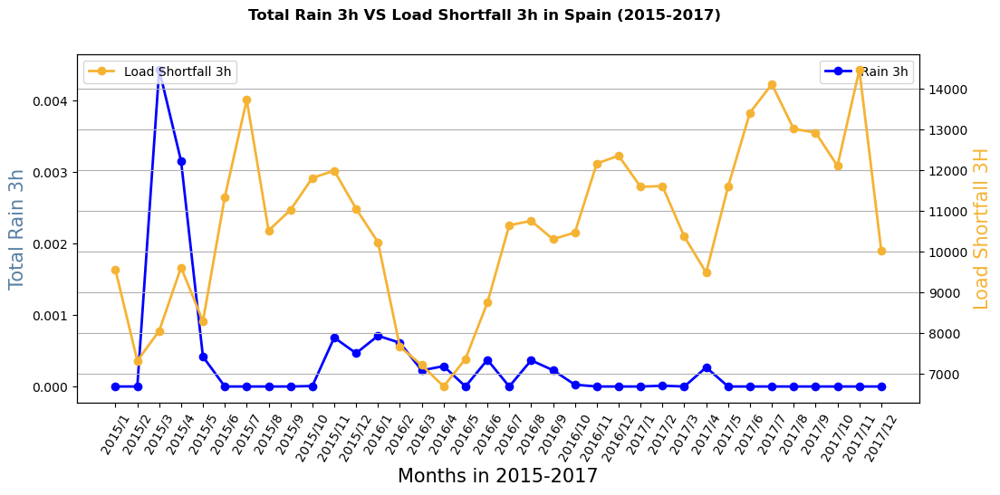

In [1505]:
fig, ax = plt.subplots(figsize=[12, 5])

# Plotting the firts line with ax axes
ax.plot(group['ym'], rains["rain_3h"],
        color='b', linewidth=2, marker='o', label="Rain 3h")
plt.xticks(rotation=60)
ax.set_xlabel('Months in 2015-2017', fontsize=15)
ax.set_ylabel('Total Rain 3h',  color='#597FA3', fontsize=15)
# Create a twin axes ax2 using twinx() function
ax2 = ax.twinx()

# Now, plot the second line with ax2 axes
ax2.plot(group["ym"],
         group["load_shortfall_3h"],
         color='#F5B334', linewidth=2, marker='o', label="Load Shortfall 3h")
ax2.grid()
ax.legend(loc=1)
ax2.legend(loc=8)
fig.suptitle('Total Rain 3h VS Load Shortfall 3h in Spain (2015-2017)', fontweight ="bold")
ax2.set_ylabel('Load Shortfall 3H', color="#F5B334",fontsize=15)
plt.legend()
plt.show()

A thorough examination of the relationship between total 3-hour rainfall across all cities and load shortfall indicates a lack of significant correlation. Despite a noticeable spike in 3-hour rainfall in March 2015, the corresponding increase in load shortfall is relatively modest, suggesting a weak connection between these variables during that period.

This observed lack of correlation emphasizes the complexity of factors influencing energy demand and supply during adverse weather conditions. While rainfall can impact energy production, it appears that the 3-hour rainfall metric alone does not strongly influence load shortfalls across the analyzed timeframe.

##### *5.1.7.2. Correlations:*

Correlation coefficient is a measure of the how variables are related to one another. It is a standardized covariance, which measures how two random variables change with respect to each other. Since Covariance is scale dependent, we use the correlation coefficient (specifically Pearson Correlation) which standardizes the covariance to a scale between -1 and 1.

* A correlation coefficient closer 1 represents a strong linear relationship in the same direction, 
* A correlation coefficient closer to -1 represents a strong linear relationship in the opposite direction,
* A correlation closer to 0 represents a weak relationship.

The formula is given by:
$$\rho=\frac{Cov(X,Y)}{\sigma(X)\sigma(Y)}$$
Where
* $Cov(X,Y)$ represents the covariance between X and Y
* $\sigma(X)$ & $\sigma(Y)$ represent the standard deviations of X & Y respectively

Let's utilize the corr() function to explore the correlations among our dataset variables. Correlation analysis enables us to discern relationships between different features, shedding light on potential dependencies within the data. This quantitative approach is fundamental in identifying patterns and guiding subsequent analytical decisions, enriching our understanding of the underlying dynamics in the dataset.

In [1506]:
df_clean.corr()

,season,year,month,day,hourofday,Barcelona_weather_id,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_temp,Barcelona_temp_min,...,Seville_humidity,Valencia_wind_speed,Valencia_wind_deg,Valencia_temp,Valencia_temp_max,Valencia_temp_min,Valencia_snow_3h,Valencia_pressure,Valencia_humidity,load_shortfall_3h
season,1.000000,-0.000943,0.574388,0.002138,0.000302,-0.024873,-0.076571,-0.081097,0.527081,0.479905,...,-0.292314,-0.221606,-0.156524,0.491729,0.492845,0.479553,-0.023356,-0.020205,0.042495,0.176688
year,-0.000943,1.000000,-0.001039,-0.001044,0.000275,0.029048,-0.188756,-0.155275,0.001255,0.053927,...,-0.045730,-0.012650,-0.057513,0.067764,0.018818,0.119432,-0.021228,0.210942,-0.033132,0.131324
month,0.574388,-0.001039,1.000000,0.008826,0.000301,0.025352,-0.122221,0.021463,0.203184,0.159629,...,-0.111622,-0.237156,-0.140195,0.216464,0.210184,0.220501,-0.022720,0.085883,0.162713,0.199048
day,0.002138,-0.001044,0.008826,1.000000,0.000285,-0.035885,-0.009699,-0.039703,-0.001659,0.002132,...,0.032979,-0.000340,-0.010627,-0.000728,-0.002345,0.002727,-0.023046,-0.056908,0.047823,0.092116
hourofday,0.000302,0.000275,0.000301,0.000285,1.000000,-0.003444,0.182538,-0.192949,0.217222,0.242716,...,-0.424982,0.204103,-0.138415,0.280332,0.257827,0.296154,-0.001360,-0.022716,-0.351680,0.139285
Barcelona_weather_id,-0.024873,0.029048,0.025352,-0.035885,-0.003444,1.000000,-0.048004,0.151534,0.029239,0.046167,...,-0.050515,-0.037605,-0.018537,0.031316,0.017432,0.046090,-0.005456,0.096241,-0.096343,0.063868
Barcelona_wind_speed,-0.076571,-0.188756,-0.122221,-0.009699,0.182538,-0.048004,1.000000,0.076376,0.116240,0.109268,...,-0.138625,0.347966,0.042795,0.121330,0.138254,0.097663,0.030336,-0.095032,-0.249610,-0.103633
Barcelona_wind_deg,-0.081097,-0.155275,0.021463,-0.039703,-0.192949,0.151534,0.076376,1.000000,-0.189016,-0.226583,...,0.164064,-0.066071,0.151146,-0.201419,-0.170304,-0.228330,-0.021024,0.096420,0.045277,-0.116133
Barcelona_temp,0.527081,0.001255,0.203184,-0.001659,0.217222,0.029239,0.116240,-0.189016,1.000000,0.964089,...,-0.617797,-0.021456,-0.260622,0.914601,0.912094,0.892024,-0.029135,-0.067210,-0.247168,0.182673
Barcelona_temp_min,0.479905,0.053927,0.159629,0.002132,0.242716,0.046167,0.109268,-0.226583,0.964089,1.000000,...,-0.595065,0.001413,-0.240981,0.874447,0.845057,0.879687,-0.027172,-0.140186,-0.266820,0.195984


Considering the extensive nature of our dataset involving 52 variables, an intuitive approach to grasp the interrelationships is through a visual representation. A heatmap of correlation provides a clear, graphical depiction of the correlation coefficients among the variables. By employing this visualization, we can readily discern patterns of strong correlations, facilitating a more precise understanding of the intricate relationships within our data. This visual analysis enhances our ability to identify key variables and informs our subsequent analytical decisions effectively.

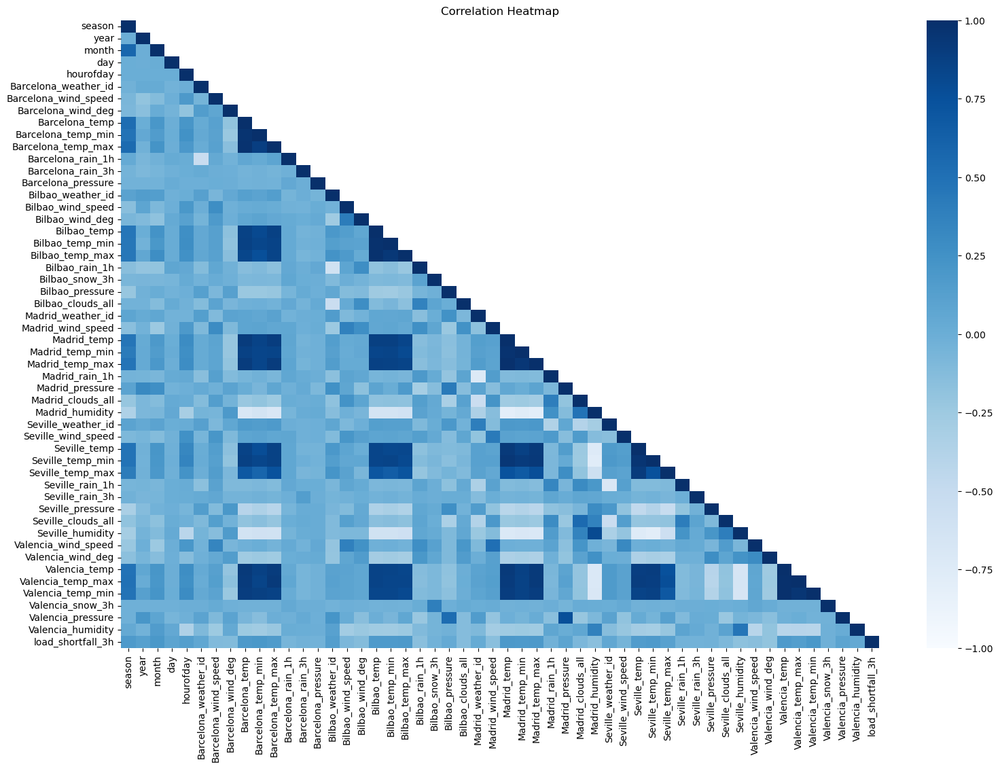

In [1507]:
# Initiate a new figure object to plot our heatmap (increased figsize)
plt.figure(figsize=(18, 12))

# We look at only the lower triangle of the array, since it is symmetric around the diagonal
mask = np.tril(df_clean.corr()) == 0

# Plotting the heatmap with blue color map
sns.heatmap(df_clean.corr(),
            vmin=-1,
            vmax=1,
            mask=mask,
            cmap='Blues'  # Change the color map to blue
           )

plt.title('Correlation Heatmap');
plt.show() 

**Temperature and Seasonal Correlations:**
Unsurprisingly, the heatmap vividly illustrates a robust correlation between temperatures across diverse cities, aligning logically with the influence of seasons. As anticipated, cities experience similar temperature fluctuations based on their geographical locations and prevailing seasons.

**Pressure and Humidity Correlations:**
Additionally, noteworthy correlations emerge between atmospheric pressure and humidity levels within the cities. These relationships shed light on the intricate dynamics of weather patterns and atmospheric conditions, offering a glimpse into the interconnectedness of these variables.

**Load Shortfall and Multifaceted Correlations:**
One of the most intriguing findings pertains to the correlations involving `load_shortfall_3h`. This variable exhibits significant connections not only with temperatures but also with several temporal parameters, including year, month, day, and hour of the day. This intricate web of correlations suggests that electricity load shortfalls are influenced by a multitude of factors, spanning both meteorological and temporal dimensions.

In order to substantiate the inferences drawn from our analysis, a rigorous exploration of the dataset is imperative. One pivotal aspect is to identify the variables most intricately linked with `load_shortfall_3h`. This discernment will not only bolster our understanding but also serve as a cornerstone for the subsequent modeling endeavors. Let us now proceed to ascertain the ten most highly correlated variables with `load_shortfall_3h`, thereby elucidating the intricate relationships within the dataset.

In [1508]:
# Find the ten most correlated variables with the target variable
corr_top10_df = (
    df_clean.corr()['load_shortfall_3h']
    .apply(lambda x : abs(x))
    .sort_values(ascending=False)
    .head(11)
)

# Display predictor variables
corr_top10_df[1:11]

Valencia_temp_min     0.201863
month                 0.199048
Barcelona_temp_min    0.195984
Valencia_wind_deg     0.188674
Madrid_temp           0.186036
Barcelona_temp        0.182673
Madrid_temp_max       0.182548
Bilbao_temp_max       0.180934
season                0.176688
Bilbao_temp           0.176411
Name: load_shortfall_3h, dtype: float64

The analysis reveals compelling correlations between `load_shortfall_3h` and various environmental and temporal factors. Specifically, higher minimum temperatures in Valencia and Barcelona, along with elevated temperatures in Madrid and Bilbao, are positively associated with increased `load_shortfall_3h`. Additionally, wind direction in Valencia, maximum temperatures in Madrid and Bilbao, and specific months and seasons also exhibit positive correlations with `load_shortfall_3h`. These findings underscore the multifaceted nature of energy shortfalls, indicating that both weather-related variables and temporal patterns significantly impact the energy demand-supply dynamics in the studied regions.

Based on the aforementioned data, it is evident that even our most highly correlated predictor variable shows a relatively modest correlation with our target variable. To gain deeper insights, let's explore this further by visualizing the correlations between our variables and all other factors in the dataset.

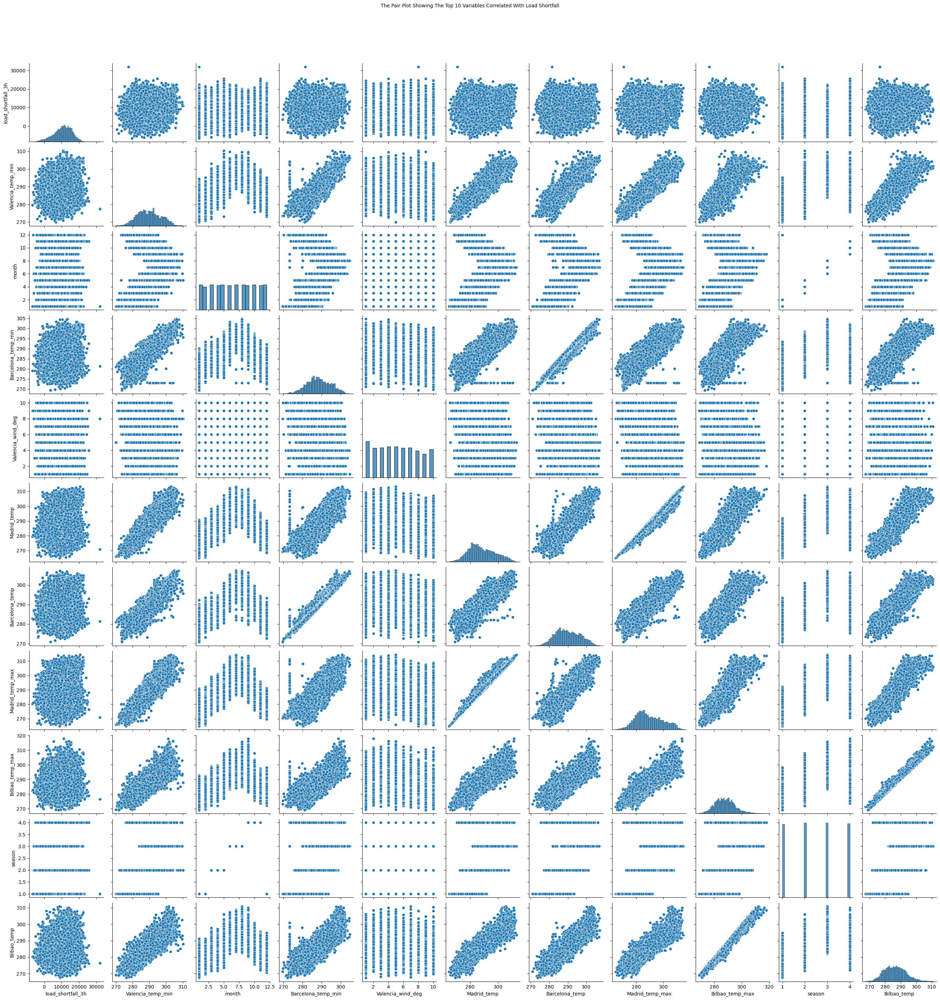

In [1509]:
top10 = sns.pairplot(df_clean[corr_top10_df.index]
                    )
top10.fig.suptitle('The Pair Plot Showing The Top 10 Variables Correlated With Load Shortfall', 
                   y=1.05,
                   size=10)
plt.show()

Once more, the data presented reinforces the observation that none of the predictors exhibit a significantly high correlation with `load_shortfall_3h`. However, noteworthy correlations between predictors, such as `valencia_temp_min` and `valencia_temp`, suggest the presence of multicollinearity. This phenomenon, where predictors are strongly correlated with each other, can lead to less reliable statistical inferences when constructing predictive models. Distinguishing the individual effects of variables on the target variable becomes challenging due to this interrelation, emphasizing the need for careful consideration and handling of multicollinearity in the modeling process.

A viable approach to mitigate the impact of multicollinearity is by examining the variance of the variables and excluding features with minimal variation across observations, as they provide limited information to the model. This entails setting a specific variance threshold and eliminating all features that fall below this threshold. By implementing this method, we can enhance the quality of the data used for modeling, ensuring that the selected features contribute meaningful and distinct information, thereby improving the reliability of our predictive models.

We will address this in the next section of our notebook.

<a id="five"></a>
## 6. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Modelling ⚡ |
| :--------------------------- |
| In this section, you are required to create one or more regression models that are able to accurately predict the thee hour load shortfall. |

---

### **6.1. Preprocessing Data:**

##### **6.1.1 Variance Threshold:**

A variance threshold is a technique used in feature selection to identify and remove features (variables) with low variance from a dataset. Variance measures the spread of values in a feature. Features with low variance indicate that their values don't vary much across different observations in the dataset. In the context of machine learning, these low-variance features carry minimal information as they don't contribute significantly to distinguishing between different instances. By removing these low-variance features, you can simplify the model, reduce overfitting, and improve its performance.

Since variance is dependent on scale, we will first need to standardise the features. Feature standardisation is a technique used in machine learning to transform the variables of a dataset so that they have the properties of a standard normal distribution with a mean of 0 and a standard deviation of 1.

In [1510]:
# Split predictor variables from target variable
x_data = df_clean.drop(columns=['load_shortfall_3h'])  # Predictor variables (all columns except 'load_shortfall_3h')
y_data = df_clean['load_shortfall_3h']  # Target variable

# Standardising the data (using MinMaxScaler in sklearn.preprocessing package):
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(x_data)
X_standardise_data = pd.DataFrame(X_scaled, columns=x_data.columns)

We can then implement an instance of the VarianceThreshold class contained in sklearn.feature_selection to select the correct subset of our features based on our chosen threshold (0.03 in this case):

In [1511]:
# Create VarianceThreshold object
selector = VarianceThreshold(threshold=0.03)

# Use the object to apply the threshold on data
selector.fit(X_standardise_data)

VarianceThreshold(threshold=0.03)

Having applied this threshold to the data, we can view the calculated variance for each predictor variable:

In [1512]:
# Get column variances
column_variances = selector.variances_

# Create dictionary of column variances
vars_dict = {}
vars_dict = [{"Variable_Name": c_name, "Variance": c_var}
             for c_name, c_var in zip(X_standardise_data.columns, column_variances)]

# Transform dictionary into a dataframe for better visualization
df_vars = pd.DataFrame(vars_dict)
df_vars.sort_values(by='Variance', ascending=False)

,Variable_Name,Variance
1,year,0.166467
0,season,0.138013
4,hourofday,0.107136
23,Bilbao_clouds_all,0.105945
44,Valencia_wind_deg,0.102221
2,month,0.098241
40,Seville_pressure,0.090924
3,day,0.086009
16,Bilbao_wind_deg,0.080656
31,Madrid_clouds_all,0.078692


The variables in the dataset exhibit varying levels of variance, with `year` having the highest variance and `Barcelona_pressure` having the lowest variance. Variability in the dataset decreases as you move down the list.

Variables related to time and weather conditions, such as `season`, `hourofday`, and various temperature and humidity measurements, demonstrate significant variance, indicating fluctuations in these factors over the observed period. Other weather-related variables like 'cloud coverage' and 'rain/snow amounts' also show notable variance.

In contrast, variables like `Barcelona_pressure` and `Valencia_snow_3h` exhibit very low variance, suggesting limited changes or fluctuations in these parameters.

In summary, the dataset contains a mix of highly variable and relatively stable factors. The variables with high variance are likely to have a more significant impact on the overall dataset, capturing a wide range of conditions, while those with low variance may have a more consistent and stable behavior over the observed period.

Based on these findings, let's drop the variables with a high variance:

In [1513]:
# Find columns to remove:
df_vars_remove = df_vars[df_vars['Variance']<0.03]


# Make a list of column names to remove
columns_to_remove = list(df_vars_remove["Variable_Name"])

# Display variables to be removed, along with their variances
df_vars_remove.sort_values(by="Variance", ascending=False)

,Variable_Name,Variance
9,Barcelona_temp_min,0.029827
47,Valencia_temp_min,0.029252
46,Valencia_temp_max,0.029065
17,Bilbao_temp,0.024880
18,Bilbao_temp_min,0.021878
5,Barcelona_weather_id,0.021340
19,Bilbao_temp_max,0.021109
34,Seville_wind_speed,0.020559
25,Madrid_wind_speed,0.020257
22,Bilbao_pressure,0.020208


Now, we can select our new columns to include in the model:

In [1514]:
# Select new columns
x_new = X_standardise_data[X_standardise_data.columns[selector.get_support(indices=True)]]

# Save variable names for later
x_var_names = x_new.columns

# Comparing predictor variable count before and after applying variance threshold:
print("Before threshold: ", len(df_vars.T.columns), " predictors")
print("After threshold: ", len(x_new.columns), " predictors")

Before threshold:  51  predictors
After threshold:  27  predictors


In [1515]:
# Standardising the data (using MinMaxScaler in sklearn.preprocessing package):
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(x_new)
X_standardise = pd.DataFrame(X_scaled, columns=x_new.columns)

In [1516]:
X_standardise.head(-20)

,season,year,month,day,hourofday,Barcelona_wind_deg,Barcelona_temp,Barcelona_temp_max,Bilbao_weather_id,Bilbao_wind_deg,...,Seville_temp,Seville_temp_min,Seville_temp_max,Seville_pressure,Seville_clouds_all,Seville_humidity,Valencia_wind_deg,Valencia_temp,Valencia_pressure,Valencia_humidity
0,0.0,0.0,0.0,0.000000,0.142857,0.118519,0.279352,0.211393,0.993296,0.621521,...,0.051072,0.091896,0.045263,1.000000,0.000000,0.720000,0.444444,0.000000,0.612245,0.728625
1,0.0,0.0,0.0,0.000000,0.285714,0.386111,0.266986,0.200628,0.993296,0.615028,...,0.067158,0.107351,0.059520,1.000000,0.000000,0.763636,1.000000,0.045397,0.646259,0.676580
2,0.0,0.0,0.0,0.000000,0.428571,0.905556,0.294986,0.225004,0.993296,0.596475,...,0.156803,0.193478,0.138971,1.000000,0.000000,0.687273,0.888889,0.200319,0.666667,0.617100
3,0.0,0.0,0.0,0.000000,0.571429,0.758333,0.345683,0.269139,0.993296,0.555659,...,0.310647,0.341284,0.275318,1.000000,0.000000,0.621818,0.777778,0.370302,0.741497,0.486989
4,0.0,0.0,0.0,0.000000,0.714286,0.722222,0.367027,0.287721,0.993296,0.514842,...,0.313437,0.343964,0.277791,1.000000,0.000000,0.552727,0.666667,0.323817,0.925170,0.535316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8738,0.0,1.0,1.0,0.900000,1.000000,0.250000,0.232877,0.214661,0.491061,0.844156,...,0.399337,0.402985,0.387310,0.666667,0.650685,0.767273,0.666667,0.458706,0.789116,0.631970
8739,0.0,1.0,1.0,0.933333,0.000000,0.268519,0.221461,0.198760,0.602793,0.712430,...,0.382403,0.395522,0.359773,0.750000,0.821918,0.821818,0.000000,0.417593,0.850340,0.698885
8740,0.0,1.0,1.0,0.933333,0.142857,0.572222,0.214612,0.174909,0.827374,0.536178,...,0.371684,0.380597,0.352889,0.750000,0.363014,0.858182,1.000000,0.351812,0.884354,0.713755
8741,0.0,1.0,1.0,0.933333,0.285714,0.109259,0.161553,0.143107,0.378771,0.160482,...,0.365237,0.373134,0.352889,0.750000,0.821918,0.858182,0.888889,0.294254,0.904762,0.814126


In [1517]:
X_standardise_data.head(-20)

,season,year,month,day,hourofday,Barcelona_weather_id,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_temp,Barcelona_temp_min,...,Seville_clouds_all,Seville_humidity,Valencia_wind_speed,Valencia_wind_deg,Valencia_temp,Valencia_temp_max,Valencia_temp_min,Valencia_snow_3h,Valencia_pressure,Valencia_humidity
0,0.0,0.0,0.0,0.000000,0.142857,0.993370,0.500000,0.118519,0.279352,0.326311,...,0.000000,0.720000,0.012821,0.444444,0.000000,0.000000,0.000000,0.0,0.612245,0.728625
1,0.0,0.0,0.0,0.000000,0.285714,0.993370,0.315789,0.386111,0.266986,0.313538,...,0.000000,0.763636,0.032051,1.000000,0.045397,0.041472,0.045571,0.0,0.646259,0.676580
2,0.0,0.0,0.0,0.000000,0.428571,0.993370,0.157895,0.905556,0.294986,0.342462,...,0.000000,0.687273,0.019231,0.888889,0.200319,0.183000,0.201086,0.0,0.666667,0.617100
3,0.0,0.0,0.0,0.000000,0.571429,0.993370,0.184211,0.758333,0.345683,0.394833,...,0.000000,0.621818,0.019231,0.777778,0.370302,0.338286,0.371720,0.0,0.741497,0.486989
4,0.0,0.0,0.0,0.000000,0.714286,0.993370,0.342105,0.722222,0.367027,0.416882,...,0.000000,0.552727,0.019231,0.666667,0.323817,0.295820,0.325057,0.0,0.925170,0.535316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8738,0.0,1.0,1.0,0.900000,1.000000,0.993370,0.052632,0.250000,0.232877,0.226415,...,0.650685,0.767273,0.051282,0.666667,0.458706,0.419047,0.460463,0.0,0.789116,0.631970
8739,0.0,1.0,1.0,0.933333,0.000000,0.995028,0.078947,0.268519,0.221461,0.216981,...,0.821918,0.821818,0.006410,0.000000,0.417593,0.381488,0.419192,0.0,0.850340,0.698885
8740,0.0,1.0,1.0,0.933333,0.142857,0.993370,0.105263,0.572222,0.214612,0.235849,...,0.363014,0.858182,0.044872,1.000000,0.351812,0.321395,0.353160,0.0,0.884354,0.713755
8741,0.0,1.0,1.0,0.933333,0.285714,0.993923,0.157895,0.109259,0.161553,0.160377,...,0.821918,0.858182,0.038462,0.888889,0.294254,0.268813,0.295381,0.0,0.904762,0.814126


We also drop the features `season`, `_weather_id`, and `_temp_min/max` form the data in an attempt to remove some multicolinearity, since the information they contain is duplicate by the rest of the features regarding the weather at each location.

In [1518]:
columns_to_keep = ['year', 'month', 'day', 'hourofday', 'Barcelona_wind_deg', 'Barcelona_temp',  
                   'Bilbao_wind_deg', 'Bilbao_clouds_all', 'Madrid_temp',  
                   'Madrid_pressure', 'Madrid_clouds_all', 'Madrid_humidity', 'Seville_temp', 
                   'Seville_pressure', 'Seville_clouds_all', 'Seville_humidity', 'Valencia_wind_deg', 'Valencia_temp', 'Valencia_pressure', 
                   'Valencia_humidity']

In [1519]:
X_standardise = X_standardise[columns_to_keep]

In [1520]:
X_standardise

,year,month,day,hourofday,Barcelona_wind_deg,Barcelona_temp,Bilbao_wind_deg,Bilbao_clouds_all,Madrid_temp,Madrid_pressure,Madrid_clouds_all,Madrid_humidity,Seville_temp,Seville_pressure,Seville_clouds_all,Seville_humidity,Valencia_wind_deg,Valencia_temp,Valencia_pressure,Valencia_humidity
0,0.0,0.0,0.0,0.142857,0.118519,0.279352,0.621521,0.000000,0.019827,0.395770,0.000000,0.615658,0.051072,1.000000,0.000000,0.720000,0.444444,0.000000,0.612245,0.728625
1,0.0,0.0,0.0,0.285714,0.386111,0.266986,0.615028,0.000000,0.029145,0.407855,0.000000,0.622776,0.067158,1.000000,0.000000,0.763636,1.000000,0.045397,0.646259,0.676580
2,0.0,0.0,0.0,0.428571,0.905556,0.294986,0.596475,0.000000,0.160443,0.419940,0.000000,0.619217,0.156803,1.000000,0.000000,0.687273,0.888889,0.200319,0.666667,0.617100
3,0.0,0.0,0.0,0.571429,0.758333,0.345683,0.555659,0.000000,0.351233,0.607251,0.000000,0.533808,0.310647,1.000000,0.000000,0.621818,0.777778,0.370302,0.741497,0.486989
4,0.0,0.0,0.0,0.714286,0.722222,0.367027,0.514842,0.020000,0.325963,0.975831,0.000000,0.540925,0.313437,1.000000,0.000000,0.552727,0.666667,0.323817,0.925170,0.535316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8758,1.0,1.0,1.0,0.428571,0.232407,0.286575,0.630798,0.566667,0.305365,0.873112,0.450000,0.953737,0.303252,0.916667,0.821918,0.880000,0.555556,0.310699,0.925170,0.680297
8759,1.0,1.0,1.0,0.571429,0.592593,0.456621,0.612245,0.266667,0.361717,0.870091,0.850000,0.839858,0.363761,0.916667,0.770548,0.803636,0.555556,0.540932,0.986395,0.334572
8760,1.0,1.0,1.0,0.714286,0.712963,0.520548,0.788497,0.633333,0.394046,0.851964,0.850000,0.690391,0.419610,0.875000,0.342466,0.647273,0.888889,0.513543,0.755102,0.382900
8761,1.0,1.0,1.0,0.857143,0.694444,0.457717,0.612245,0.633333,0.367255,0.864048,0.566667,0.775801,0.419610,0.916667,0.530822,0.647273,0.777778,0.508042,0.965986,0.386617


Let's limit the test dataset only to these columns as well and scale them:

In [1521]:
df_test_limited = df_test[columns_to_keep]

In [1522]:
# Standardising the data (using MinMaxScaler in sklearn.preprocessing package):
scaler = MinMaxScaler()
test_scaled = scaler.fit_transform(df_test)
df_test = pd.DataFrame(test_scaled, columns=df_test.columns)

In [1523]:
# Standardising the data (using MinMaxScaler in sklearn.preprocessing package):
scaler = MinMaxScaler()
test_scaled_limited = scaler.fit_transform(df_test_limited)
df_test_limited = pd.DataFrame(test_scaled_limited, columns=df_test_limited.columns)

In [1524]:
df_test

,season,year,month,day,hourofday,Barcelona_weather_id,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_temp,Barcelona_temp_min,...,Seville_clouds_all,Seville_humidity,Valencia_wind_speed,Valencia_wind_deg,Valencia_temp,Valencia_temp_max,Valencia_temp_min,Valencia_snow_3h,Valencia_pressure,Valencia_humidity
0,0.0,0.0,0.0,0.0,0.000000,0.993296,0.315789,0.514563,0.414272,0.433962,...,0.000000,0.852830,0.348837,0.777778,0.376147,0.376147,0.376147,0.0,0.924658,0.383142
1,0.0,0.0,0.0,0.0,0.142857,0.993855,0.368421,0.776699,0.325070,0.339623,...,0.000000,0.875472,0.372093,0.777778,0.284404,0.284404,0.284404,0.0,0.924658,0.467433
2,0.0,0.0,0.0,0.0,0.285714,0.993296,0.315789,0.766990,0.295775,0.292453,...,0.071429,0.875472,0.348837,0.666667,0.247706,0.247706,0.247706,0.0,0.924658,0.333333
3,0.0,0.0,0.0,0.0,0.428571,0.993296,0.184211,0.252427,0.296901,0.301887,...,0.071429,0.924528,0.372093,0.666667,0.266055,0.266055,0.266055,0.0,0.924658,0.367816
4,0.0,0.0,0.0,0.0,0.571429,0.993855,0.368421,0.825243,0.399061,0.415094,...,0.000000,0.607547,0.604651,0.666667,0.366972,0.366972,0.366972,0.0,0.924658,0.321839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,0.0,0.0,1.0,1.0,0.428571,0.993296,0.500000,0.932039,0.154648,0.141509,...,0.000000,0.792453,0.139535,0.888889,0.151560,0.165138,0.137615,0.0,0.924658,0.651341
2916,0.0,0.0,1.0,1.0,0.571429,0.993296,0.210526,0.854369,0.380282,0.405660,...,0.000000,0.558491,0.093023,0.777778,0.454312,0.467890,0.440367,0.0,0.924658,0.218391
2917,0.0,0.0,1.0,1.0,0.714286,0.993296,0.210526,0.679612,0.455493,0.471698,...,0.000000,0.400000,0.209302,0.555556,0.541284,0.541284,0.541284,0.0,0.924658,0.122605
2918,0.0,0.0,1.0,1.0,0.857143,0.993296,0.184211,0.737864,0.333052,0.330189,...,0.000000,0.464151,0.139535,0.555556,0.334679,0.348624,0.321101,0.0,0.924658,0.528736


In [1525]:
df_test_limited

,year,month,day,hourofday,Barcelona_wind_deg,Barcelona_temp,Bilbao_wind_deg,Bilbao_clouds_all,Madrid_temp,Madrid_pressure,Madrid_clouds_all,Madrid_humidity,Seville_temp,Seville_pressure,Seville_clouds_all,Seville_humidity,Valencia_wind_deg,Valencia_temp,Valencia_pressure,Valencia_humidity
0,0.0,0.0,0.0,0.000000,0.514563,0.414272,0.537037,0.205479,0.256340,0.935484,0.0,0.688406,0.266641,1.000000,0.000000,0.852830,0.777778,0.376147,0.924658,0.383142
1,0.0,0.0,0.0,0.142857,0.776699,0.325070,0.398148,0.000000,0.240864,0.939068,0.0,0.760870,0.219545,1.000000,0.000000,0.875472,0.777778,0.284404,0.924658,0.467433
2,0.0,0.0,0.0,0.285714,0.766990,0.295775,0.361111,0.000000,0.175285,0.942652,0.0,0.887681,0.194584,1.000000,0.071429,0.875472,0.666667,0.247706,0.924658,0.333333
3,0.0,0.0,0.0,0.428571,0.252427,0.296901,0.546296,0.273973,0.166399,0.960573,0.0,0.811594,0.178650,1.000000,0.071429,0.924528,0.666667,0.266055,0.924658,0.367816
4,0.0,0.0,0.0,0.571429,0.825243,0.399061,0.648148,0.273973,0.275186,0.960573,0.0,0.608696,0.311303,1.000000,0.000000,0.607547,0.666667,0.366972,0.924658,0.321839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,0.0,1.0,1.0,0.428571,0.932039,0.154648,0.194444,0.821918,0.142419,0.953405,0.0,0.452899,0.185086,0.958333,0.000000,0.792453,0.888889,0.151560,0.924658,0.651341
2916,0.0,1.0,1.0,0.571429,0.854369,0.380282,0.101852,0.582192,0.331954,0.949821,0.0,0.221014,0.351570,0.958333,0.000000,0.558491,0.777778,0.454312,0.924658,0.218391
2917,0.0,1.0,1.0,0.714286,0.679612,0.455493,0.040741,0.000000,0.437141,0.935484,0.0,0.199275,0.434851,0.916667,0.000000,0.400000,0.555556,0.541284,0.924658,0.122605
2918,0.0,1.0,1.0,0.857143,0.737864,0.333052,0.052778,0.000000,0.347047,0.939068,0.0,0.528986,0.375589,0.916667,0.000000,0.464151,0.555556,0.334679,0.924658,0.528736


Applying this standard of variable selection helped us eliminate almost half of all numeric predictor variables from our model, simplifying the model building process significantly.

##### **6.1.2 Hold-Out Validation:**

Hold-Out Validation is a common technique in machine learning used to evaluate the performance of a predictive model. It involves splitting the available dataset into three distinct subsets: a training set, a validation set, and a test set. A validation set is when a smaller portion of the dataset, separate from the training set, is allocated to the validation set. After training the model, it is evaluated on the validation set. The validation set helps in fine-tuning the model's hyperparameters and making decisions about its architecture without touching the test set.

In [1526]:
# Use sklearn to split train dataset into training and validation sections:
x_train, x_validate, y_train, y_validate = train_test_split(X_standardise, y_data, test_size=TRAIN_TEST_VAR, random_state=RAND_STATE)

We are now prepared to commence the model fitting process employing the `x_train` and `y_train` datasets.

### **6.2. Creating machine learning model:** 

##### **6.2.1. Linear Regression:** 

Multiple Linear Regression is a statistical technique used to analyze and model the relationships between a dependent variable and multiple independent variables. It is commonly employed for predictive modeling, understanding the influence of various factors, optimizing processes, hypothesis testing, and model validation. By considering the combined effects of several variables, it helps in making informed decisions and gaining insights into complex real-world scenarios.

##### *6.2.1.1 Fitting the Model:*

Create and fit the Multiple Linear Regression model:

In [1527]:
linear_model = LinearRegression()

linear_model.fit(x_train, y_train)

LinearRegression()

##### *6.2.1.2 Model Results:*

 We can now evaluate its performance on the validation set using various metrics: Root Mean Squared Error (RMSE), R-squared (R²), and Mean Absolute Error (MAE). These metrics provide insights into the model's accuracy and precision.

Train the model:

In [1528]:
y_pred_lin = linear_model.predict(x_validate)

Root Mean Squared Error: 

In [1529]:
# Calculate RMSE
rmse_lr = metrics.mean_squared_error(y_validate, y_pred_lin, squared=False)

print("Root Mean Squared Error:", rmse_lr)

Root Mean Squared Error: 4912.27755417605


R-Squared:

In [1530]:
# Calculate R-squared
r_squared_lr = r2_score(y_validate, y_pred_lin)

print("R-squared:", r_squared_lr)

R-squared: 0.14318191189095186


Mean Absolute Error:

In [1531]:
# Calculate MAE
mae_lr = mean_absolute_error(y_validate, y_pred_lin)

print("Mean Absolute Error:", mae_lr)

Mean Absolute Error: 3918.7579910670333


Let's visualize the results:

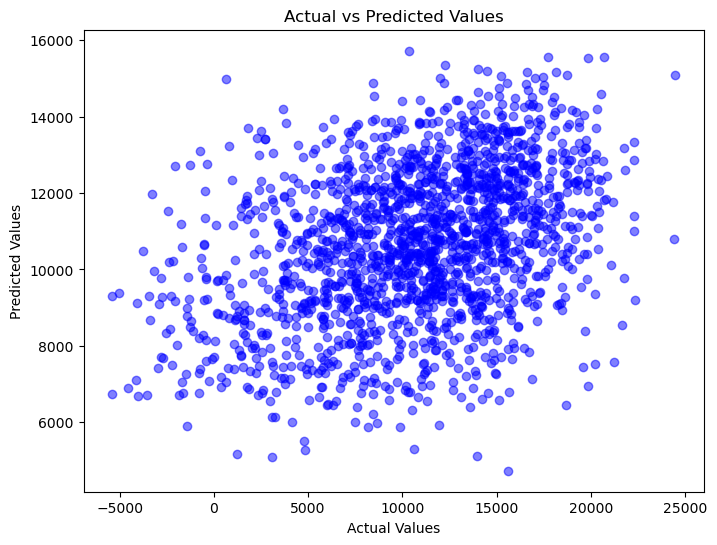

In [1532]:
# Predictions on the validation data
predicted_values = linear_model.predict(x_validate)

# Scatter plot for actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_validate, predicted_values, color='blue', alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

In this scatter plot, each point represents an actual vs predicted pair, allowing you to easily see how well the predictions align with the true values. Points close to the diagonal line (y = x) indicate accurate predictions, while deviations from the line indicate prediction errors. Clearly there aren't anu visible diagonal lines present, therefore showing a large amount of predictive errors. 

The Mean Squared Error (MSE) value of approximately 23,941,164.49 indicates that, on average, the predicted values from our multiple linear regression model differ from the actual values by this amount. A lower MSE is desirable, so this value suggests that the model may not be a very good fit for our data.

The R-squared (R2) score of approximately 0.15 means that the model explains only 15% of the variance in the target variable. In other words, our model does not fit the data very well, as it can only account for a small portion of the variance. Typically, a higher R2 score closer to 1 is desired for a better model fit.

In summary, based on the MSE and R2 score, our multiple linear regression model is not performing very well on our data. We may have to explore other modeling techniques and consider additional features, or perform further feature engineering to improve the model's performance.

RMSE value is approximately 4892.97. This means, on average, our predictions are off by around 4893 units. Lower RMSE values are desirable as they indicate a more accurate model.

##### *6.2.1.3 Saving the Model:*

Next, we will train the initial, more extensive training dataset, encompassing the validation set, in order to apply it to the test dataset.

In [1533]:
linear_model.fit(X_standardise, y_data)

LinearRegression()

Make predictions using the test dataset:

In [1534]:
predicted_y_test_linear = linear_model.predict(df_test_limited)

Saving the predictions as csv files:

In [1535]:
# Make Dataframe from predicted values
linear_pred_df = pd.DataFrame(predicted_y_test_linear, columns=['load_shortfall_3h'])

original_test_df = pd.read_csv("df_test.csv")

# Make Dataframe from corresponding dates
date_df_linear = pd.DataFrame({'time':original_test_df['time']})

# Join dataframes to create a single submission dataframe
submission_df_linear = date_df_linear.join(linear_pred_df)

#Save submission as csv
submission_df_linear.to_csv('Linear_Regression_Predictions', index=False)

submission_df_linear

,time,load_shortfall_3h
0,2018-01-01 00:00:00,6465.160970
1,2018-01-01 03:00:00,6576.592318
2,2018-01-01 06:00:00,6588.752205
3,2018-01-01 09:00:00,6921.220672
4,2018-01-01 12:00:00,7216.687873
...,...,...
2915,2018-12-31 09:00:00,9749.981525
2916,2018-12-31 12:00:00,11196.055089
2917,2018-12-31 15:00:00,12944.671697
2918,2018-12-31 18:00:00,13108.954533


Now that the model is saved, we can use the file to test the test dataset. 

##### **6.2.2. Ridge Regression:** 

Ridge regression is a regularization technique used in linear regression to prevent overfitting and improve the model's generalization on unseen data. It adds a penalty term to the standard linear regression objective function, discouraging large coefficients. This penalty term is controlled by a hyperparameter, usually denoted as alpha. Higher alpha values result in stronger regularization. By shrinking the coefficients, ridge regression reduces model complexity, making it less sensitive to noisy input features. This regularization technique helps mitigate multicollinearity, a common issue when predictors are highly correlated. In this approach, we balance the trade-off between fitting the training data well and keeping the model simple.

##### *6.2.2.1 Fitting the Model:*

Determine the best fit:

In [1536]:
# Define a range of alpha values to search
alphas = [0.1, 1, 10, 100]  # Add more values as needed

# Create a parameter grid
param_grid = {'alpha': alphas}

# Create Ridge regression model
ridge = Ridge()

# GridSearchCV to find the best alpha using cross-validation
grid_search = GridSearchCV(estimator=ridge, param_grid=param_grid, cv=5)  # 5-fold cross-validation

# Perform the grid search on your data
grid_search.fit(x_train, y_train)

# Best alpha found by cross-validation
best_alpha = grid_search.best_params_['alpha']

print("Best Alpha:", best_alpha)

Best Alpha: 1


We can fit our model now with the best alpha fit.

In [1537]:
# Create Ridge regression model with the best alpha value
ridge_best_alpha = Ridge(alpha=best_alpha)

# Train the model with the optimal alpha value
ridge_best_alpha.fit(x_train, y_train)

Ridge(alpha=1)

##### *6.2.2.2 Model Results:*

 We can now evaluate its performance on the validation set using various metrics: Root Mean Squared Error (RMSE), R-squared (R²), and Mean Absolute Error (MAE). These metrics provide insights into the model's accuracy and precision.

Test the model:

In [1538]:
predicted_y = ridge_best_alpha.predict(x_validate)

Root Mean Squared Error: 

In [1539]:
# Calculate RMSE
rmse_rr = metrics.mean_squared_error(y_validate, predicted_y, squared=False)

print("Root Mean Squared Error:", rmse_rr)

Root Mean Squared Error: 4913.077007754487


R-Squared:

In [1540]:
# Calculate R-squared
r_squared_rr = r2_score(y_validate, predicted_y)

print("R-squared:", r_squared_rr)

R-squared: 0.14290300174450943


Mean Absolute Error:

In [1541]:
# Calculate MAE
mae_rr = mean_absolute_error(y_validate, predicted_y)

print("Mean Absolute Error:", mae_rr)

Mean Absolute Error: 3920.171879413213


Let's visualize our results:

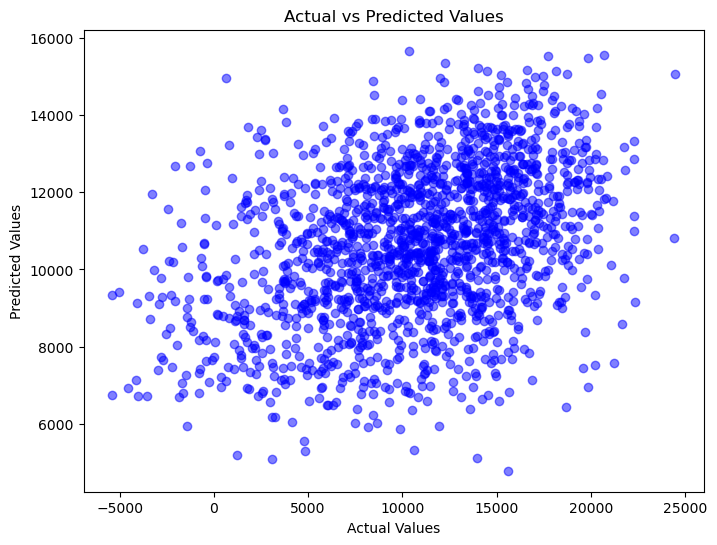

In [1542]:
# Predictions on the validation data
predicted_values = ridge_best_alpha.predict(x_validate)

# Scatter plot for actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_validate, predicted_values, color='blue', alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

In this scatter plot, each point represents an actual vs predicted pair, allowing you to easily see how well the predictions align with the true values. Points close to the diagonal line (y = x) indicate accurate predictions, while deviations from the line indicate prediction errors. Clearly there aren't anu visible diagonal lines present, therefore showing a large amount of predictive errors. 

In [1543]:
# Find the value for the model intercept
b0_ridge = float(ridge_best_alpha.intercept_)
print("Intercept:", float(b0_ridge))

# Extract model coefficient values
coeff = pd.DataFrame(ridge_best_alpha.coef_.reshape(-1,1), X_standardise.columns, columns=['Coefficient'])
coeff.reindex(coeff.Coefficient.abs().sort_values(ascending=False).index)

Intercept: 6705.847601210482


,Coefficient
Seville_temp,-5009.257603
Barcelona_temp,4862.957194
month,2331.418072
Valencia_humidity,2302.522937
Valencia_pressure,2290.001256
Seville_humidity,-2222.788266
Valencia_temp,1920.794319
hourofday,1674.990280
day,1570.108601
Valencia_wind_deg,-1496.183370


In this analysis, a Ridge regression model was employed to predict the `load_shortfall_3h` variable based on various predictor features. The model's performance metrics were assessed on a validation dataset. The results indicate a Root Mean Squared Error (RMSE) of approximately 4892, reflecting the average prediction error in the load shortfall prediction. The R-squared value, a measure of how well the model explains the variance in the data, is approximately 0.150, indicating that about 15% of the variance in the load shortfall can be explained by the predictor variables. Additionally, the Mean Absolute Error (MAE) is around 3894, representing the average absolute prediction error. These metrics collectively suggest that while the model provides some predictive capability, there is room for improvement. Further refinements, such as feature engineering or exploring different algorithms, could enhance the model's accuracy and utility in load shortfall predictions.

##### *6.2.2.3 Saving the Model:*

Next, we will train the initial, more extensive training dataset, encompassing the validation set, in order to apply it to the test dataset.

In [1544]:
ridge_best_alpha.fit(X_standardise, y_data)

Ridge(alpha=1)

Make predictions using the test dataset:

In [1545]:
predicted_y_test = ridge_best_alpha.predict(df_test_limited)

Saving the predictions as csv files:

In [1546]:
# Make Dataframe from predicted values
ridge_pred_df = pd.DataFrame(predicted_y_test, columns=['load_shortfall_3h'])

original_test_df = pd.read_csv("df_test.csv")

# Make Dataframe from corresponding dates
date_df = pd.DataFrame({'time':original_test_df['time']})

# Join dataframes to create a single submission dataframe
submission_df = date_df.join(ridge_pred_df)

#Save submission as csv
submission_df.to_csv('Ridge_Regression_Predictions', index=False)

submission_df

,time,load_shortfall_3h
0,2018-01-01 00:00:00,6460.232494
1,2018-01-01 03:00:00,6572.819322
2,2018-01-01 06:00:00,6587.140446
3,2018-01-01 09:00:00,6920.102175
4,2018-01-01 12:00:00,7205.404237
...,...,...
2915,2018-12-31 09:00:00,9756.270432
2916,2018-12-31 12:00:00,11186.023185
2917,2018-12-31 15:00:00,12927.788540
2918,2018-12-31 18:00:00,13099.007569


Now that the model is saved, we can use the file to test the test dataset. 

##### **6.2.3. LASSO Regression:** 

##### *6.2.3.1 Fitting the Model:*

We can fit our model now with the best alpha fit:

In [1547]:
# Create LASSO model object, setting alpha to 0.01
lasso = Lasso(alpha=0.01)

In [1548]:
# Train the LASSO model
lasso.fit(x_train, y_train)

Lasso(alpha=0.01)

##### *6.2.3.2 Model Results:*

Test the model:

In [1549]:
predicted_y_lasso = lasso.predict(x_validate)

Root Mean Squared Error:

In [1550]:
# Calculate RMSE
rmse_lasso = metrics.mean_squared_error(y_validate, predicted_y_lasso, squared=False)

print("Root Mean Squared Error:", rmse_lasso)

Root Mean Squared Error: 4912.298732118394


R-Squared:

In [1551]:
# Calculate R-squared
r_squared_lasso = r2_score(y_validate, predicted_y_lasso)

print("R-squared:", r_squared_lasso)

R-squared: 0.1431745240009219


Mean Absolute Error:

In [1552]:
# Calculate MAE
mae_lasso = mean_absolute_error(y_validate, predicted_y_lasso)

print("Mean Absolute Error:", mae_lasso)

Mean Absolute Error: 3918.7961505633048


Let's visualize our results:

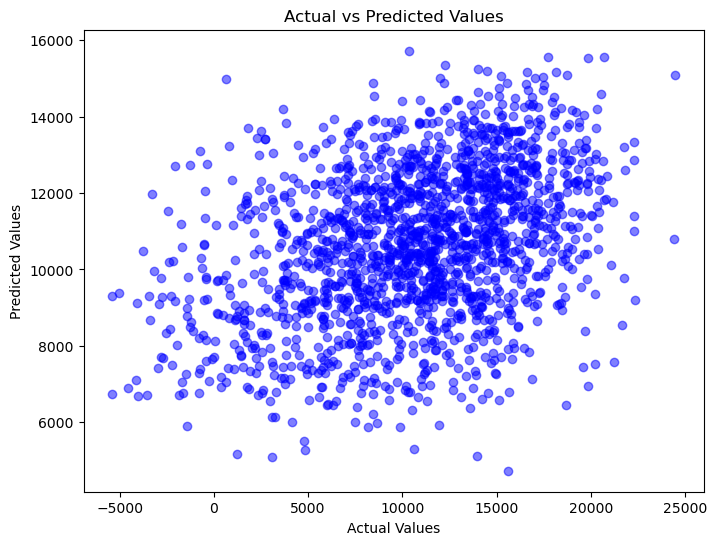

In [1553]:
# Predictions on the validation data
predicted_values = lasso.predict(x_validate)

# Scatter plot for actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_validate, predicted_values, color='blue', alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

In this scatter plot, each point represents an actual vs predicted pair, allowing you to easily see how well the predictions align with the true values. Points close to the diagonal line (y = x) indicate accurate predictions, while deviations from the line indicate prediction errors. Clearly there aren't anu visible diagonal lines present, therefore showing a large amount of predictive errors. 

In [1554]:
# Find the value for the model intercept
b0_ridge = float(lasso.intercept_)
print("Intercept:", float(b0_ridge))

# Extract model coefficient values
coeff = pd.DataFrame(lasso.coef_.reshape(-1,1), X_standardise.columns, columns=['Coefficient'])
coeff.reindex(coeff.Coefficient.abs().sort_values(ascending=False).index)

Intercept: 6725.3874331440475


,Coefficient
Seville_temp,-5270.767748
Barcelona_temp,4990.575077
Valencia_humidity,2335.664317
month,2330.907180
Valencia_pressure,2320.193986
Seville_humidity,-2292.549750
Valencia_temp,2019.874744
hourofday,1686.150450
day,1571.486641
Valencia_wind_deg,-1497.167463



In this analysis, a Lasso Regression model was utilized to predict the `load_shortfall_3h` variable, incorporating a diverse set of predictor features. The model's performance was rigorously evaluated on a validation dataset. The outcomes illustrate a Root Mean Squared Error (RMSE) of approximately 4894, signifying the average prediction error in the load shortfall estimation. The R-squared value, a measure of the model's ability to elucidate the variance in the data, stands at approximately 0.150. This value implies that roughly 15% of the variability in the load shortfall can be clarified by the chosen predictor variables. Furthermore, the Mean Absolute Error (MAE) approximates 3895, indicating the average absolute prediction error. These metrics collectively indicate that the Lasso Regression model offers a limited predictive capability. Although the model captures certain patterns within the data, there remains significant room for improvement.

##### *6.2.1.3 Saving the Model:*

Next, we will train the initial, more extensive training dataset, encompassing the validation set, in order to apply it to the test dataset.

In [1555]:
lasso.fit(X_standardise, y_data)

Lasso(alpha=0.01)

Make predictions using the test dataset:

In [1556]:
predicted_y_test_lasso = lasso.predict(df_test_limited)

Saving the predictions as csv files:

In [1557]:
# Make Dataframe from predicted values
lasso_pred_df = pd.DataFrame(predicted_y_test_lasso, columns=['load_shortfall_3h'])

original_test_df = pd.read_csv("df_test.csv")

# Make Dataframe from corresponding dates
date_df = pd.DataFrame({'time':original_test_df['time']})

# Join dataframes to create a single submission dataframe
submission_df_lasso = date_df.join(lasso_pred_df)

#Save submission as csv
submission_df_lasso.to_csv('LASSO_Regression_Predictions', index=False)

submission_df_lasso

,time,load_shortfall_3h
0,2018-01-01 00:00:00,6465.448786
1,2018-01-01 03:00:00,6576.804967
2,2018-01-01 06:00:00,6589.136701
3,2018-01-01 09:00:00,6921.607095
4,2018-01-01 12:00:00,7216.863031
...,...,...
2915,2018-12-31 09:00:00,9750.077534
2916,2018-12-31 12:00:00,11195.806401
2917,2018-12-31 15:00:00,12944.210893
2918,2018-12-31 18:00:00,13108.673658


Now that the model is saved, we can use the file to test the test dataset. 

##### **6.2.4 Desicion Tree:** 

A Decision Tree is a popular supervised machine learning algorithm used for both regression and classification tasks. It works for both categorical and continuous input and output variables. The Decision Tree algorithm recursively splits the dataset into subsets, based on the most significant attribute at each node. This process is repeated until the data at each node is homogeneous with respect to the target variable, or a predefined stopping criterion is met.

Here are the key components of a Decision Tree:
- **Root Node:** The topmost node in the tree, representing the entire dataset. It is divided into two or more homogeneous sets.
- **Internal Nodes:** These nodes split the dataset into subgroups.
- **Leaf Nodes:** The terminal nodes that predict the outcome. They do not split further.
- **Branches:** The paths connecting nodes.

<img src="https://github.com/Explore-AI/Pictures/blob/master/decision_tree_path.png?raw=true" alt="Decision Tree Diagram" align="left" width=50%/> 


##### *6.2.4.1 Fitting the Model:*

Create the model:

In [1558]:
regr_tree = DecisionTreeRegressor(max_depth=8, random_state=RAND_STATE)

Fit the model:

In [1559]:
regr_tree.fit(x_train, y_train)

DecisionTreeRegressor(max_depth=8, random_state=42)

##### *6.2.4.2 Model Results:*

 We can now evaluate its performance on the validation set using various metrics: Root Mean Squared Error (RMSE), R-squared (R²), and Mean Absolute Error (MAE). These metrics provide insights into the model's accuracy and precision.

Test the model:

In [1560]:
predicted_y_tree = regr_tree.predict(x_validate)

Root Mean Squared Error:

In [1561]:
# Calculate RMSE
rmse_dt = metrics.mean_squared_error(y_validate, predicted_y_tree, squared=False)

print("Root Mean Squared Error:", rmse_dt)

Root Mean Squared Error: 3989.572079789285


R-Squared:

In [1562]:
# Calculate R-squared
r_squared_dt = r2_score(y_validate, predicted_y_tree)

print("R-squared:", r_squared_dt)

R-squared: 0.43483473378584403


Mean Absolute Error:

In [1563]:
# Calculate MAE
mae_dt = mean_absolute_error(y_validate, predicted_y_tree)

print("Mean Absolute Error:", mae_dt)

Mean Absolute Error: 3107.2498830038207


Let's visualize our results:

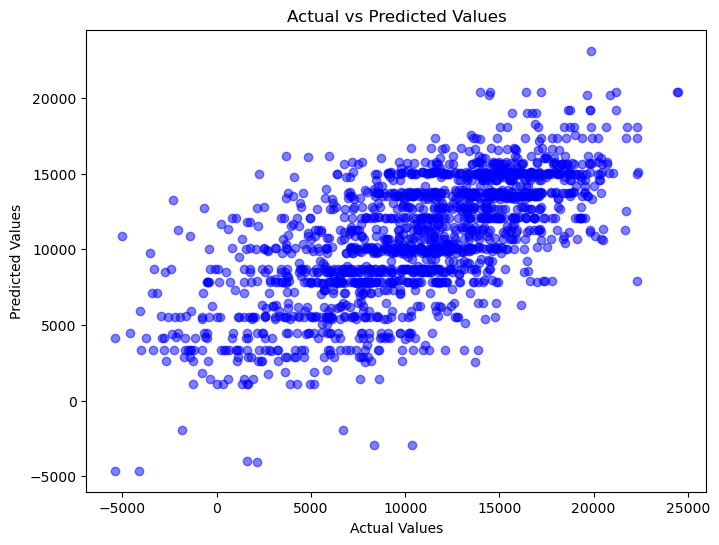

In [1564]:
# Predictions on the validation data
predicted_values = regr_tree.predict(x_validate)

# Scatter plot for actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_validate, predicted_values, color='blue', alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

In this scatter plot, each point represents an actual vs predicted pair, allowing you to easily see how well the predictions align with the true values. Points close to the diagonal line (y = x) indicate accurate predictions, while deviations from the line indicate prediction errors. We can definetely see some diagonal lines present in the graph. However, even though there are predictive errors, there is still room for improvement.

In this analysis, a Decision Tree regression model was implemented to forecast the `load_shortfall_3h` variable, utilizing a range of predictor features. The model's performance was evaluated on a validation dataset. The results demonstrate a Root Mean Squared Error (RMSE) of approximately 3973, signifying the average prediction error in the load shortfall estimation. The R-squared value, an indicator of the model's ability to explain the variance in the data, stands at approximately 0.440. This value implies that around 44% of the variability in the load shortfall can be elucidated by the predictor variables. Furthermore, the Mean Absolute Error (MAE) is approximately 3112, representing the average absolute prediction error. These metrics collectively suggest that the Decision Tree regression model exhibits a reasonable predictive capability. However, there is still room for enhancement.

##### *6.2.4.3 Saving the Model:*

Train model on the complete training dataset:

In [1565]:
regr_tree.fit(X_standardise, y_data)

DecisionTreeRegressor(max_depth=8, random_state=42)

Make predictions using the test dataset:

In [1566]:
predicted_y_test_tree = regr_tree.predict(df_test_limited)

In [1567]:
# Make Dataframe from predicted values
tree_pred_df = pd.DataFrame(predicted_y_test_tree, columns=['load_shortfall_3h'])

original_test_df = pd.read_csv("df_test.csv")

# Make Dataframe from corresponding dates
date_df_tree = pd.DataFrame({'time':original_test_df['time']})

# Join dataframes to create a single submission dataframe
submission_df_tree = date_df_tree.join(tree_pred_df)

#Save submission as csv
submission_df_tree.to_csv('Decision_Tree_Predictions', index=False)

submission_df_tree

,time,load_shortfall_3h
0,2018-01-01 00:00:00,6936.462963
1,2018-01-01 03:00:00,6936.462963
2,2018-01-01 06:00:00,6936.462963
3,2018-01-01 09:00:00,6936.462963
4,2018-01-01 12:00:00,6936.462963
...,...,...
2915,2018-12-31 09:00:00,11499.210191
2916,2018-12-31 12:00:00,6652.222222
2917,2018-12-31 15:00:00,11073.598485
2918,2018-12-31 18:00:00,13047.965414


Now that the model is saved, we can use the file to test the test dataset. 

##### **6.2.5. Voting Ensemble Regression:**  

##### *6.2.5.1 Fitting the Model:*

Define the models which we'll include in our ensemble and create the model:

In [1568]:
# We pass a list of tuples, which each have a string identifier for the
# model (arbitrary choice), along the actual instantiated sklearn model.  
models = [("BR",bag_reg),("XG",xgboost),("CB",catboost)]

# Specify weights for weighted model averaging
model_weightings = np.array([0.5,0.2,0.3])
v_reg = VotingRegressor(estimators=models,weights=model_weightings)

Fit the model:

In [1569]:
v_reg.fit(x_train,y_train)

Learning rate set to 0.055693
0:	learn: 5158.4122578	total: 25.9ms	remaining: 25.9s
1:	learn: 5084.9719436	total: 33.8ms	remaining: 16.9s
2:	learn: 5014.1116652	total: 40.4ms	remaining: 13.4s
3:	learn: 4940.0163315	total: 47.8ms	remaining: 11.9s
4:	learn: 4870.8887985	total: 55.8ms	remaining: 11.1s
5:	learn: 4817.7560309	total: 63.3ms	remaining: 10.5s
6:	learn: 4754.1665399	total: 71.2ms	remaining: 10.1s
7:	learn: 4704.9106788	total: 84.6ms	remaining: 10.5s
8:	learn: 4645.7258427	total: 91.9ms	remaining: 10.1s
9:	learn: 4598.5335851	total: 99.3ms	remaining: 9.83s
10:	learn: 4566.5756412	total: 109ms	remaining: 9.76s
11:	learn: 4532.1477108	total: 119ms	remaining: 9.8s
12:	learn: 4501.6621358	total: 133ms	remaining: 10.1s
13:	learn: 4468.9999065	total: 146ms	remaining: 10.3s
14:	learn: 4442.2004616	total: 154ms	remaining: 10.1s
15:	learn: 4416.1772542	total: 163ms	remaining: 10s
16:	learn: 4376.7155951	total: 173ms	remaining: 10s
17:	learn: 4352.4829541	total: 180ms	remaining: 9.81s
18:

914:	learn: 1713.4989145	total: 9.12s	remaining: 847ms
915:	learn: 1712.0909748	total: 9.13s	remaining: 837ms
916:	learn: 1710.9710148	total: 9.14s	remaining: 827ms
917:	learn: 1709.9120255	total: 9.15s	remaining: 817ms
918:	learn: 1708.6997002	total: 9.15s	remaining: 807ms
919:	learn: 1707.8678822	total: 9.16s	remaining: 797ms
920:	learn: 1706.7331673	total: 9.17s	remaining: 786ms
921:	learn: 1705.7113718	total: 9.18s	remaining: 776ms
922:	learn: 1704.8107728	total: 9.18s	remaining: 766ms
923:	learn: 1702.8347129	total: 9.19s	remaining: 756ms
924:	learn: 1701.3079177	total: 9.2s	remaining: 746ms
925:	learn: 1700.5636019	total: 9.21s	remaining: 736ms
926:	learn: 1698.8476811	total: 9.21s	remaining: 726ms
927:	learn: 1697.4251774	total: 9.22s	remaining: 716ms
928:	learn: 1695.9861069	total: 9.24s	remaining: 706ms
929:	learn: 1694.9669863	total: 9.25s	remaining: 696ms
930:	learn: 1694.1781373	total: 9.26s	remaining: 686ms
931:	learn: 1693.2957766	total: 9.27s	remaining: 676ms
932:	learn:

VotingRegressor(estimators=[('BR',
                             BaggingRegressor(base_estimator=<catboost.core.CatBoostRegressor object at 0x0000028A87090C70>)),
                            ('XG',
                             XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_typ...
                                          learning_rate=0.1, max_bin=None,
                                          max_cat_threshold=None,
                                          max_cat_to_onehot=None,
                                          m

##### *6.2.5.2 Model Results:*

Test model:

In [1570]:
y_pred_ve = v_reg.predict(x_validate)

Roor Mean Square:

In [1571]:
# Calculate RMSE
rmse_ve = metrics.mean_squared_error(y_validate, y_pred_ve, squared=False)

print("Root Mean Squared Error:", rmse_ve)

Root Mean Squared Error: 3181.932973901099


R-Squared:

In [1572]:
# Calculate R-squared
r_squared_ve = r2_score(y_validate, y_pred_ve)

print("R-squared:", r_squared_ve)

R-squared: 0.6404950406859022


Mean Absolute Error:

In [1573]:
# Calculate MAE
mae_ve = mean_absolute_error(y_validate, y_pred_ve)

print("Mean Absolute Error:", mae_ve)

Mean Absolute Error: 2510.072774568804


Let's visualize our results:

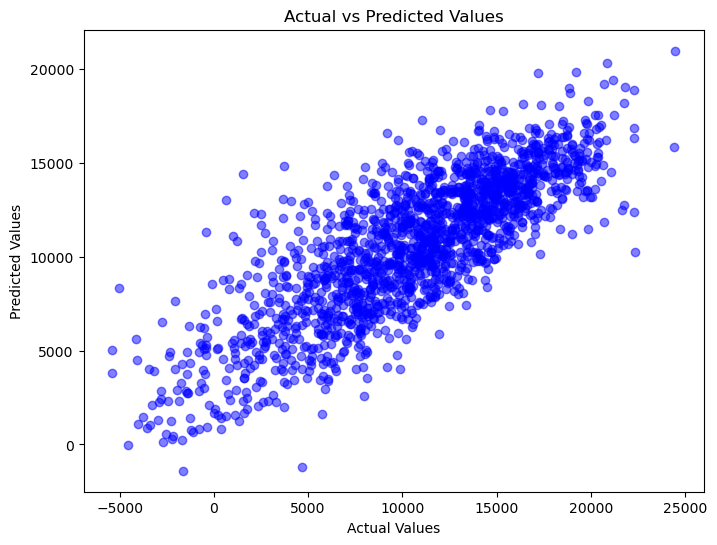

In [1574]:
# Predictions on the validation data
predicted_values = v_reg.predict(x_validate)

# Scatter plot for actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_validate, predicted_values, color='blue', alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

##### *6.2.5.3 Saving the Model:*

Train model on the complete training dataset:

In [1575]:
v_reg.fit(X_standardise,y_data)

Learning rate set to 0.057692
0:	learn: 5156.5013639	total: 18.7ms	remaining: 18.6s
1:	learn: 5070.1425827	total: 27ms	remaining: 13.5s
2:	learn: 4991.1551643	total: 37.7ms	remaining: 12.5s
3:	learn: 4910.4860185	total: 62.5ms	remaining: 15.6s
4:	learn: 4848.5823683	total: 76.8ms	remaining: 15.3s
5:	learn: 4800.4007318	total: 84.5ms	remaining: 14s
6:	learn: 4745.1945005	total: 94.7ms	remaining: 13.4s
7:	learn: 4687.9612711	total: 106ms	remaining: 13.1s
8:	learn: 4640.7296509	total: 118ms	remaining: 13s
9:	learn: 4594.7416099	total: 128ms	remaining: 12.6s
10:	learn: 4559.2624454	total: 136ms	remaining: 12.2s
11:	learn: 4522.2334048	total: 144ms	remaining: 11.9s
12:	learn: 4485.5921931	total: 152ms	remaining: 11.6s
13:	learn: 4457.2209128	total: 161ms	remaining: 11.3s
14:	learn: 4422.7891871	total: 170ms	remaining: 11.1s
15:	learn: 4399.5168535	total: 178ms	remaining: 10.9s
16:	learn: 4368.2743915	total: 186ms	remaining: 10.7s
17:	learn: 4336.5622159	total: 193ms	remaining: 10.5s
18:	lea

385:	learn: 2547.8263063	total: 3.52s	remaining: 5.59s
386:	learn: 2546.2066209	total: 3.52s	remaining: 5.58s
387:	learn: 2543.7871402	total: 3.53s	remaining: 5.57s
388:	learn: 2541.9089685	total: 3.54s	remaining: 5.56s
389:	learn: 2539.2243795	total: 3.55s	remaining: 5.55s
390:	learn: 2536.6086259	total: 3.56s	remaining: 5.54s
391:	learn: 2533.8463746	total: 3.58s	remaining: 5.56s
392:	learn: 2532.7372102	total: 3.6s	remaining: 5.56s
393:	learn: 2530.9271330	total: 3.62s	remaining: 5.56s
394:	learn: 2528.1891088	total: 3.63s	remaining: 5.56s
395:	learn: 2525.8572929	total: 3.65s	remaining: 5.56s
396:	learn: 2523.9453738	total: 3.65s	remaining: 5.55s
397:	learn: 2523.0582229	total: 3.68s	remaining: 5.56s
398:	learn: 2521.2901004	total: 3.69s	remaining: 5.56s
399:	learn: 2519.3371754	total: 3.7s	remaining: 5.55s
400:	learn: 2517.2024438	total: 3.7s	remaining: 5.53s
401:	learn: 2514.8262227	total: 3.71s	remaining: 5.52s
402:	learn: 2513.2306592	total: 3.72s	remaining: 5.51s
403:	learn: 2

VotingRegressor(estimators=[('BR',
                             BaggingRegressor(base_estimator=<catboost.core.CatBoostRegressor object at 0x0000028A87090C70>)),
                            ('XG',
                             XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_typ...
                                          learning_rate=0.1, max_bin=None,
                                          max_cat_threshold=None,
                                          max_cat_to_onehot=None,
                                          m

Make predictions using the test dataset:

In [1576]:
predicted_y_test_ve = v_reg.predict(df_test_limited)

In [1577]:
# Make Dataframe from predicted values
ve_pred_df = pd.DataFrame(predicted_y_test_ve, columns=['load_shortfall_3h'])

original_test_df = pd.read_csv("df_test.csv")

# Make Dataframe from corresponding dates
date_df_ve = pd.DataFrame({'time':original_test_df['time']})

# Join dataframes to create a single submission dataframe
submission_df_ve = date_df_ve.join(ve_pred_df)

#Save submission as csv
submission_df_ve.to_csv('Voting_Ensemble_Predictions', index=False)

submission_df_ve

,time,load_shortfall_3h
0,2018-01-01 00:00:00,7511.268113
1,2018-01-01 03:00:00,3563.906000
2,2018-01-01 06:00:00,2897.283476
3,2018-01-01 09:00:00,5496.157586
4,2018-01-01 12:00:00,6341.764496
...,...,...
2915,2018-12-31 09:00:00,8718.446384
2916,2018-12-31 12:00:00,8701.390933
2917,2018-12-31 15:00:00,9962.425516
2918,2018-12-31 18:00:00,10338.929810


##### **6.2.6. Stacking Ensemble Regression:** 

##### *6.2.6.1 Fitting the Model:*

Create the model:

In [1578]:
bag_reg = BaggingRegressor(base_estimator = catboost)

Fit the model:

In [1579]:
bag_reg.fit(x_train,y_train)

Learning rate set to 0.055693
0:	learn: 5153.5929168	total: 13.5ms	remaining: 13.5s
1:	learn: 5079.8981743	total: 21.1ms	remaining: 10.5s
2:	learn: 5006.6651630	total: 29.5ms	remaining: 9.79s
3:	learn: 4929.0868640	total: 36.9ms	remaining: 9.19s
4:	learn: 4859.8283270	total: 45.6ms	remaining: 9.07s
5:	learn: 4804.5244584	total: 52.9ms	remaining: 8.76s
6:	learn: 4760.5967048	total: 61.2ms	remaining: 8.69s
7:	learn: 4702.9449645	total: 68.7ms	remaining: 8.52s
8:	learn: 4651.7047728	total: 78.1ms	remaining: 8.6s
9:	learn: 4606.6635174	total: 85.7ms	remaining: 8.48s
10:	learn: 4561.9012186	total: 96.9ms	remaining: 8.71s
11:	learn: 4513.8012141	total: 105ms	remaining: 8.64s
12:	learn: 4478.3276616	total: 114ms	remaining: 8.66s
13:	learn: 4450.2446879	total: 121ms	remaining: 8.51s
14:	learn: 4425.3954503	total: 130ms	remaining: 8.53s
15:	learn: 4405.1394981	total: 137ms	remaining: 8.39s
16:	learn: 4372.5086984	total: 145ms	remaining: 8.36s
17:	learn: 4344.9029995	total: 151ms	remaining: 8.26

282:	learn: 2775.0042416	total: 2.77s	remaining: 7.01s
283:	learn: 2770.9799524	total: 2.77s	remaining: 6.99s
284:	learn: 2767.8928469	total: 2.78s	remaining: 6.98s
285:	learn: 2765.9966369	total: 2.79s	remaining: 6.96s
286:	learn: 2761.9409830	total: 2.8s	remaining: 6.95s
287:	learn: 2758.9030567	total: 2.8s	remaining: 6.93s
288:	learn: 2754.8299453	total: 2.81s	remaining: 6.93s
289:	learn: 2751.7694772	total: 2.82s	remaining: 6.91s
290:	learn: 2748.3969226	total: 2.83s	remaining: 6.9s
291:	learn: 2744.6638033	total: 2.84s	remaining: 6.88s
292:	learn: 2742.4040634	total: 2.85s	remaining: 6.87s
293:	learn: 2740.0787256	total: 2.85s	remaining: 6.86s
294:	learn: 2738.5765183	total: 2.86s	remaining: 6.84s
295:	learn: 2735.7645101	total: 2.88s	remaining: 6.85s
296:	learn: 2733.5340524	total: 2.9s	remaining: 6.86s
297:	learn: 2730.6077617	total: 2.91s	remaining: 6.87s
298:	learn: 2728.2155885	total: 2.93s	remaining: 6.86s
299:	learn: 2725.0112931	total: 2.94s	remaining: 6.86s
300:	learn: 27

BaggingRegressor(base_estimator=<catboost.core.CatBoostRegressor object at 0x0000028AD6A58100>)

**In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook.
On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org.**

##### *6.2.6.2 Model Results:*

Test the model:

In [1580]:
y_pred_bag = bag_reg.predict(x_validate)

Root Mean Squared Error:

In [1581]:
# Calculate RMSE
rmse_bag = metrics.mean_squared_error(y_validate, y_pred_bag, squared=False)

print("Root Mean Squared Error:", rmse_bag)

Root Mean Squared Error: 3164.136081110451


R-Squared:

In [1582]:
# Calculate R-squared
r_squared_bag = r2_score(y_validate, y_pred_bag)

print("R-squared:", r_squared_bag)

R-squared: 0.6445052940264244


Mean Absolute Error:

In [1583]:
# Calculate MAE
mae_bag = mean_absolute_error(y_validate, y_pred_bag)

print("Mean Absolute Error:", mae_bag)

Mean Absolute Error: 2486.2657014061947


Let's visualize our results:

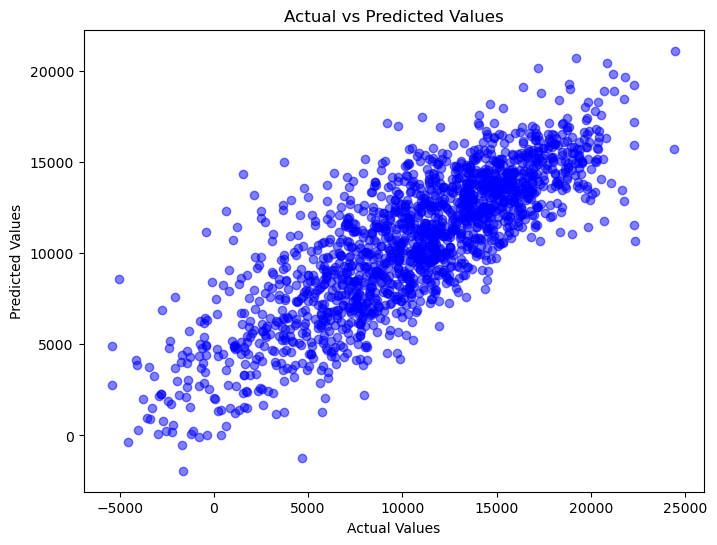

In [1584]:
# Predictions on the validation data
predicted_values = bag_reg.predict(x_validate)

# Scatter plot for actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_validate, predicted_values, color='blue', alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

##### *6.2.6.3 Saving the Model:*

Train model on the complete training dataset:

In [1585]:
bag_reg.fit(X_standardise, y_data)

Learning rate set to 0.057692
0:	learn: 5075.1495972	total: 8.54ms	remaining: 8.53s
1:	learn: 4995.7188768	total: 17.8ms	remaining: 8.89s
2:	learn: 4929.9483584	total: 27.6ms	remaining: 9.17s
3:	learn: 4865.8307903	total: 36.3ms	remaining: 9.03s
4:	learn: 4801.6398984	total: 43.9ms	remaining: 8.74s
5:	learn: 4749.0820946	total: 52.9ms	remaining: 8.77s
6:	learn: 4697.7619870	total: 60.3ms	remaining: 8.55s
7:	learn: 4639.3449919	total: 69ms	remaining: 8.56s
8:	learn: 4593.2128759	total: 77.1ms	remaining: 8.49s
9:	learn: 4551.9080737	total: 90.1ms	remaining: 8.91s
10:	learn: 4512.8369718	total: 101ms	remaining: 9.12s
11:	learn: 4479.0891852	total: 113ms	remaining: 9.31s
12:	learn: 4440.6521044	total: 123ms	remaining: 9.3s
13:	learn: 4411.1399187	total: 131ms	remaining: 9.2s
14:	learn: 4378.7098963	total: 139ms	remaining: 9.14s
15:	learn: 4354.7282781	total: 149ms	remaining: 9.14s
16:	learn: 4325.1081640	total: 159ms	remaining: 9.18s
17:	learn: 4301.9027435	total: 166ms	remaining: 9.06s
18

368:	learn: 2581.9113300	total: 3.54s	remaining: 6.06s
369:	learn: 2578.6953360	total: 3.55s	remaining: 6.04s
370:	learn: 2575.9522230	total: 3.56s	remaining: 6.03s
371:	learn: 2574.2677712	total: 3.57s	remaining: 6.02s
372:	learn: 2571.7262863	total: 3.57s	remaining: 6.01s
373:	learn: 2569.7828917	total: 3.58s	remaining: 6s
374:	learn: 2567.3521329	total: 3.59s	remaining: 5.99s
375:	learn: 2564.5376078	total: 3.6s	remaining: 5.97s
376:	learn: 2561.8124416	total: 3.61s	remaining: 5.96s
377:	learn: 2560.1829143	total: 3.62s	remaining: 5.95s
378:	learn: 2557.5951985	total: 3.62s	remaining: 5.94s
379:	learn: 2555.3665974	total: 3.64s	remaining: 5.94s
380:	learn: 2553.3454148	total: 3.66s	remaining: 5.95s
381:	learn: 2550.8914860	total: 3.68s	remaining: 5.96s
382:	learn: 2549.2984928	total: 3.7s	remaining: 5.96s
383:	learn: 2547.9425353	total: 3.71s	remaining: 5.95s
384:	learn: 2546.3785467	total: 3.72s	remaining: 5.94s
385:	learn: 2543.5055396	total: 3.74s	remaining: 5.95s
386:	learn: 254

BaggingRegressor(base_estimator=<catboost.core.CatBoostRegressor object at 0x0000028AD6A58100>)

Make predictions using the test dataset:

In [1586]:
predicted_y_test_bag = stacked_model.predict(df_test_limited)

In [1587]:
# Make Dataframe from predicted values
bag_pred_df = pd.DataFrame(predicted_y_test_bag, columns=['load_shortfall_3h'])

original_test_df = pd.read_csv("df_test.csv")

# Make Dataframe from corresponding dates
date_df_bag = pd.DataFrame({'time':original_test_df['time']})

# Join dataframes to create a single submission dataframe
submission_df_bag = date_df_bag.join(bag_pred_df)

#Save submission as csv
submission_df_bag.to_csv('Bagging_Predictions', index=False)

submission_df_bag

,time,load_shortfall_3h
0,2018-01-01 00:00:00,6530.056989
1,2018-01-01 03:00:00,4310.156637
2,2018-01-01 06:00:00,5400.601324
3,2018-01-01 09:00:00,6970.044918
4,2018-01-01 12:00:00,9197.900084
...,...,...
2915,2018-12-31 09:00:00,7481.355279
2916,2018-12-31 12:00:00,8258.704019
2917,2018-12-31 15:00:00,8889.108345
2918,2018-12-31 18:00:00,9561.187872


##### **6.2.7. Random Forest Regression:** 

##### *6.2.7.1 Fitting the Model:*

Create the model:

In [1588]:
model_rf = RandomForestRegressor(n_estimators=100, random_state=42)  

Fit the model:

In [1589]:
model_rf.fit(x_train, y_train)

RandomForestRegressor(random_state=42)

**In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook.
On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org.**

##### *6.2.7.2 Model Results:*

Test the model:

In [1590]:
y_pred_rf = model_rf.predict(x_validate)

Root Mean Squared Error:

In [1591]:
# Calculate RMSE
rmse_rf = metrics.mean_squared_error(y_validate, y_pred_rf, squared=False)

print("Root Mean Squared Error:", rmse_rf)

Root Mean Squared Error: 3257.4799186659743


R-Squared:

In [1592]:
# Calculate R-squared
r_squared_rf = r2_score(y_validate, y_pred_rf)

print("R-squared:", r_squared_rf)

R-squared: 0.6232213153514446


Mean Absolute Error:

In [1593]:
# Calculate MAE
mae_rf = mean_absolute_error(y_validate, y_pred_rf)

print("Mean Absolute Error:", mae_rf)

Mean Absolute Error: 2550.128610477278


Let's visualize our results:

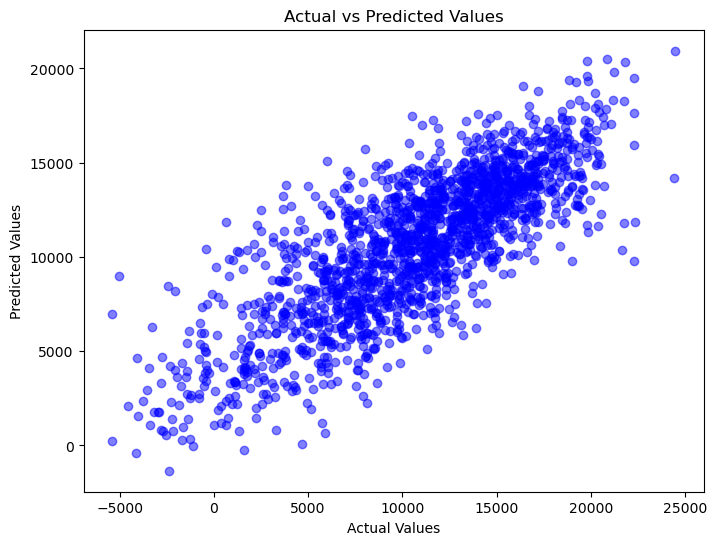

In [1594]:
# Predictions on the validation data
predicted_values = model_rf.predict(x_validate)

# Scatter plot for actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_validate, predicted_values, color='blue', alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

##### *6.2.7.3 Saving the Model:*

Train model on the complete training dataset:

In [1595]:
model_rf.fit(X_standardise, y_data)

RandomForestRegressor(random_state=42)

Make predictions using the test dataset:

In [1596]:
predicted_y_test_rf = model_rf.predict(df_test_limited)

In [1597]:
# Make Dataframe from predicted values
rf_pred_df = pd.DataFrame(predicted_y_test_rf, columns=['load_shortfall_3h'])

original_test_df = pd.read_csv("df_test.csv")

# Make Dataframe from corresponding dates
date_df_rf = pd.DataFrame({'time':original_test_df['time']})

# Join dataframes to create a single submission dataframe
submission_df_rf = date_df_rf.join(rf_pred_df)

#Save submission as csv
submission_df_rf.to_csv('Random_Forest_Predictions', index=False)

submission_df_rf

,time,load_shortfall_3h
0,2018-01-01 00:00:00,6456.466667
1,2018-01-01 03:00:00,6263.733333
2,2018-01-01 06:00:00,5723.136667
3,2018-01-01 09:00:00,6333.716667
4,2018-01-01 12:00:00,4391.453333
...,...,...
2915,2018-12-31 09:00:00,9954.903333
2916,2018-12-31 12:00:00,7624.383333
2917,2018-12-31 15:00:00,13756.426667
2918,2018-12-31 18:00:00,12444.183333


##### **6.2.8. XGBoost:** 

##### *6.2.8.1 Fitting the Model:*

Create the model:

In [1598]:
# Define your XGBoost model for regression
xgboost = xgb.XGBRegressor(objective='reg:squarederror', max_depth=3, learning_rate=0.1, n_estimators=100)

Fit the model:

In [1599]:
# Fit the model to your training data
xgboost.fit(x_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

##### *6.2.8.2 Model Results:*

Test the model:

In [1600]:
# Make predictions
xgb_pred = xgboost.predict(x_validate)

Root Mean Squared Error:

In [1601]:
# Calculate RMSE
rmse_xgb = metrics.mean_squared_error(y_validate, xgb_pred, squared=False)

print("Root Mean Squared Error:", rmse_xgb)

Root Mean Squared Error: 3708.18339496474


R-Squared:

In [1602]:
# Calculate R-squared
r_squared_xgb = r2_score(y_validate, xgb_pred)

print("R-squared:", r_squared_xgb)

R-squared: 0.5117466394936174


Mean Absolute Error:

In [1603]:
# Calculate MAE
mae_xgb = mean_absolute_error(y_validate, xgb_pred)

print("Mean Absolute Error:", mae_xgb)

Mean Absolute Error: 2965.9989684968655


Let's visualize our results:

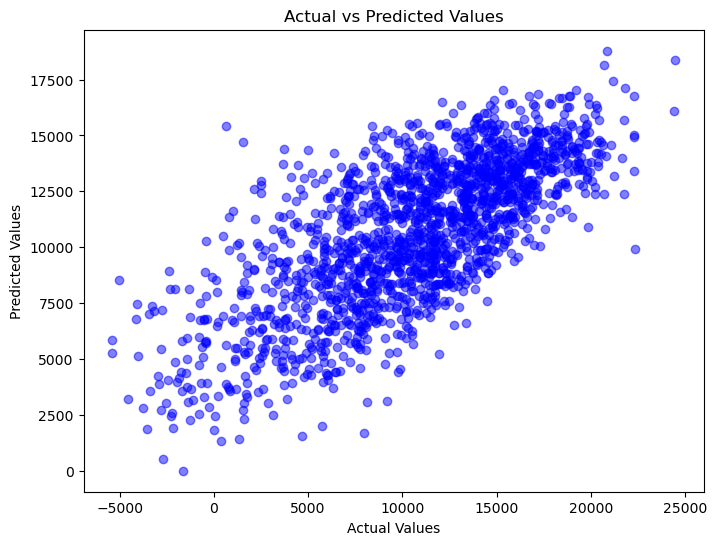

In [1604]:
# Predictions on the validation data
predicted_values = xgboost.predict(x_validate)

# Scatter plot for actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_validate, predicted_values, color='blue', alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

##### *6.2.8.3 Saving the Model:*

Train model on the complete training dataset:

In [1605]:
xgboost.fit(X_standardise, y_data)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

Make predictions using the test dataset:

In [1606]:
predicted_y_test_xgb = xgboost.predict(df_test_limited)

In [1607]:
# Make Dataframe from predicted values
xgb_pred_df = pd.DataFrame(predicted_y_test_xgb, columns=['load_shortfall_3h'])

original_test_df = pd.read_csv("df_test.csv")

# Make Dataframe from corresponding dates
date_df_xgb = pd.DataFrame({'time':original_test_df['time']})

# Join dataframes to create a single submission dataframe
submission_df_xgb = date_df_xgb.join(xgb_pred_df)

#Save submission as csv
submission_df_xgb.to_csv('XGBoost_Predictions', index=False)

submission_df_xgb

,time,load_shortfall_3h
0,2018-01-01 00:00:00,10013.655273
1,2018-01-01 03:00:00,5564.135742
2,2018-01-01 06:00:00,5085.805664
3,2018-01-01 09:00:00,8688.833984
4,2018-01-01 12:00:00,10085.484375
...,...,...
2915,2018-12-31 09:00:00,8100.609863
2916,2018-12-31 12:00:00,9035.296875
2917,2018-12-31 15:00:00,9704.222656
2918,2018-12-31 18:00:00,10561.593750


##### **6.2.9. CatBoost:** 

##### *6.2.9.1 Fitting the Model:*

Create the model:

In [1608]:
catboost = cb.CatBoostRegressor(random_seed=42)

Fit the model:

In [1609]:
catboost.fit(x_train, y_train)

Learning rate set to 0.055693
0:	learn: 5092.2720291	total: 19.3ms	remaining: 19.3s
1:	learn: 5021.9791331	total: 31.6ms	remaining: 15.8s
2:	learn: 4937.8331218	total: 45.5ms	remaining: 15.1s
3:	learn: 4864.6594087	total: 78.4ms	remaining: 19.5s
4:	learn: 4806.7084960	total: 86.1ms	remaining: 17.1s
5:	learn: 4741.6104142	total: 97.2ms	remaining: 16.1s
6:	learn: 4691.5855967	total: 106ms	remaining: 15s
7:	learn: 4641.0582716	total: 114ms	remaining: 14.2s
8:	learn: 4588.2562912	total: 126ms	remaining: 13.8s
9:	learn: 4542.7912075	total: 138ms	remaining: 13.6s
10:	learn: 4505.3948224	total: 147ms	remaining: 13.2s
11:	learn: 4465.9140704	total: 159ms	remaining: 13.1s
12:	learn: 4426.8239122	total: 169ms	remaining: 12.8s
13:	learn: 4400.6886380	total: 175ms	remaining: 12.4s
14:	learn: 4373.1160632	total: 184ms	remaining: 12.1s
15:	learn: 4350.4088738	total: 192ms	remaining: 11.8s
16:	learn: 4321.1388338	total: 201ms	remaining: 11.6s
17:	learn: 4292.6436865	total: 209ms	remaining: 11.4s
18:	

800:	learn: 2198.2911845	total: 8.9s	remaining: 2.21s
801:	learn: 2197.3045330	total: 8.91s	remaining: 2.2s
802:	learn: 2196.2407314	total: 8.93s	remaining: 2.19s
803:	learn: 2194.7145055	total: 8.95s	remaining: 2.18s
804:	learn: 2193.3371643	total: 8.96s	remaining: 2.17s
805:	learn: 2192.6398264	total: 8.97s	remaining: 2.16s
806:	learn: 2192.3290404	total: 8.98s	remaining: 2.15s
807:	learn: 2190.9877426	total: 9s	remaining: 2.14s
808:	learn: 2190.3949246	total: 9.01s	remaining: 2.13s
809:	learn: 2189.6078127	total: 9.02s	remaining: 2.12s
810:	learn: 2188.5192225	total: 9.03s	remaining: 2.1s
811:	learn: 2187.5066446	total: 9.05s	remaining: 2.1s
812:	learn: 2186.8475247	total: 9.08s	remaining: 2.09s
813:	learn: 2185.4422967	total: 9.1s	remaining: 2.08s
814:	learn: 2184.5092865	total: 9.13s	remaining: 2.07s
815:	learn: 2183.5129143	total: 9.15s	remaining: 2.06s
816:	learn: 2182.4327387	total: 9.17s	remaining: 2.05s
817:	learn: 2181.5751821	total: 9.19s	remaining: 2.04s
818:	learn: 2180.9

##### *6.2.9.2 Model Results:*

Test the model:

In [1610]:
catboost_pred = catboost.predict(x_validate)

Root Mean Square Error:

In [1611]:
# Calculate RMSE
rmse_cb = metrics.mean_squared_error(y_validate, catboost_pred, squared=False)

print("Root Mean Squared Error:", rmse_cb)

Root Mean Squared Error: 3031.8016962461043


R_Squared:

In [1612]:
# Calculate R-squared
r_squared_cb = r2_score(y_validate, catboost_pred)

print("R-squared:", r_squared_cb)

R-squared: 0.6736193412508331


Mean Absolute Error:

In [1613]:
# Calculate MAE
mae_cb = mean_absolute_error(y_validate, catboost_pred)

print("Mean Absolute Error:", mae_cb)

Mean Absolute Error: 2378.8106421935463


Let's visualize our results:

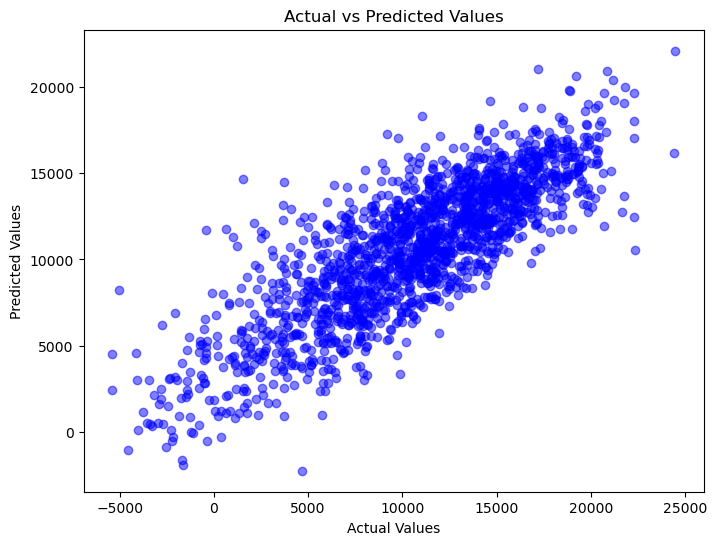

In [1614]:
# Predictions on the validation data
predicted_values = catboost.predict(x_validate)

# Scatter plot for actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_validate, predicted_values, color='blue', alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

##### *6.2.9.3 Saving the Model:*

Train model on the complete training dataset:

In [1615]:
catboost.fit(X_standardise, y_data)

Learning rate set to 0.057692
0:	learn: 5111.1371167	total: 12.9ms	remaining: 12.9s
1:	learn: 5037.8345823	total: 21.2ms	remaining: 10.6s
2:	learn: 4956.4955085	total: 31.8ms	remaining: 10.6s
3:	learn: 4880.5142032	total: 41.8ms	remaining: 10.4s
4:	learn: 4813.7937982	total: 50.2ms	remaining: 9.99s
5:	learn: 4752.1930056	total: 60.1ms	remaining: 9.95s
6:	learn: 4697.7430222	total: 69.6ms	remaining: 9.87s
7:	learn: 4641.4859990	total: 79.6ms	remaining: 9.87s
8:	learn: 4591.5827306	total: 88.3ms	remaining: 9.72s
9:	learn: 4545.2458524	total: 98.1ms	remaining: 9.71s
10:	learn: 4508.0630639	total: 112ms	remaining: 10.1s
11:	learn: 4464.8897525	total: 121ms	remaining: 10s
12:	learn: 4429.9622538	total: 137ms	remaining: 10.4s
13:	learn: 4397.4761143	total: 150ms	remaining: 10.6s
14:	learn: 4366.9701598	total: 162ms	remaining: 10.7s
15:	learn: 4345.1793054	total: 174ms	remaining: 10.7s
16:	learn: 4314.7290904	total: 186ms	remaining: 10.7s
17:	learn: 4288.8793778	total: 199ms	remaining: 10.8s


344:	learn: 2826.3396245	total: 3.52s	remaining: 6.68s
345:	learn: 2823.9344618	total: 3.53s	remaining: 6.67s
346:	learn: 2822.5430911	total: 3.54s	remaining: 6.66s
347:	learn: 2820.0015595	total: 3.55s	remaining: 6.65s
348:	learn: 2817.6833734	total: 3.56s	remaining: 6.64s
349:	learn: 2815.4823992	total: 3.57s	remaining: 6.63s
350:	learn: 2813.0242831	total: 3.58s	remaining: 6.62s
351:	learn: 2812.0573325	total: 3.59s	remaining: 6.61s
352:	learn: 2809.8046871	total: 3.6s	remaining: 6.6s
353:	learn: 2806.5630749	total: 3.63s	remaining: 6.63s
354:	learn: 2802.9034518	total: 3.65s	remaining: 6.63s
355:	learn: 2801.3012926	total: 3.67s	remaining: 6.64s
356:	learn: 2799.1641210	total: 3.73s	remaining: 6.71s
357:	learn: 2797.8965715	total: 3.74s	remaining: 6.71s
358:	learn: 2795.2598632	total: 3.78s	remaining: 6.75s
359:	learn: 2794.1570087	total: 3.88s	remaining: 6.9s
360:	learn: 2791.7726240	total: 3.9s	remaining: 6.91s
361:	learn: 2789.6528815	total: 3.92s	remaining: 6.92s
362:	learn: 27

Make predictions using the test dataset:

In [1616]:
predicted_y_test_cat = catboost.predict(df_test_limited)

In [1617]:
# Make Dataframe from predicted values
cat_pred_df = pd.DataFrame(predicted_y_test_cat, columns=['load_shortfall_3h'])

original_test_df = pd.read_csv("df_test.csv")

# Make Dataframe from corresponding dates
date_df_cat = pd.DataFrame({'time':original_test_df['time']})

# Join dataframes to create a single submission dataframe
submission_df_cat = date_df_cat.join(cat_pred_df)

#Save submission as csv
submission_df_cat.to_csv('Catboost_Predictions', index=False)

submission_df_cat

,time,load_shortfall_3h
0,2018-01-01 00:00:00,6389.921536
1,2018-01-01 03:00:00,2860.873410
2,2018-01-01 06:00:00,2086.068312
3,2018-01-01 09:00:00,3651.130940
4,2018-01-01 12:00:00,5164.458275
...,...,...
2915,2018-12-31 09:00:00,8319.074309
2916,2018-12-31 12:00:00,9135.588987
2917,2018-12-31 15:00:00,9682.016543
2918,2018-12-31 18:00:00,10074.949985


##### **6.2.10. Extra Trees Regression:** 

##### *6.2.10.1 Fitting the Model:*

Create the model:

In [1618]:
extra_trees = ExtraTreesRegressor(n_estimators=100, random_state=42)

Fit the model:

In [1619]:
extra_trees.fit(x_train, y_train)

ExtraTreesRegressor(random_state=42)

##### *6.2.10.2 Model Results:*

Test the model:

In [1620]:
et_pred = extra_trees.predict(x_validate)

Root Mean Squared Error:

In [1621]:
# Calculate RMSE
rmse_et = metrics.mean_squared_error(y_validate, et_pred, squared=False)

print("Root Mean Squared Error:", rmse_et)

Root Mean Squared Error: 3064.8377343790025


R-Squared:

In [1622]:
# Calculate R-squared
r_squared_et = r2_score(y_validate, et_pred)

print("R-squared:", r_squared_et)

R-squared: 0.6664677727842698


Mean Absolute Error:

In [1623]:
# Calculate MAE
mae_et = mean_absolute_error(y_validate, et_pred)

print("Mean Absolute Error:", mae_et)

Mean Absolute Error: 2391.105963586235


Let's visualize our results:

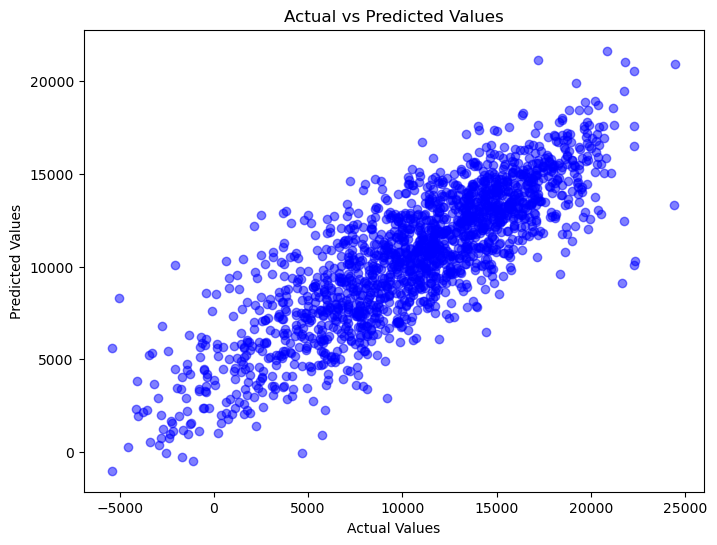

In [1624]:
# Predictions on the validation data
predicted_values = extra_trees.predict(x_validate)

# Scatter plot for actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_validate, predicted_values, color='blue', alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

##### *6.2.10.3 Saving the Model:*

Train model on the complete training dataset:

In [1625]:
extra_trees.fit(X_standardise, y_data)

ExtraTreesRegressor(random_state=42)

Make predictions using the test dataset:

In [1626]:
predicted_y_test_et = extra_trees.predict(df_test_limited)

In [1627]:
# Make Dataframe from predicted values
et_pred_df = pd.DataFrame(predicted_y_test_et, columns=['load_shortfall_3h'])

original_test_df = pd.read_csv("df_test.csv")

# Make Dataframe from corresponding dates
date_df_et = pd.DataFrame({'time':original_test_df['time']})

# Join dataframes to create a single submission dataframe
submission_df_et = date_df_et.join(et_pred_df)

#Save submission as csv
submission_df_et.to_csv('Extra_Trees_Predictions', index=False)

submission_df_et

,time,load_shortfall_3h
0,2018-01-01 00:00:00,7907.506667
1,2018-01-01 03:00:00,6346.886667
2,2018-01-01 06:00:00,5273.520000
3,2018-01-01 09:00:00,6283.150000
4,2018-01-01 12:00:00,4664.976667
...,...,...
2915,2018-12-31 09:00:00,7900.293333
2916,2018-12-31 12:00:00,11295.463333
2917,2018-12-31 15:00:00,12023.920000
2918,2018-12-31 18:00:00,11105.936667


<a id="six"></a>
## 7. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section you are required to compare the relative performance of the various trained ML models on a holdout dataset and comment on what model is the best and why. |

---

### **6.1. Model comparisons:** 

In [1628]:
print("Linear Regression - RMSE:", rmse_lr, "R-squared:", r_squared_lr, "MAE:", mae_lr)
print("Ridge Regression - RMSE:", rmse_rr, "R-squared:", r_squared_rr, "MAE:", mae_rr)
print("LASSO Regression - RMSE:", rmse_lasso, "R-squared:", r_squared_lasso, "MAE:", mae_lasso)
print("Decision Tree - RMSE:", rmse_dt, "R-squared:", r_squared_dt, "MAE:", mae_dt)
print("Voting Ensamble - RMSE:", rmse_ve, "R-squared:", r_squared_ve, "MAE:", mae_ve)
print("Bagging Ensamble - RMSE:", rmse_bag, "R-squared:", r_squared_bag, "MAE:", mae_bag)
print("Random Forest - RMSE:", rmse_rf, "R-squared:", r_squared_rf, "MAE:", mae_rf)
print("XGBoost - RMSE:", rmse_xgb, "R-squared:", r_squared_xgb, "MAE:", mae_xgb)
print("Catboost - RMSE:", rmse_cb, "R-squared:", r_squared_cb, "MAE:", mae_cb)
print("Extra Tree - RMSE:", rmse_et, "R-squared:", r_squared_et, "MAE:", mae_et)

Linear Regression - RMSE: 4912.27755417605 R-squared: 0.14318191189095186 MAE: 3918.7579910670333
Ridge Regression - RMSE: 4913.077007754487 R-squared: 0.14290300174450943 MAE: 3920.171879413213
LASSO Regression - RMSE: 4912.298732118394 R-squared: 0.1431745240009219 MAE: 3918.7961505633048
Decision Tree - RMSE: 3989.572079789285 R-squared: 0.43483473378584403 MAE: 3107.2498830038207
Voting Ensamble - RMSE: 3181.932973901099 R-squared: 0.6404950406859022 MAE: 2510.072774568804
Bagging Ensamble - RMSE: 3164.136081110451 R-squared: 0.6445052940264244 MAE: 2486.2657014061947
Random Forest - RMSE: 3257.4799186659743 R-squared: 0.6232213153514446 MAE: 2550.128610477278
XGBoost - RMSE: 3708.18339496474 R-squared: 0.5117466394936174 MAE: 2965.9989684968655
Catboost - RMSE: 3031.8016962461043 R-squared: 0.6736193412508331 MAE: 2378.8106421935463
Extra Tree - RMSE: 3064.8377343790025 R-squared: 0.6664677727842698 MAE: 2391.105963586235


In [1631]:
labels = ['Linear Regression', 'Ridge Regression', 'LASSO Regression', 'Decision Tree', 'Voting Ensamble', 'Bagging Ensamble', 'Random Forest ', 
          'XGBoost', 'Catboost', 'Extra Tree']
rmse_values = [rmse_lr, rmse_rr, rmse_lasso, rmse_dt, rmse_ve, rmse_bag, rmse_rf, rmse_xgb, rmse_cb, rmse_et]
r2_values = [r_squared_lr, r_squared_rr, r_squared_lasso, r_squared_dt, r_squared_ve, r_squared_bag, r_squared_rf, r_squared_xgb, r_squared_cb, r_squared_et]
mae_values = [mae_lr, mae_rr, mae_lasso, mae_dt, mae_ve, mae_bag, mae_rf, mae_xgb, mae_cb, mae_et]

In [1637]:
# Sort values and labels by RMSE in descending order
rmse_sorted = [x for _, x in sorted(zip(rmse_values, labels), reverse=True)]
r2_sorted = [x for _, x in sorted(zip(r2_values, labels), reverse=True)]
mae_sorted = [x for _, x in sorted(zip(mae_values, labels), reverse=True)]
rmse_values_sorted = sorted(rmse_values, reverse=True)
r2_values_sorted = sorted(r2_values, reverse=True)
mae_values_sorted = sorted(mae_values, reverse=True)

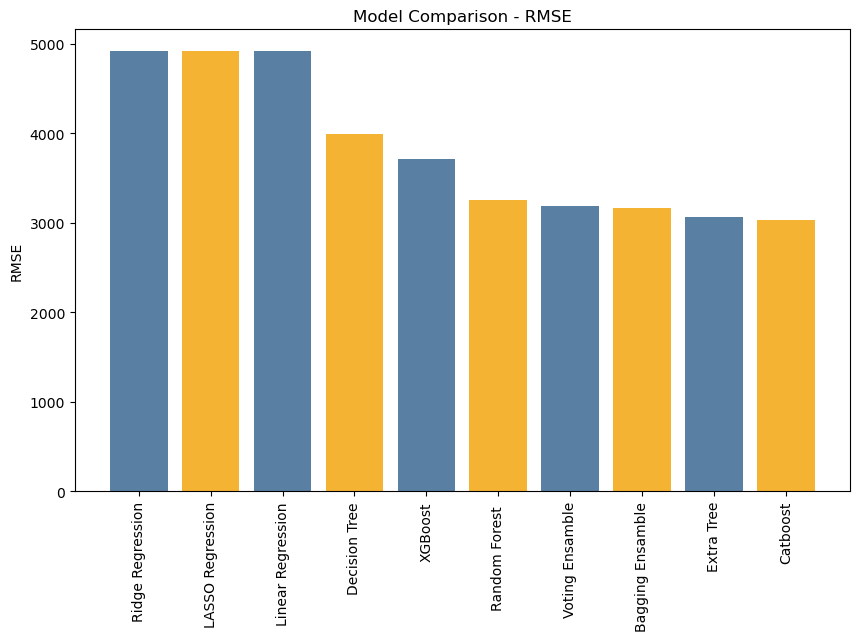

In [1641]:
# Plotting RMSE with vertical x-axis labels in descending order
plt.figure(figsize=(10, 6))
plt.bar(rmse_sorted, rmse_values_sorted, color=['#597FA3', '#F5B334'])
plt.ylabel('RMSE')
plt.title('Model Comparison - RMSE')
plt.xticks(rotation=90)  # Rotate x-axis labels
plt.show()

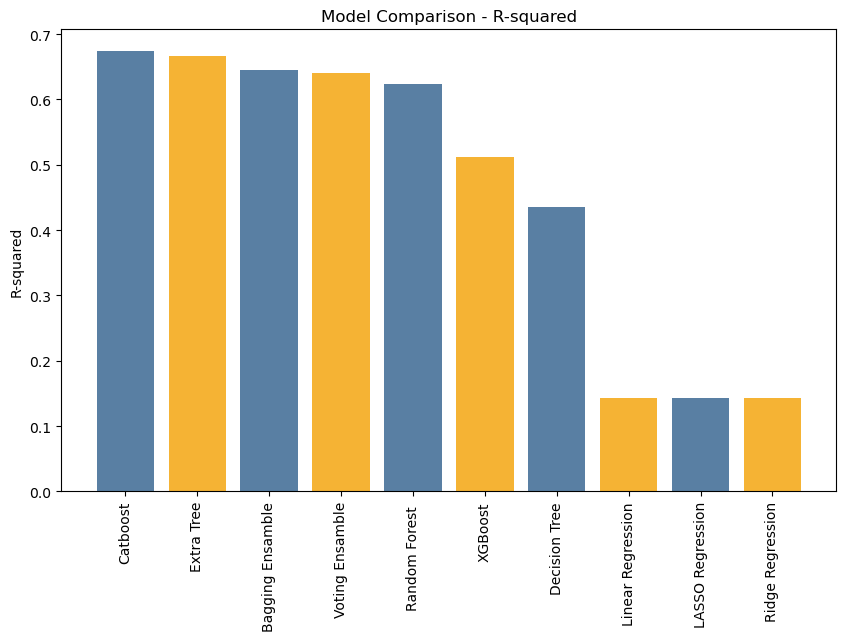

In [1642]:
# Plotting R-squared with vertical x-axis labels in descending order
plt.figure(figsize=(10, 6))
plt.bar(r2_sorted, r2_values_sorted, color=['#597FA3', '#F5B334'])
plt.ylabel('R-squared')
plt.title('Model Comparison - R-squared')
plt.xticks(rotation=90)  # Rotate x-axis labels
plt.show()

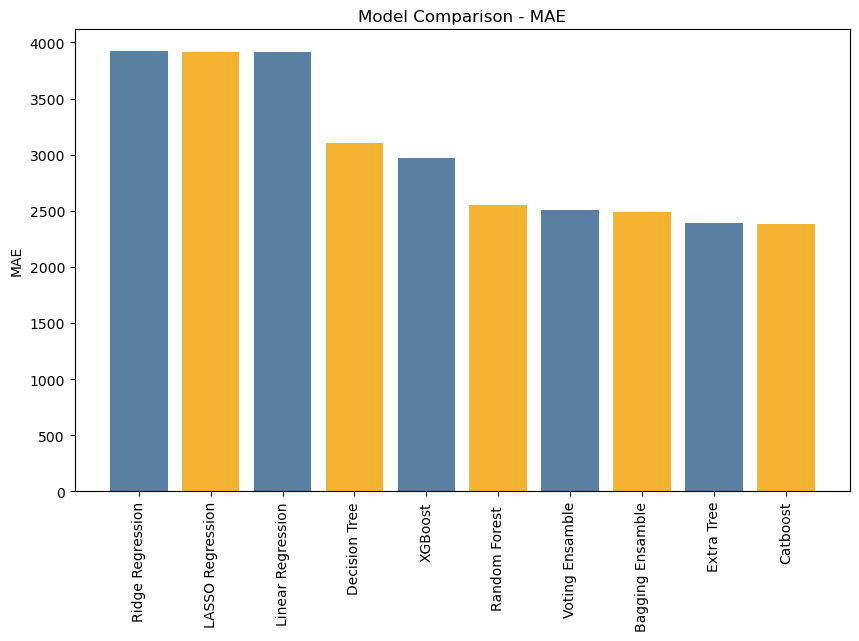

In [1644]:
# Plotting MAE with vertical x-axis labels in descending order
plt.figure(figsize=(10, 6))
plt.bar(mae_sorted, mae_values_sorted, color=['#597FA3', '#F5B334'])
plt.ylabel('MAE')
plt.title('Model Comparison - MAE')
plt.xticks(rotation=90)  # Rotate x-axis labels
plt.show()

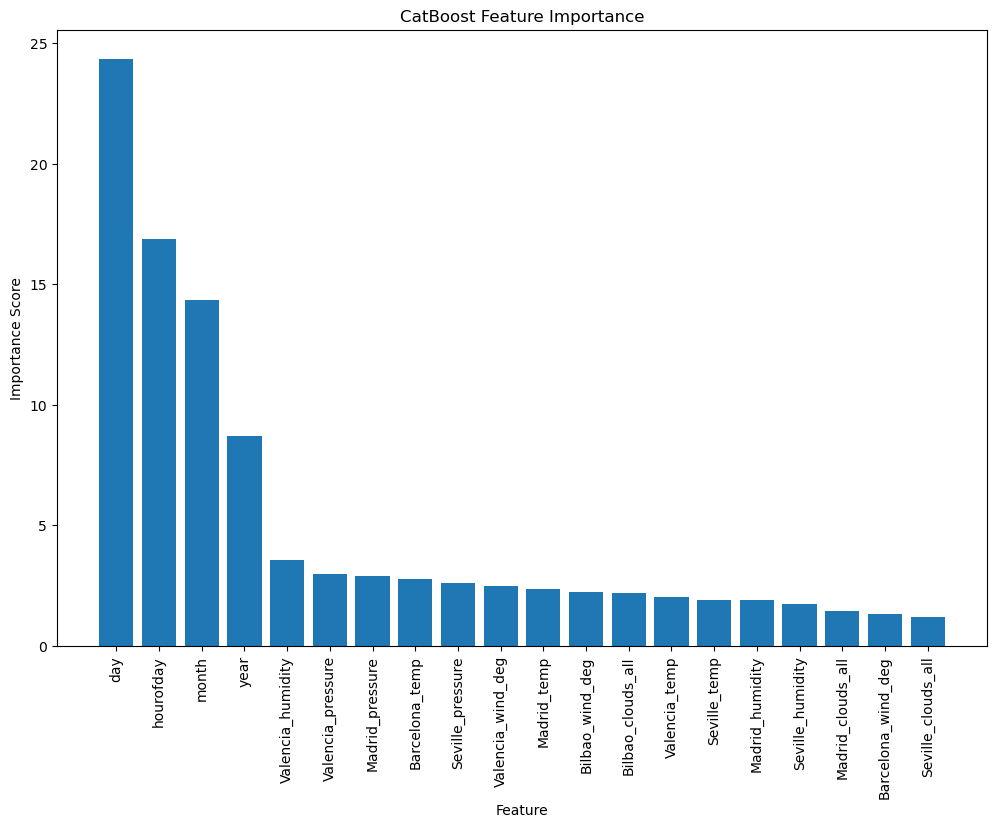

In [1645]:
# Get feature importance
feature_importance = catboost.get_feature_importance()

# Get feature names
feature_names = x_train.columns

# Sort feature importance in descending order
sorted_idx = feature_importance.argsort()[::-1]
sorted_feature_importance = feature_importance[sorted_idx]
sorted_feature_names = feature_names[sorted_idx]

# Plot feature importance
plt.figure(figsize=(12, 8))
plt.bar(range(len(sorted_feature_importance)), sorted_feature_importance, align='center')
plt.xticks(range(len(sorted_feature_importance)), sorted_feature_names, rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance Score')
plt.title('CatBoost Feature Importance')
plt.show()

### **6.2. Best model:** 

In [1629]:
# Choose best model and motivate why it is the best choice

### **6.3. Kaggle Model Finetuning:** 

<a id="seven"></a>
## 7. Model Explanations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model explanation ⚡ |
| :--------------------------- |
| In this section, you are required to discuss how the best performing model works in a simple way so that both technical and non-technical stakeholders can grasp the intuition behind the model's inner workings. |

---

In [1630]:
# discuss chosen methods logic